Nadav Spitzer 302228275
Shimon Cohen 315383133

# Imports section

In [1]:
import pandas as pd
import numpy as np
import scipy

# statistics
from scipy import stats

#data visualizations
import matplotlib.pyplot as plt
%matplotlib inline
#%matplotlib widget

#Machine learning library
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

from plot import *
from data_proccessing import *
from histogram_matching import *
from utils import *

import warnings
warnings.filterwarnings("ignore")

In [2]:
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import r2_score, mean_squared_error, \
    mean_absolute_percentage_error,mean_absolute_error, accuracy_score

Manage kaggle file. In order to run, you need to supply your own.

In [3]:
!mkdir ~/.kaggle

mkdir: cannot create directory ‘/home/shimon/.kaggle’: File exists


In [4]:
!cp kaggle.json ~/.kaggle

In [5]:
!chmod 600 ~/.kaggle/kaggle.json

# Histogarm Matching

## Test the histogram equalization

We wanted to test the histogram matching algorithm on several random distribution.\
The results are shown below where the blue histograms are the original distributions and the orange are the distribution after normalization.\
Above each plot there is the P-value of KS-test of the normalized distribution, to see how well it matches a normal distribution.

In [6]:
rnd = np.random

funcs = [rnd.power, rnd.lognormal, rnd.poisson, rnd.weibull, rnd.uniform, rnd.pareto, rnd.standard_t, rnd.dirichlet]

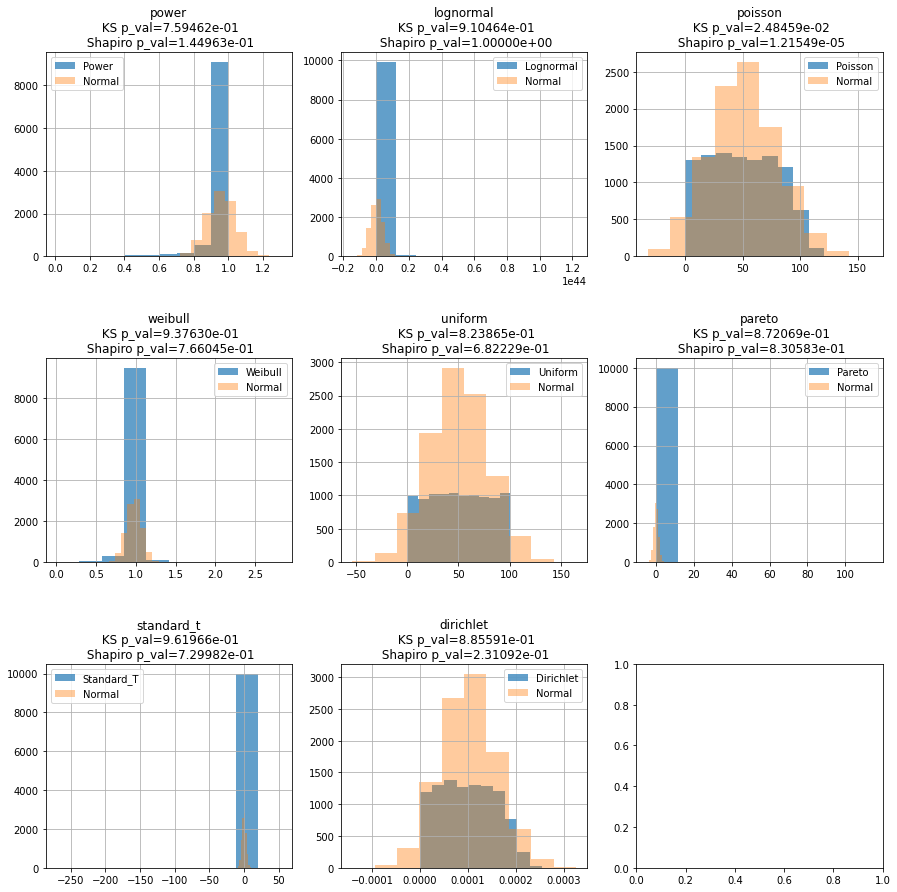

In [7]:
n = len(funcs)
cols = 3
rows=(n//3) + 1 if n%3 !=0 else (n // 3)

#generate a figures grid:
fig, axes = plt.subplots(rows,cols,figsize=(cols*5,rows*5))
fig.subplots_adjust(hspace=0.5)

for i, func in enumerate(funcs):
    # simple example - from uniform to normal
    if func is not np.random.uniform:
        src_dist = func(np.random.uniform(1, 100, 10_000))
    else:
        src_dist = np.random.uniform(1, 100, 10_000)

    m, s = src_dist.mean(), src_dist.std()
    dst_dist = np.random.normal(m, s, 10_000)

    match = histogram_matching(src_dist, dst_dist)

    #calculate the current place on the grid
    r=int(i/cols)
    c=i%cols

    df = pd.DataFrame({f'{func.__name__}':src_dist, 'normal_match':match}, index=[np.zeros(10_000)])


    m,s = stats._continuous_distns.norm.fit(df['normal_match'])
    ks_res, ks_pval = scipy.stats.kstest(df['normal_match'].values,stats._continuous_distns.norm.cdf,args=(m,s))

    shapiro_res, shapiro_pval = stats.shapiro(df['normal_match'].values)
    # build the histograms

    df[f'{func.__name__}'].hist(alpha=0.7, ax=axes[r,c])
    df.normal_match.hist(alpha=0.4, ax=axes[r,c])
    axes[r,c].set_title(f'{func.__name__}\n KS p_val={ks_pval:.5e}\n Shapiro p_val={shapiro_pval:.5e}')
    axes[r,c].legend([f'{func.__name__.title()}', 'Normal'])

One of the most common examples is using the histogram matching algorithm in order to alter an image contrust.\
In this example, we took an image with low contrust and matched it to a unifom distribution in order to have better quality.

### Download example image

In [8]:
!wget http://3.bp.blogspot.com/-SC-w7eTgpM0/URE9NsI_nuI/AAAAAAAAAGE/YmlWnimNuPM/s320/7957178556_001939ffc5_z.jpg -O ./image.jpg

--2022-03-18 16:23:46--  http://3.bp.blogspot.com/-SC-w7eTgpM0/URE9NsI_nuI/AAAAAAAAAGE/YmlWnimNuPM/s320/7957178556_001939ffc5_z.jpg
Resolving 3.bp.blogspot.com (3.bp.blogspot.com)... 2a00:1450:4001:812::2001, 142.250.185.193
Connecting to 3.bp.blogspot.com (3.bp.blogspot.com)|2a00:1450:4001:812::2001|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 22102 (22K) [image/jpeg]
Saving to: ‘./image.jpg’

./image.jpg         100%[===================>]  21.58K  --.-KB/s    in 0.08s   

2022-03-18 16:23:46 (282 KB/s) - ‘./image.jpg’ saved [22102/22102]



### Example on images

Show the result of an image after running the Histogram Matching to a uniform distribution.

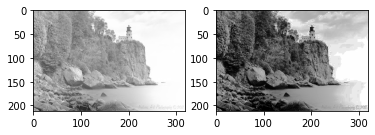

In [9]:
from PIL import Image, ImageOps

# load the image
low_contrast_image = Image.open('./image.jpg')
low_contrast_image = ImageOps.grayscale(low_contrast_image)

low_contrast_image = np.array(low_contrast_image)

dst_dist = np.arange(0, 256)

image = histogram_matching(low_contrast_image, dst_dist)

fig, (ax1, ax2) = plt.subplots(1, 2)
# show low contrast image
ax1.imshow(low_contrast_image, cmap=plt.cm.gray)
# show image after histogram matching to uniform distribution
ax2.imshow(image, cmap=plt.cm.gray)

# Try on first Dataset (Regression)

Link to dataset: https://www.kaggle.com/wkirgsn/electric-motor-temperature

Disclaimer: we explain the steps for the first data set, but not for all of them. The steps are the same for the rest.

Firt we load the dataset and check its features.

In [11]:
!if [ ! -f datasets/measures_v2.csv ]; then kaggle datasets download --unzip -d wkirgsn/electric-motor-temperature -p datasets/; fi;

In [12]:
measures_df = pd.read_csv('./datasets/measures_v2.csv')

In [13]:
measures_df.describe()

,u_q,coolant,stator_winding,u_d,stator_tooth,motor_speed,i_d,i_q,pm,stator_yoke,ambient,torque,profile_id
count,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06
mean,5.427900e+01,3.622999e+01,6.634275e+01,-2.513381e+01,5.687858e+01,2.202081e+03,-6.871681e+01,3.741278e+01,5.850678e+01,4.818796e+01,2.456526e+01,3.110603e+01,4.079306e+01
std,4.417323e+01,2.178615e+01,2.867206e+01,6.309197e+01,2.295223e+01,1.859663e+03,6.493323e+01,9.218188e+01,1.900150e+01,1.999100e+01,1.929522e+00,7.713575e+01,2.504549e+01
min,-2.529093e+01,1.062375e+01,1.858582e+01,-1.315304e+02,1.813398e+01,-2.755491e+02,-2.780036e+02,-2.934268e+02,2.085696e+01,1.807669e+01,8.783478e+00,-2.464667e+02,2.000000e+00
25%,1.206992e+01,1.869814e+01,4.278796e+01,-7.869090e+01,3.841601e+01,3.171107e+02,-1.154061e+02,1.095863e+00,4.315158e+01,3.199033e+01,2.318480e+01,-1.374265e-01,1.700000e+01
50%,4.893818e+01,2.690014e+01,6.511013e+01,-7.429755e+00,5.603635e+01,1.999977e+03,-5.109376e+01,1.577401e+01,6.026629e+01,4.562551e+01,2.479733e+01,1.086035e+01,4.300000e+01
75%,9.003439e+01,4.985749e+01,8.814114e+01,1.470271e+00,7.558668e+01,3.760639e+03,-2.979688e+00,1.006121e+02,7.200837e+01,6.146083e+01,2.621702e+01,9.159718e+01,6.500000e+01
max,1.330370e+02,1.015985e+02,1.413629e+02,1.314698e+02,1.119464e+02,6.000015e+03,5.189670e-02,3.017079e+02,1.136066e+02,1.011480e+02,3.071420e+01,2.610057e+02,8.100000e+01


In [14]:
print(measures_df.shape)
measures_df.head()

(1330816, 13)


,u_q,coolant,stator_winding,u_d,stator_tooth,motor_speed,i_d,i_q,pm,stator_yoke,ambient,torque,profile_id
0,-0.450682,18.805172,19.086670,-0.350055,18.293219,0.002866,0.004419,0.000328,24.554214,18.316547,19.850691,0.187101,17
1,-0.325737,18.818571,19.092390,-0.305803,18.294807,0.000257,0.000606,-0.000785,24.538078,18.314955,19.850672,0.245417,17
2,-0.440864,18.828770,19.089380,-0.372503,18.294094,0.002355,0.001290,0.000386,24.544693,18.326307,19.850657,0.176615,17
3,-0.327026,18.835567,19.083031,-0.316199,18.292542,0.006105,0.000026,0.002046,24.554018,18.330833,19.850647,0.238303,17
4,-0.471150,18.857033,19.082525,-0.332272,18.291428,0.003133,-0.064317,0.037184,24.565397,18.326662,19.850639,0.208197,17


In [15]:
measures_test_df = measures_df.loc[measures_df['profile_id'].isin([65, 72])].drop('profile_id', axis=1)
measures_train_df = measures_df.loc[~measures_df['profile_id'].isin([65, 72])].drop('profile_id', axis=1)

In [16]:
print(measures_train_df.shape)
print(measures_test_df.shape)

(1275421, 12)
(55395, 12)


We split the train and test datasets to regular and target features.

In [17]:
measures_train_df_X, measures_train_df_y = measures_train_df[['u_q', 'coolant', 'u_d', 'motor_speed', 'i_d', 'i_q', 'ambient', 'torque']], measures_train_df[['stator_yoke', 'stator_winding', 'stator_tooth', 'pm']]

In [18]:
print(measures_train_df_X.shape)
print(measures_train_df_y.shape)

(1275421, 8)
(1275421, 4)


In [19]:
measures_test_df_X, measures_test_df_y = measures_test_df[['u_q', 'coolant', 'u_d', 'motor_speed', 'i_d', 'i_q', 'ambient', 'torque']], measures_test_df[['stator_yoke', 'stator_winding', 'stator_tooth', 'pm']]

In [20]:
print(measures_test_df_X.shape)
print(measures_test_df_y.shape)

(55395, 8)
(55395, 4)


### Visualize histograms of features

In [21]:
measures_numeric_columns = measures_train_df_X.dtypes[(measures_train_df_X.dtypes=="float64") | (measures_train_df_X.dtypes=="int64")].index.tolist()

In [22]:
measures_numeric_columns, measures_categorical_columns = get_numeric_categorical_columns(measures_train_df_X, ['profile_id'])

column: u_q, %: 95.3708618565948
column: coolant, %: 83.23957344280831
column: u_d, %: 97.25282867382613
column: motor_speed, %: 56.62208792234094
column: i_d, %: 77.78576642536072
column: i_q, %: 76.01795799191012
column: ambient, %: 89.74550364154268
column: torque, %: 87.38659626899667
numeric_columns = ['u_q', 'coolant', 'u_d', 'motor_speed', 'i_d', 'i_q', 'ambient', 'torque']
categorical_columns = []


In [23]:
len(measures_train_df_X)

1275421

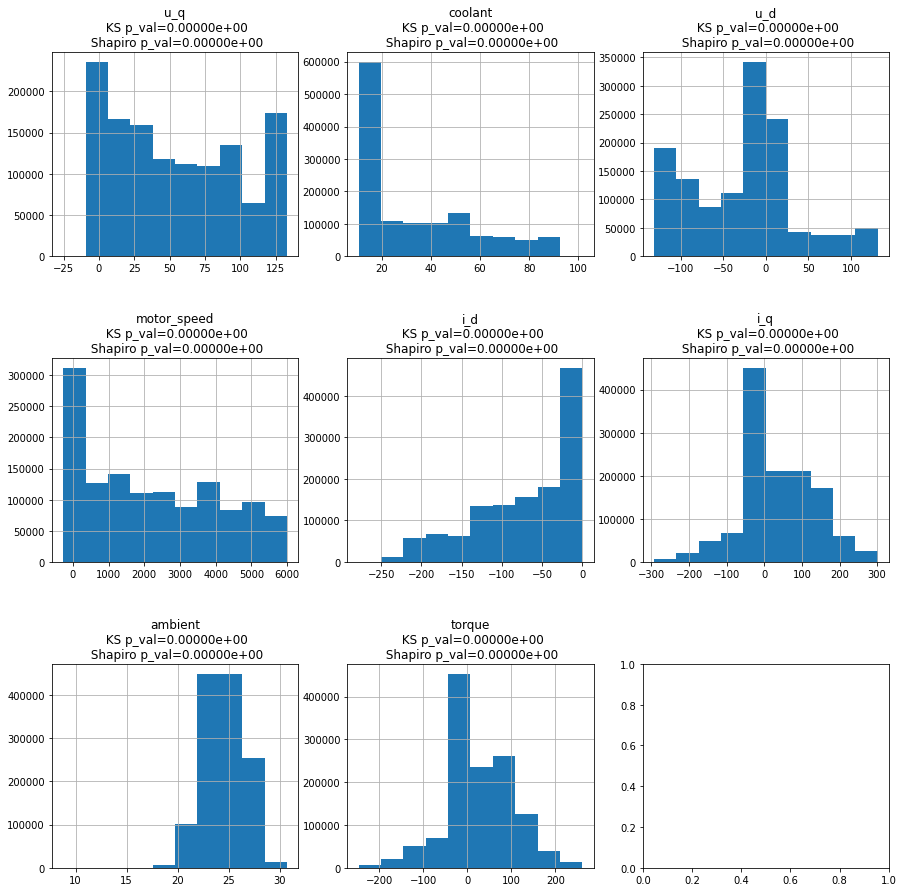

In [24]:
plot_numerical_histograms(measures_train_df_X, measures_numeric_columns)

### Compare Histogram-Matching to Yeo-Johnson

We wish to compare our normalization method to the well known yeo-johnson.

Show our algorithm's output.

Correction: u_q
Correction: coolant
Correction: u_d
Correction: motor_speed
Correction: i_d
Correction: i_q
Correction: ambient
Correction: torque


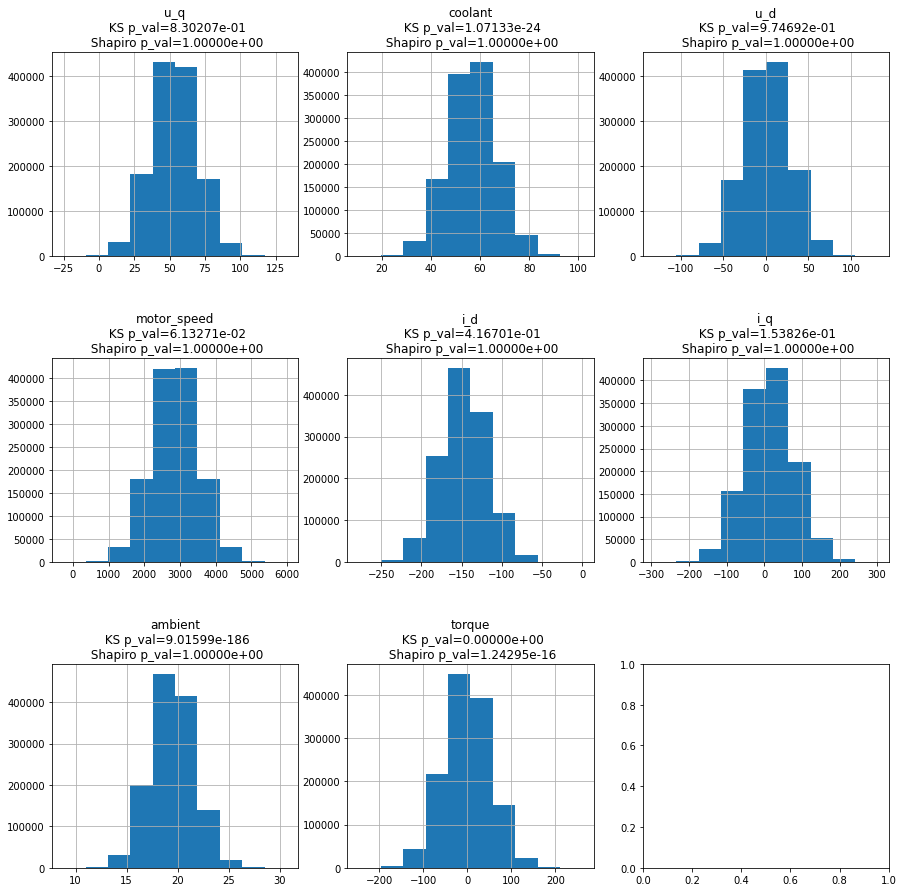

In [25]:
matched_measures_train_df_X, train_df_X_normal_mapping = transform_dataset(measures_train_df_X,\
                                                                           match_to_normal_distribution,
                                                                           correction=correction_func
                                                                           )

matched_measures_train_df_X_not, train_df_X_normal_mapping_not = transform_dataset(measures_train_df_X,\
                                                                           match_to_normal_distribution
                                                                           )

plot_numerical_histograms(matched_measures_train_df_X, measures_numeric_columns)

Show yeo-johnson's output.

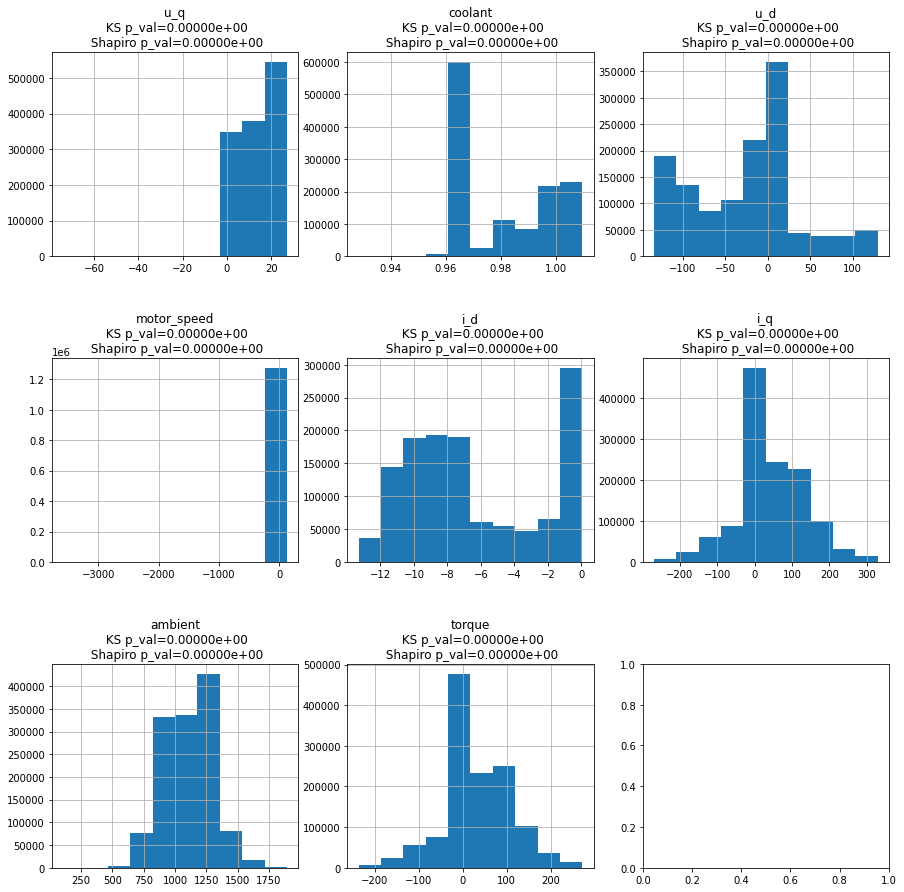

In [26]:
yeo_measures_train_df_X, train_df_X_yeo_mapping = transform_dataset(measures_train_df_X, stats.yeojohnson)
plot_numerical_histograms(yeo_measures_train_df_X, measures_numeric_columns)

#### Match test set X

Apply the transformation from the train on the test.

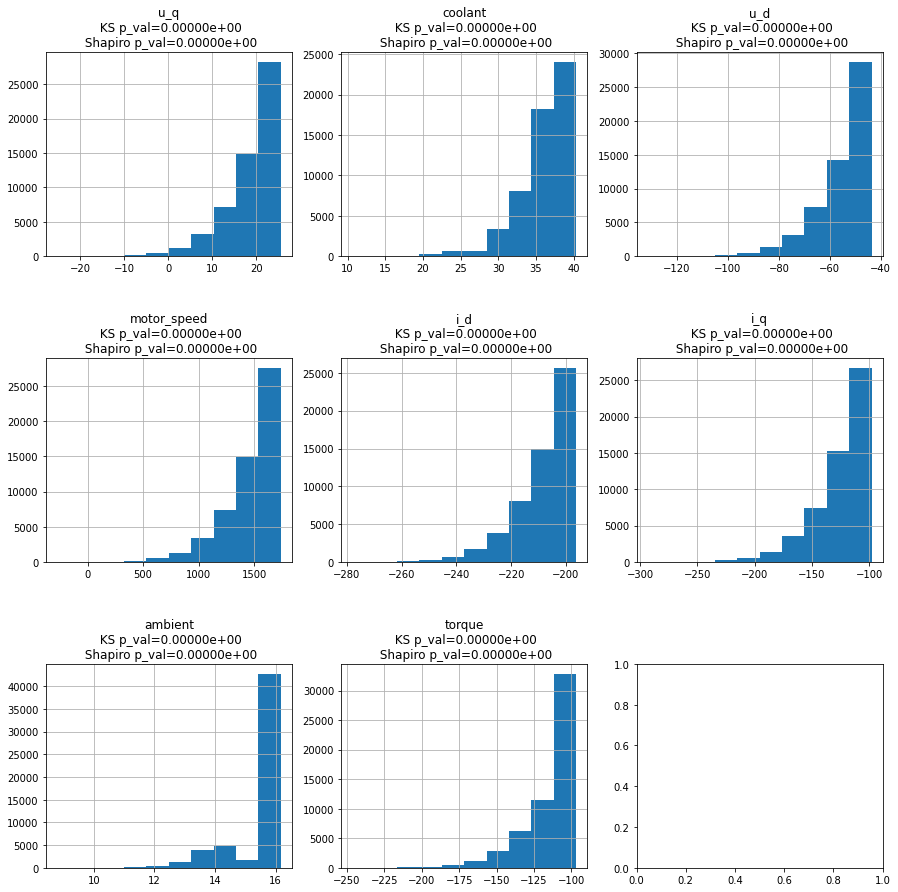

In [27]:
matched_measures_test_df_X, _ = transform_dataset(measures_test_df_X,\
                                                  match_to_normal_distribution,\
                                                  mapping=train_df_X_normal_mapping)
plot_numerical_histograms(matched_measures_test_df_X, measures_numeric_columns)

In [28]:
yeo_measures_test_df_X, _ = transform_dataset(measures_test_df_X, stats.yeojohnson, mapping=train_df_X_yeo_mapping)

## QQ plots of features

Now we will check the quality of our data transformation.
We will use QQ plots as a quality test to compare to a theoretical normal distribution.

### QQ plots for regular features

Compare original data to normal distribution.

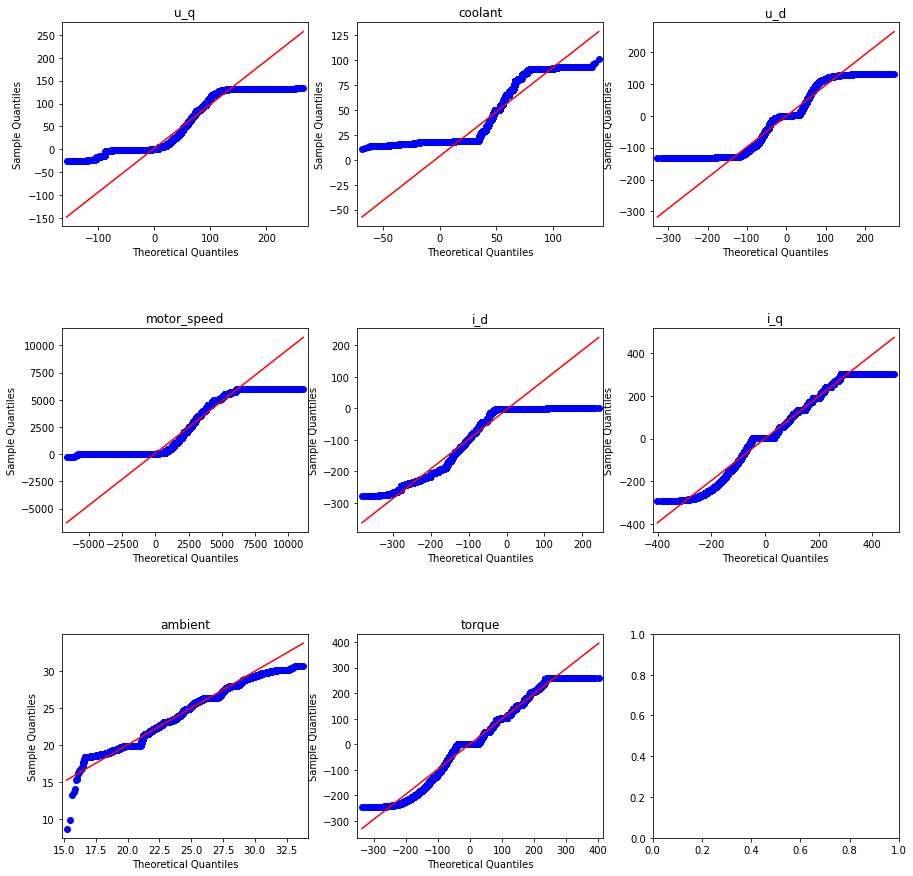

In [29]:
qq_plot_data(measures_train_df_X, measures_numeric_columns)

### QQ plots for Matched features

Compare histogram transformed data to normal distribution.

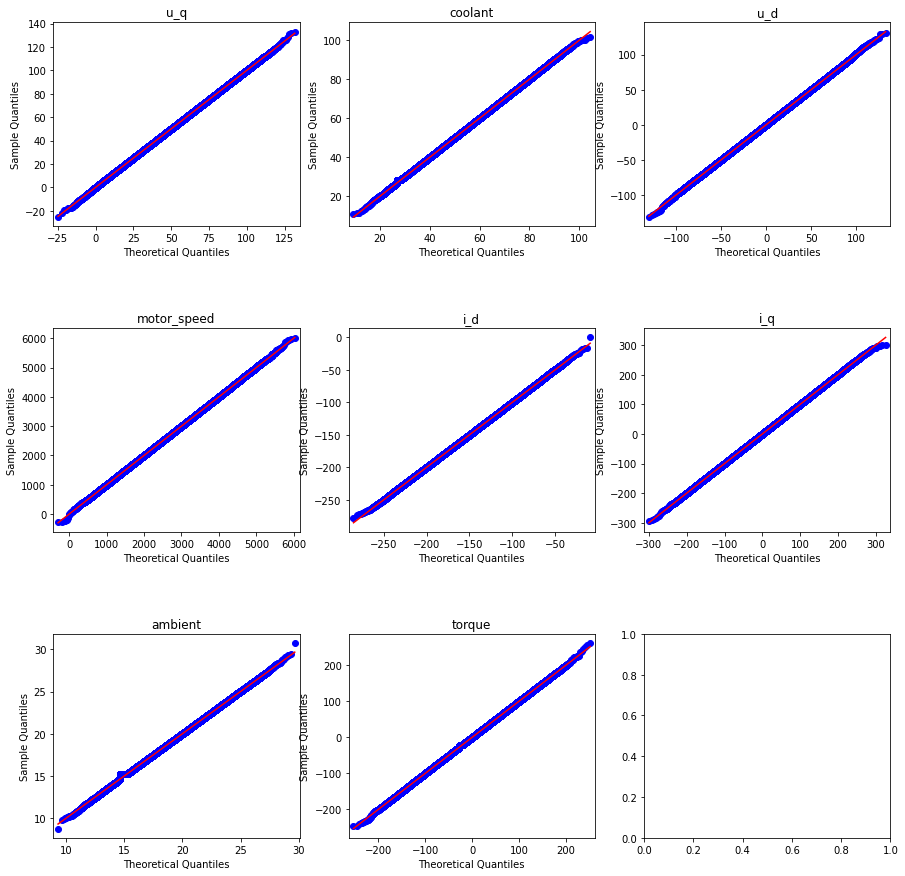

In [30]:
qq_plot_data(matched_measures_train_df_X, measures_numeric_columns)

### QQ plots for Yeo-Johnson features

Compare yeo-johnson data to normal distribution.

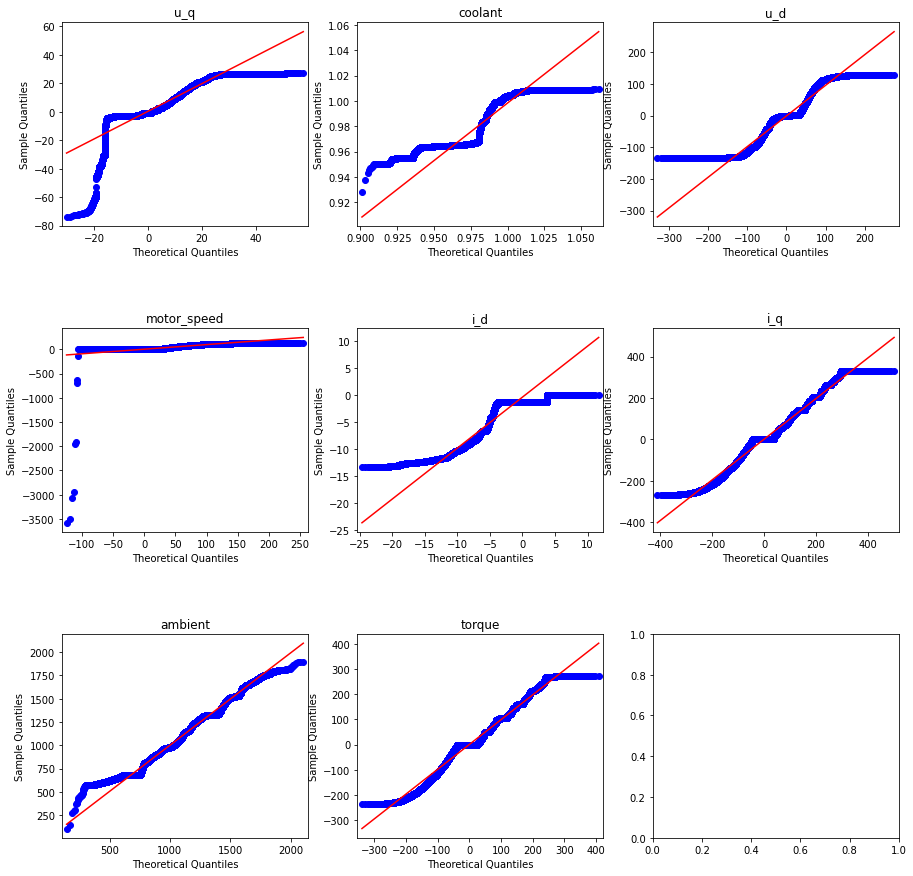

In [31]:
qq_plot_data(yeo_measures_train_df_X, measures_numeric_columns)

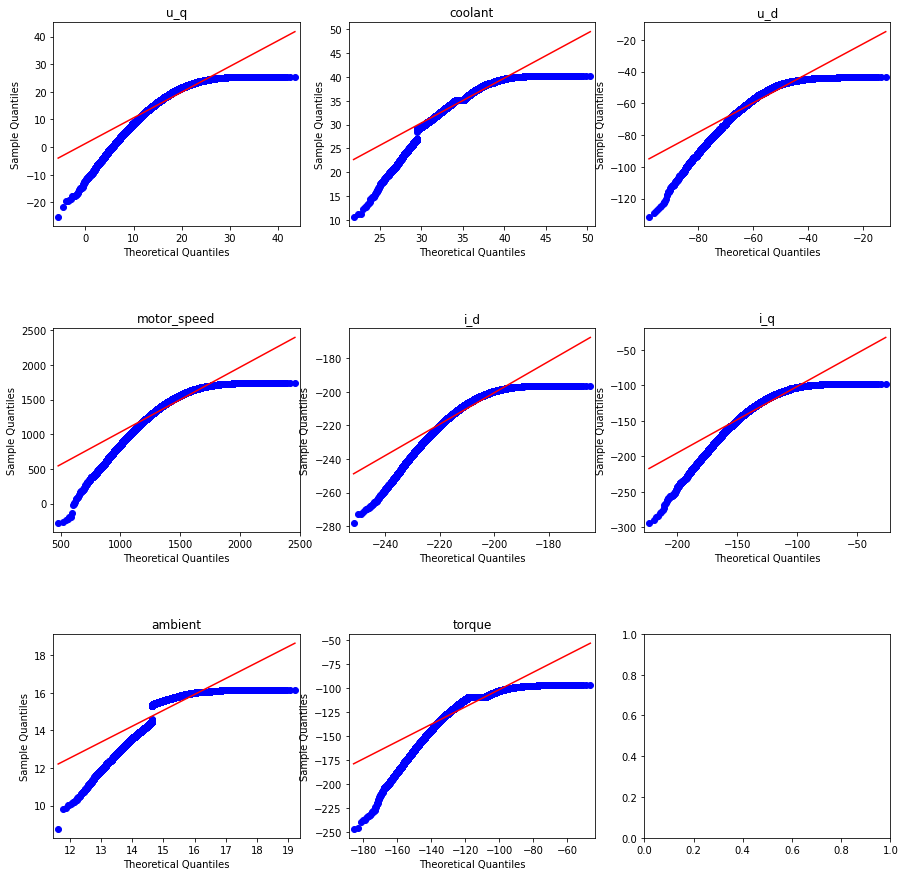

In [32]:
qq_plot_data(matched_measures_test_df_X, measures_numeric_columns)

## Compare model preformance

In addition to testing the quality of our transform, we wish to test how the transformed data affects the model's results compared to the original, and yeo transformed data.

### Test on regular data

Test model preformance on original data.

In [33]:
for column in measures_test_df_y:
    model = LinearRegression()
    prediction = model.fit(measures_train_df_X,measures_train_df_y[column]).predict(measures_test_df_X)
    print(f'column={column}, r2={r2_score(measures_test_df_y[column],prediction)}')
    print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(measures_test_df_y[column],prediction)))
    print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(measures_test_df_y[column], prediction)))
    print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(measures_test_df_y[column], prediction))))
    print('=' * 50)

column=stator_yoke, r2=0.8157037365081542
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.126
Mean Absolute Error (Σ|y - pred|/n): 6
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 8
column=stator_winding, r2=0.5806161453601706
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.215
Mean Absolute Error (Σ|y - pred|/n): 13
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 17
column=stator_tooth, r2=0.6648058996604785
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.178
Mean Absolute Error (Σ|y - pred|/n): 10
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 12
column=pm, r2=0.28225137362710206
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.170
Mean Absolute Error (Σ|y - pred|/n): 10
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 12


### Test on matched data

Test model preformance on histogram transformed data.

In [34]:
for column in measures_test_df_y:
    matched_model = LinearRegression()
    matched_prediction = matched_model.fit(matched_measures_train_df_X,measures_train_df_y[column]).predict(matched_measures_test_df_X)
    print(f'column={column}, r2={r2_score(measures_test_df_y[column], matched_prediction)}')
    print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(measures_test_df_y[column],matched_prediction)))
    print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(measures_test_df_y[column], matched_prediction)))
    print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(measures_test_df_y[column], matched_prediction))))
    print('=' * 50)

column=stator_yoke, r2=-3.425725302597579
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.627
Mean Absolute Error (Σ|y - pred|/n): 36
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 38
column=stator_winding, r2=0.16949622380934826
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.285
Mean Absolute Error (Σ|y - pred|/n): 20
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 24
column=stator_tooth, r2=-0.7182014608027694
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.303
Mean Absolute Error (Σ|y - pred|/n): 22
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 28
column=pm, r2=0.2099645740809638
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.186
Mean Absolute Error (Σ|y - pred|/n): 11
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 13


### Test on Yeo-Johnson data

Test model preformance on yeo-johnson transformed data.

In [35]:
for column in measures_test_df_y:
    yeo_model = LinearRegression()
    yeo_prediction = yeo_model.fit(yeo_measures_train_df_X,measures_train_df_y[column]).predict(yeo_measures_test_df_X)
    print(f'column={column}, r2={r2_score(measures_test_df_y[column], yeo_prediction)}')
    print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(measures_test_df_y[column],yeo_prediction)))
    print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(measures_test_df_y[column], yeo_prediction)))
    print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(measures_test_df_y[column], yeo_prediction))))
    print('=' * 50)

column=stator_yoke, r2=0.627605624306735
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.201
Mean Absolute Error (Σ|y - pred|/n): 10
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 11
column=stator_winding, r2=0.5092807190190152
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.254
Mean Absolute Error (Σ|y - pred|/n): 15
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 18
column=stator_tooth, r2=0.5503797540828994
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.225
Mean Absolute Error (Σ|y - pred|/n): 12
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 14
column=pm, r2=0.32294051349261976
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.167
Mean Absolute Error (Σ|y - pred|/n): 9
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 12


## Try to normalize only 1 column at a time and Compare to regular model

Before, we normalized all of the numeric columns. Now we attempt to see if normalizing only one column at a time has an affect on the model's results.

In [36]:
for column in measures_test_df_y:   
    compare_one_norm_column(measures_train_df_X, measures_test_df_X, measures_train_df_y[column], \
                            measures_test_df_y[column], matched_measures_train_df_X, \
                            matched_measures_test_df_X, yeo_measures_train_df_X, yeo_measures_test_df_X,\
                            column, measures_numeric_columns)

=== Measure for regular model: ===
column=stator_yoke, r2=0.8157037365081542
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.126
Mean Absolute Error (Σ|y - pred|/n): 6
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 8

=== Compare for column u_q ===
column=u_q, matched r2=0.8134082443291748
column=u_q, yeo r2=0.8156448287162383

=== Compare for column coolant ===
column=coolant, matched r2=-3.6687457401838577
column=coolant, yeo r2=0.6018165773800633

=== Compare for column u_d ===
column=u_d, matched r2=0.7436347120972182
column=u_d, yeo r2=0.8157464061540273

=== Compare for column motor_speed ===
column=motor_speed, matched r2=0.8192802212920096
column=motor_speed, yeo r2=0.8154367659234809

=== Compare for column i_d ===
column=i_d, matched r2=0.3090906692659129
column=i_d, yeo r2=0.8219467140679424

=== Compare for column i_q ===
column=i_q, matched r2=0.8262120169876245
column=i_q, yeo r2=0.8169902947397292

=== Compare for column ambient ===
column=ambient, matched r2=0.7656702

## Get insights about the data

In order to understand the results we receieved for each normalization method we applied, we extract some insights about the data. This is done to attempt to reach a conclusion about the affects our transformation has on different datasets.

Get insights for original features.

In [37]:
measures_insights = get_insights(measures_train_df_X[measures_numeric_columns])
measures_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
u_q,-25.290930,133.036994,54.672782,49.121655,44.017220,1.937516e+03,0.309313,-1.239211,13.983263
coolant,10.623751,101.598512,35.739074,24.507384,21.773772,4.740972e+02,1.088849,-0.021891,13.674798
u_d,-131.530411,131.469788,-26.654494,-7.612911,62.633535,3.922960e+03,0.151665,-0.283908,14.018684
motor_speed,-275.549144,6000.015137,2213.149549,1999.977173,1853.909143,3.436979e+06,0.387876,-1.137312,12.037969
i_d,-278.003632,0.051897,-69.151568,-52.044140,65.000795,4.225103e+03,-0.708554,-0.558587,13.373278
i_q,-293.426793,301.707855,39.616075,21.105413,91.906337,8.446775e+03,-0.156577,0.685779,13.150222
ambient,8.783478,30.714205,24.506731,24.755806,1.938694,3.758534e+00,-0.306136,-0.162134,13.714909
torque,-246.466663,261.005707,32.968623,16.273051,76.860488,5.907535e+03,-0.135584,0.681981,13.175017


Get insights for histogram transformed features.

In [38]:
matched_measures_insights = get_insights(matched_measures_train_df_X[measures_numeric_columns])
matched_measures_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
u_q,-25.290930,133.036994,53.472346,53.461754,16.291878,265.425279,-0.000599,0.000270,13.983263
coolant,10.623751,101.598512,56.878064,56.870290,9.901954,98.048697,0.004561,-0.004468,13.674798
u_d,-131.530411,131.469788,1.223022,1.217301,27.408066,751.202092,0.000986,-0.000760,14.018684
motor_speed,-275.549144,6000.015137,2864.906139,2865.055012,658.547155,433684.355821,0.002940,0.004093,12.037969
i_d,-278.003632,0.051897,-147.215250,-147.223797,28.800890,829.491244,0.003656,0.003072,13.373278
i_q,-293.426793,301.707855,13.001246,12.936509,65.206467,4251.883307,0.005535,0.001012,13.150222
ambient,8.783478,30.714205,19.487619,19.481399,2.118267,4.487057,0.020789,-0.018618,13.714909
torque,-246.466663,261.005707,-0.627681,-0.703738,52.542474,2760.711570,-0.005370,0.009690,13.175017


Get insights for histogram transformed features without a correction to its distribution.

In [39]:
matched_not_measures_insights = get_insights(matched_measures_train_df_X_not[measures_numeric_columns])
matched_not_measures_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
u_q,-161.838153,307.636769,54.652979,54.674852,43.994952,1.935556e+03,-0.001509,0.009462,13.983263
coolant,-67.664258,144.810802,35.749872,35.736110,21.784602,4.745689e+02,0.004582,-0.007435,13.674798
u_d,-320.263287,296.583520,-26.610415,-26.603240,62.706960,3.932163e+03,0.000845,0.007899,14.018684
motor_speed,-7000.423745,10596.778311,2215.222005,2214.228810,1857.016337,3.448510e+06,0.004130,0.002851,12.037969
i_d,-401.071720,234.446193,-69.153349,-69.124865,64.985567,4.223124e+03,-0.000574,-0.001365,13.373278
i_q,-406.982554,465.964396,39.826513,39.655012,91.868497,8.439821e+03,0.001840,-0.005460,13.150222
ambient,15.196915,34.042287,24.509529,24.503863,1.930708,3.727632e+00,0.021506,-0.026355,13.714909
torque,-327.912995,424.597421,33.112734,33.020187,76.769753,5.893595e+03,-0.005798,0.001608,13.175017


Get insights for yeo-johnson transformed features.

In [40]:
yeo_measures_insights = get_insights(yeo_measures_train_df_X[measures_numeric_columns])
yeo_measures_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
u_q,-73.898395,27.052663,13.700577,14.659158,9.156519,83.841833,-0.371198,0.048266,13.983263
coolant,0.928289,1.009609,0.981466,0.977824,0.016752,0.000281,0.296149,-1.596986,13.667816
u_d,-133.565361,129.468607,-27.331076,-7.655808,62.979182,3966.377425,0.113435,-0.333258,14.018684
motor_speed,-3578.756002,123.829657,65.353999,73.138826,39.515984,1561.512985,-2.466310,175.475974,12.037969
i_d,-13.306719,0.052873,-6.477371,-7.142497,3.788179,14.350299,0.218281,-1.394630,13.373278
i_q,-268.876813,329.524340,44.884537,22.006636,94.726074,8973.029056,0.091339,0.445453,13.150222
ambient,106.880880,1894.280258,1124.088623,1139.542298,204.013217,41621.392704,-0.021229,-0.301041,13.714909
torque,-236.648719,271.990202,34.973780,16.571677,77.878065,6064.993065,-0.018096,0.564177,12.323850


We try to see the differences between the insights for each transformation to see if we can gain some better understanding of the transformation affect on the model's preformance.

In [41]:
measures_insights - matched_not_measures_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
u_q,136.547223,-174.599775,0.019803,-5.553197,0.022268,1.959832,0.310822,-1.248673,0.0
coolant,78.288009,-43.212290,-0.010797,-11.228726,-0.010830,-0.471742,1.084267,-0.014456,0.0
u_d,188.732876,-165.113732,-0.044079,18.990329,-0.073424,-9.203051,0.150820,-0.291807,0.0
motor_speed,6724.874601,-4596.763174,-2.072455,-214.251637,-3.107193,-11530.562919,0.383746,-1.140163,0.0
i_d,123.068089,-234.394296,0.001781,17.080725,0.015228,1.979441,-0.707980,-0.557222,0.0
i_q,113.555762,-164.256541,-0.210438,-18.549600,0.037840,6.954055,-0.158417,0.691239,0.0
ambient,-6.413437,-3.328082,-0.002798,0.251943,0.007986,0.030902,-0.327642,-0.135779,0.0
torque,81.446332,-163.591715,-0.144111,-16.747136,0.090735,13.939642,-0.129786,0.680373,0.0


In [42]:
measures_insights - matched_measures_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
u_q,0.0,0.000000e+00,1.200436,-4.340100,27.725342,1.672090e+03,0.309912,-1.239481,0.0
coolant,0.0,-1.421085e-14,-21.138990,-32.362906,11.871818,3.760485e+02,1.084288,-0.017423,0.0
u_d,0.0,-2.842171e-14,-27.877516,-8.830211,35.225469,3.171758e+03,0.150680,-0.283149,0.0
motor_speed,0.0,0.000000e+00,-651.756590,-865.077839,1195.361988,3.003295e+06,0.384936,-1.141404,0.0
i_d,0.0,6.938894e-18,78.063682,95.179657,36.199905,3.395612e+03,-0.712210,-0.561660,0.0
i_q,0.0,5.684342e-14,26.614829,8.168904,26.699870,4.194891e+03,-0.162112,0.684767,0.0
ambient,0.0,3.552714e-15,5.019112,5.274407,-0.179574,-7.285231e-01,-0.326925,-0.143516,0.0
torque,0.0,5.684342e-14,33.596304,16.976789,24.318014,3.146823e+03,-0.130213,0.672290,0.0


In [43]:
measures_insights - yeo_measures_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
u_q,48.607465,105.984330,40.972205,34.462496,34.860701,1.853674e+03,0.680512,-1.287477,0.000000
coolant,9.695462,100.588903,34.757608,23.529560,21.757020,4.740969e+02,0.792700,1.575095,0.006982
u_d,2.034951,2.001181,0.676582,0.042897,-0.345647,-4.341770e+01,0.038231,0.049349,0.000000
motor_speed,3303.206858,5876.185480,2147.795551,1926.838347,1814.393159,3.435418e+06,2.854186,-176.613285,0.000000
i_d,-264.696912,-0.000977,-62.674197,-44.901643,61.212616,4.210753e+03,-0.926836,0.836043,0.000000
i_q,-24.549980,-27.816485,-5.268463,-0.901223,-2.819737,-5.262543e+02,-0.247916,0.240326,0.000000
ambient,-98.097402,-1863.566053,-1099.581892,-1114.786492,-202.074523,-4.161763e+04,-0.284907,0.138907,0.000000
torque,-9.817944,-10.984495,-2.005157,-0.298626,-1.017578,-1.574585e+02,-0.117487,0.117803,0.851167


## Plot distirbutions

Plot all of the distributions for each feature before and after transformation.

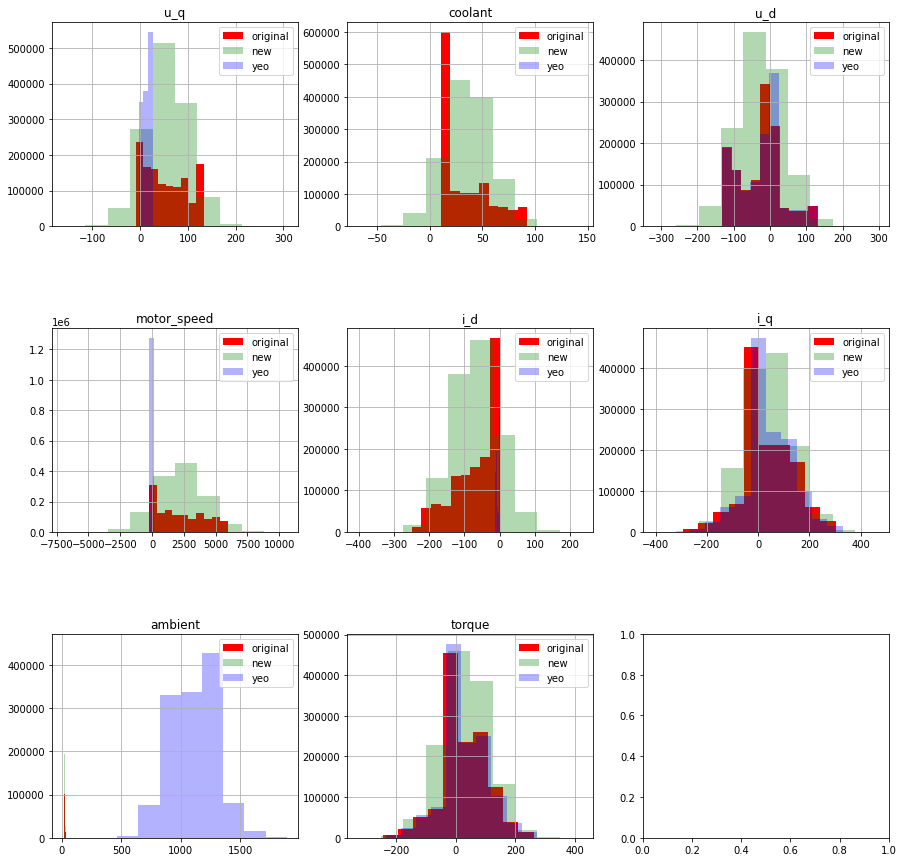

In [44]:
plot_histograms(measures_train_df_X[measures_numeric_columns], 
                matched_measures_train_df_X_not[measures_numeric_columns], 
                yeo_measures_train_df_X[measures_numeric_columns])

## Plot a Heatmap of all columns to targets

In addition to getting insights about each feature, we check the correlation between each feature and the target features. This is another attempt to understand how the data transformation affects the model's preformance.

In [45]:
matched_measures_df_corr = pd.concat([matched_measures_train_df_X, measures_train_df_y], axis=1)
matched_measures_df_corr_not = pd.concat([matched_measures_train_df_X_not, measures_train_df_y], axis=1)
yeo_measures_df_corr = pd.concat([yeo_measures_train_df_X, measures_train_df_y], axis=1)

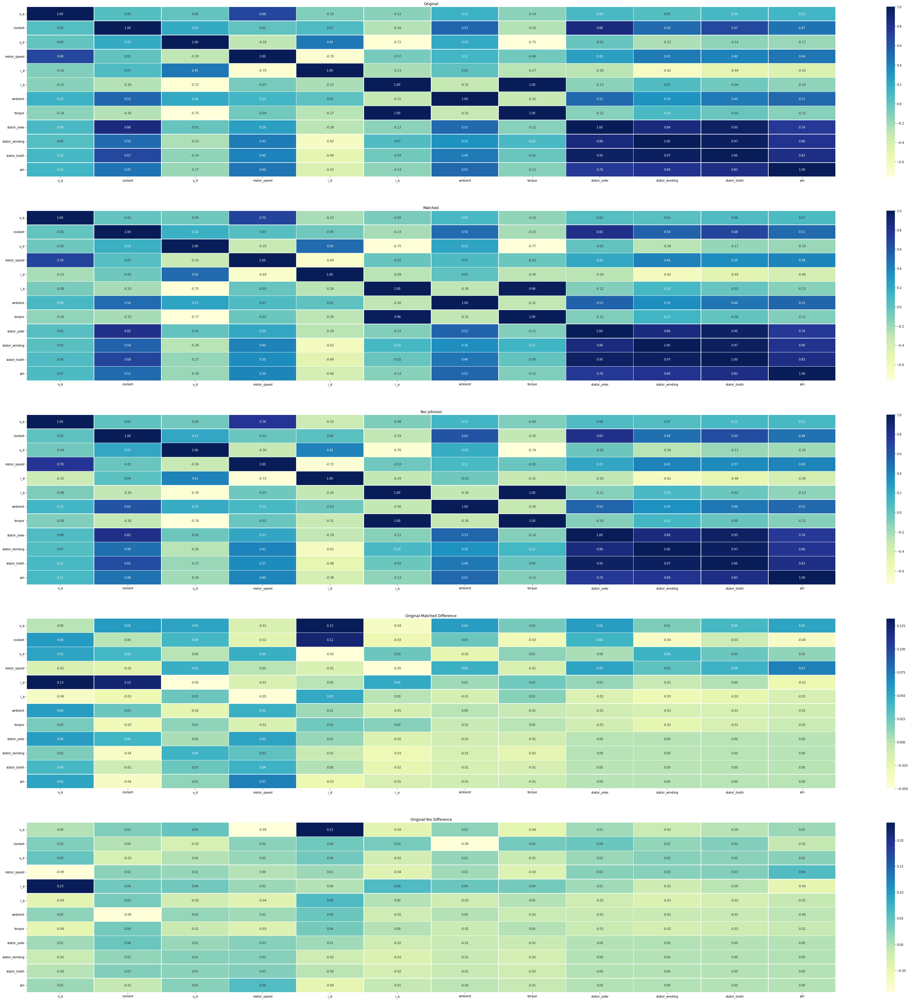

In [46]:
plot_correlation_heatmaps(measures_df, matched_measures_df_corr, yeo_measures_df_corr,\
                          measures_numeric_columns + ['stator_yoke', 'stator_winding', 'stator_tooth', 'pm'])

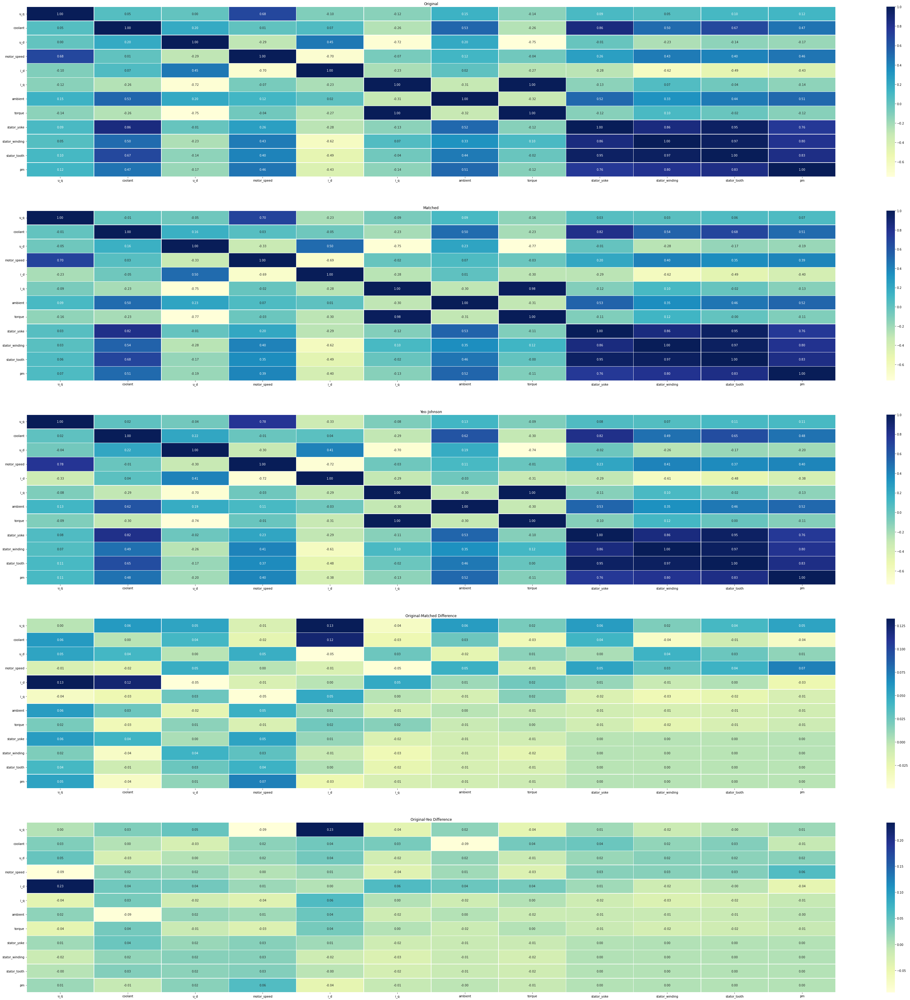

In [47]:
plot_correlation_heatmaps(measures_df, matched_measures_df_corr_not, yeo_measures_df_corr,\
                          measures_numeric_columns + ['stator_yoke', 'stator_winding', 'stator_tooth', 'pm'])

In [48]:
for column in measures_train_df_y.columns:
    print(f'{"=" * 15} Compare sum of corr for target column: {column} {"=" * 15}')
    print('matched corr sum:', matched_measures_df_corr.corr(method='pearson').loc[column].abs().sum())
    print('yeo corr sum:', yeo_measures_df_corr.corr(method='pearson').loc[column].abs().sum())

=============== Compare sum of corr for target column: stator_yoke ===============
matched corr sum: 5.679068346440794
yeo corr sum: 5.759830482150586
=============== Compare sum of corr for target column: stator_winding ===============
matched corr sum: 6.057603767333382
yeo corr sum: 6.011968584461707
=============== Compare sum of corr for target column: stator_tooth ===============
matched corr sum: 5.9952977590001115
yeo corr sum: 6.0017245441475815
=============== Compare sum of corr for target column: pm ===============
matched corr sum: 5.693683922840153
yeo corr sum: 5.703339580359221


In [49]:
measures_diff_corr_df = pd.concat([
           matched_measures_df_corr.corr(method='pearson').abs().sum(axis=1).rename('matched').to_frame(),
           yeo_measures_df_corr.corr(method='pearson').abs().sum(axis=1).rename('yeo').to_frame()
], axis=1)

def highlight_max(s, props=''):
    return np.where(s == np.nanmax(s.values), props, '')

measures_diff_corr_df.style.apply(highlight_max, props='color:white;background-color:darkblue', axis=1)

,matched,yeo
u_q,2.523803,2.840165
coolant,4.749023,4.918981
u_d,4.422809,4.250147
motor_speed,4.221263,4.362243
i_d,4.850245,4.887881
i_q,4.004775,4.055712
ambient,4.369703,4.514042
torque,4.108904,4.075795
stator_yoke,5.679068,5.759830
stator_winding,6.057604,6.011969


Display original data next to the histogram matched data for visual aid.

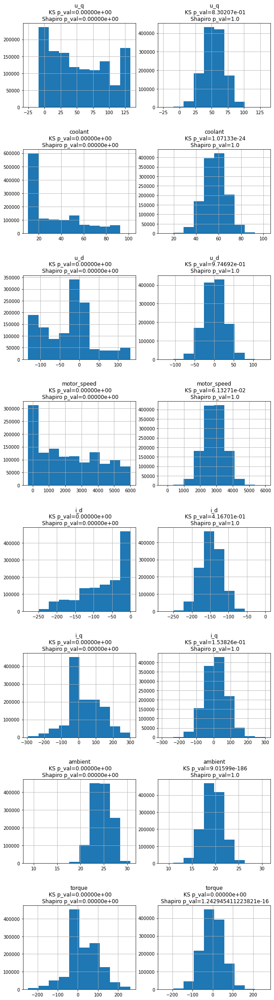

In [50]:
plot_histograms_side_by_side(measures_train_df_X, matched_measures_train_df_X)

# Try on second Dataset (Regression)

https://www.kaggle.com/deepcontractor/miami-housing-dataset

In [55]:
!if [ ! -f datasets/miami-housing.csv ]; then kaggle datasets download --unzip -d deepcontractor/miami-housing-dataset -p datasets/; fi;

In [56]:
miami_df = pd.read_csv('./datasets/miami-housing.csv')

In [57]:
get_insights(miami_df)

,min,max,mean,median,std,var,skew,kurtosis,entropy
LATITUDE,2.543433e+01,2.597438e+01,2.572881e+01,2.573181e+01,1.406333e-01,1.977772e-02,-0.094570,-0.969276,9.526271
LONGITUDE,-8.054217e+01,-8.011975e+01,-8.032748e+01,-8.033891e+01,8.919907e-02,7.956474e-03,0.292592,-0.908129,9.526271
PARCELNO,1.020008e+11,3.660170e+12,2.356496e+12,3.040300e+12,1.199290e+12,1.438298e+24,-0.897812,-0.938196,9.526271
SALE_PRC,7.200000e+04,2.650000e+06,3.999419e+05,3.100000e+05,3.172147e+05,1.006252e+11,3.215506,13.275156,6.333583
LND_SQFOOT,1.248000e+03,5.706400e+04,8.620880e+03,7.500000e+03,6.070089e+03,3.684598e+07,3.830115,19.076805,6.992606
TOT_LVG_AREA,8.540000e+02,6.287000e+03,2.058045e+03,1.877500e+03,8.135385e+02,6.618449e+05,1.346930,2.487290,7.688164
SPEC_FEAT_VAL,0.000000e+00,1.750200e+05,9.562493e+03,2.765500e+03,1.389097e+04,1.929590e+08,1.902250,4.667249,7.703347
RAIL_DIST,1.050000e+01,2.962150e+04,8.348549e+03,7.106300e+03,6.178027e+03,3.816802e+07,0.824282,-0.012673,9.471141
OCEAN_DIST,2.361000e+02,7.574490e+04,3.169099e+04,2.854175e+04,1.759508e+04,3.095868e+08,0.393140,-0.690381,9.510187
WATER_DIST,0.000000e+00,5.039980e+04,1.196029e+04,6.922600e+03,1.193299e+04,1.423963e+08,1.138049,0.328991,9.444248


In [58]:
miami_df.describe()

,LATITUDE,LONGITUDE,PARCELNO,SALE_PRC,LND_SQFOOT,TOT_LVG_AREA,SPEC_FEAT_VAL,RAIL_DIST,OCEAN_DIST,WATER_DIST,CNTR_DIST,SUBCNTR_DI,HWY_DIST,age,avno60plus,month_sold,structure_quality
count,13932.000000,13932.000000,1.393200e+04,1.393200e+04,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000
mean,25.728811,-80.327475,2.356496e+12,3.999419e+05,8620.879917,2058.044574,9562.493468,8348.548715,31690.993798,11960.285235,68490.327132,41115.047265,7723.770693,30.669251,0.014930,6.655828,3.513997
std,0.140633,0.089199,1.199290e+12,3.172147e+05,6070.088742,813.538535,13890.967782,6178.027333,17595.079468,11932.992369,32008.474808,22161.825935,6068.936108,21.153068,0.121276,3.301523,1.097444
min,25.434333,-80.542172,1.020008e+11,7.200000e+04,1248.000000,854.000000,0.000000,10.500000,236.100000,0.000000,3825.600000,1462.800000,90.200000,0.000000,0.000000,1.000000,1.000000
25%,25.620056,-80.403278,1.079160e+12,2.350000e+05,5400.000000,1470.000000,810.000000,3299.450000,18079.350000,2675.850000,42823.100000,23996.250000,2998.125000,14.000000,0.000000,4.000000,2.000000
50%,25.731810,-80.338911,3.040300e+12,3.100000e+05,7500.000000,1877.500000,2765.500000,7106.300000,28541.750000,6922.600000,65852.400000,41109.900000,6159.750000,26.000000,0.000000,7.000000,4.000000
75%,25.852269,-80.258019,3.060170e+12,4.280000e+05,9126.250000,2471.000000,12352.250000,12102.600000,44310.650000,19200.000000,89358.325000,53949.375000,10854.200000,46.000000,0.000000,9.000000,4.000000
max,25.974382,-80.119746,3.660170e+12,2.650000e+06,57064.000000,6287.000000,175020.000000,29621.500000,75744.900000,50399.800000,159976.500000,110553.800000,48167.300000,96.000000,1.000000,12.000000,5.000000


In [59]:
print(miami_df.shape)
miami_df.head()

(13932, 17)


,LATITUDE,LONGITUDE,PARCELNO,SALE_PRC,LND_SQFOOT,TOT_LVG_AREA,SPEC_FEAT_VAL,RAIL_DIST,OCEAN_DIST,WATER_DIST,CNTR_DIST,SUBCNTR_DI,HWY_DIST,age,avno60plus,month_sold,structure_quality
0,25.891031,-80.160561,622280070620,440000.0,9375,1753,0,2815.9,12811.4,347.6,42815.3,37742.2,15954.9,67,0,8,4
1,25.891324,-80.153968,622280100460,349000.0,9375,1715,0,4359.1,10648.4,337.8,43504.9,37340.5,18125.0,63,0,9,4
2,25.891334,-80.153740,622280100470,800000.0,9375,2276,49206,4412.9,10574.1,297.1,43530.4,37328.7,18200.5,61,0,2,4
3,25.891765,-80.152657,622280100530,988000.0,12450,2058,10033,4585.0,10156.5,0.0,43797.5,37423.2,18514.4,63,0,9,4
4,25.891825,-80.154639,622280100200,755000.0,12800,1684,16681,4063.4,10836.8,326.6,43599.7,37550.8,17903.4,42,0,7,4


In [60]:
miami_df_train, miami_df_test = train_test_split(miami_df, test_size=0.25)

print(miami_df_train.shape)
print(miami_df_test.shape)

(10449, 17)
(3483, 17)


Remove target column

In [61]:
labels_to_remove = ['SALE_PRC', 'PARCELNO', 'LATITUDE', 'LONGITUDE', 'month_sold']

miami_train_X = miami_df_train.drop(labels_to_remove, axis=1)
miami_train_y = miami_df_train['SALE_PRC']

miami_test_X = miami_df_test.drop(labels_to_remove, axis=1)
miami_test_y = miami_df_test['SALE_PRC']

Split to numeric and categorical columns

In [62]:
miami_numeric_columns, miami_categorical_columns = get_numeric_categorical_columns(miami_train_X, ['SALE_PRC'], 1)

column: LND_SQFOOT, %: 37.26672408842951
column: TOT_LVG_AREA, %: 26.4905732605991
column: SPEC_FEAT_VAL, %: 58.426643697961524
column: RAIL_DIST, %: 96.08574983251987
column: OCEAN_DIST, %: 98.06680065077998
column: WATER_DIST, %: 96.05703895109579
column: CNTR_DIST, %: 98.60273710402909
column: SUBCNTR_DI, %: 98.3634797588286
column: HWY_DIST, %: 95.84649248731935
column: age, %: 0.9091779117618911
column: avno60plus, %: 0.019140587616039813
column: structure_quality, %: 0.04785146904009953
numeric_columns = ['LND_SQFOOT', 'TOT_LVG_AREA', 'SPEC_FEAT_VAL', 'RAIL_DIST', 'OCEAN_DIST', 'WATER_DIST', 'CNTR_DIST', 'SUBCNTR_DI', 'HWY_DIST']
categorical_columns = ['age', 'avno60plus', 'structure_quality']


In [63]:
scaler = StandardScaler()
scaler.fit(miami_train_X)
miami_train_X = pd.DataFrame(scaler.transform(miami_train_X), columns=miami_test_X.columns, index=miami_train_y.index)

In [64]:
scaler = StandardScaler()
scaler.fit(miami_test_X)
miami_test_X = pd.DataFrame(scaler.transform(miami_test_X), columns=miami_train_X.columns, index=miami_test_y.index)

### Visualize histograms of features

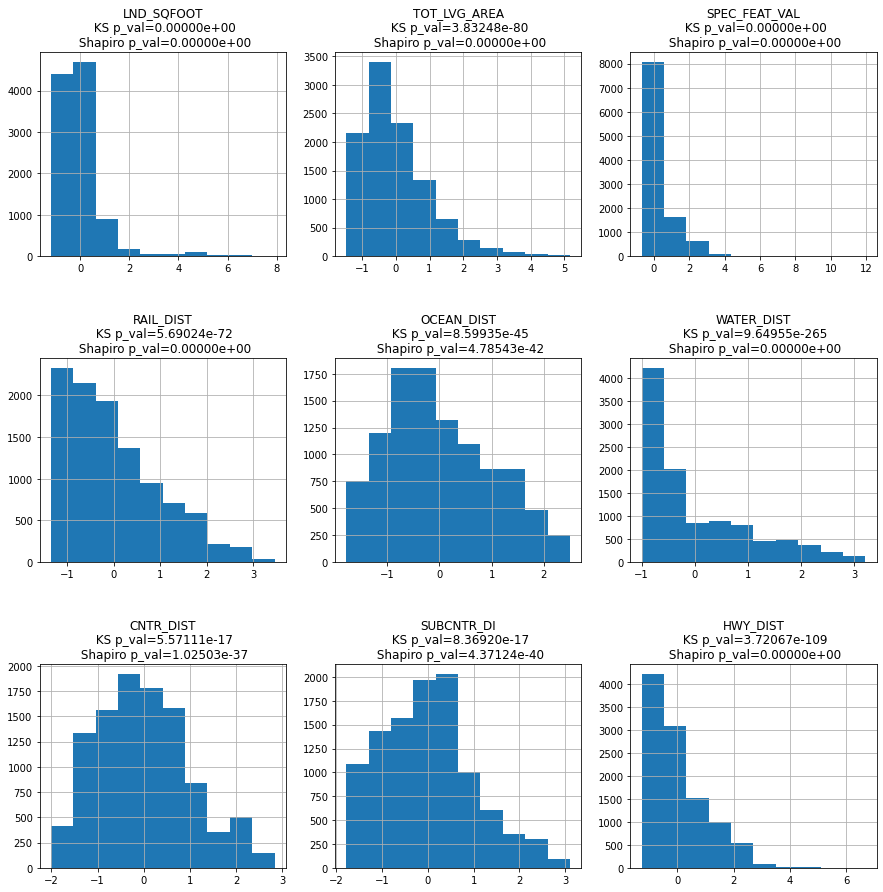

In [65]:
plot_numerical_histograms(miami_train_X, miami_numeric_columns)

### Compare Histogram-Matching to Yeo-Johnson

Correction: LND_SQFOOT
Correction: TOT_LVG_AREA
Correction: SPEC_FEAT_VAL
Correction: RAIL_DIST
Correction: OCEAN_DIST
Correction: WATER_DIST
Correction: CNTR_DIST
Correction: SUBCNTR_DI
Correction: HWY_DIST


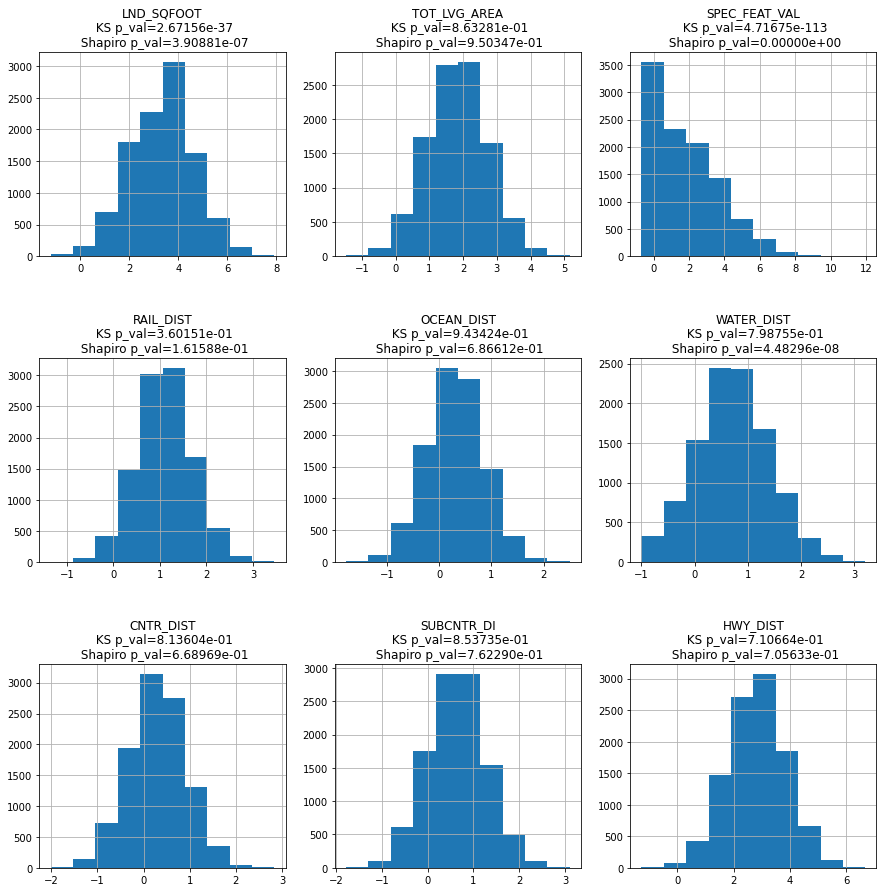

In [66]:
matched_miami_train_df_X, matched_miami_train_df_X_normal_mapping = transform_dataset(miami_train_X[miami_numeric_columns],\
                                                                                    match_to_normal_distribution,\
                                                                                    correction=correction_func)
matched_miami_train_df_X_not, matched_miami_train_df_X_normal_mapping_not = transform_dataset(miami_train_X[miami_numeric_columns],\
                                                                                    match_to_normal_distribution)
plot_numerical_histograms(matched_miami_train_df_X, miami_numeric_columns)

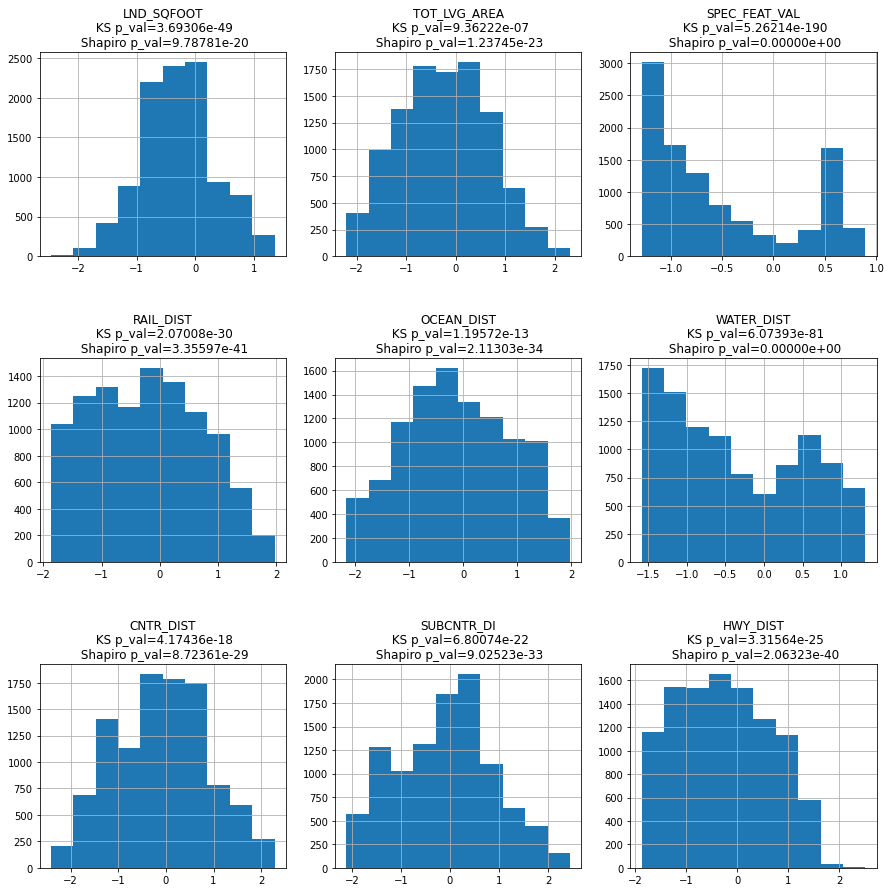

In [67]:
yeo_miami_train_df_X, yeo_miami_train_df_X_normal_mapping = transform_dataset(miami_train_X[miami_numeric_columns], stats.yeojohnson)
plot_numerical_histograms(yeo_miami_train_df_X, miami_numeric_columns)

#### Match test set X

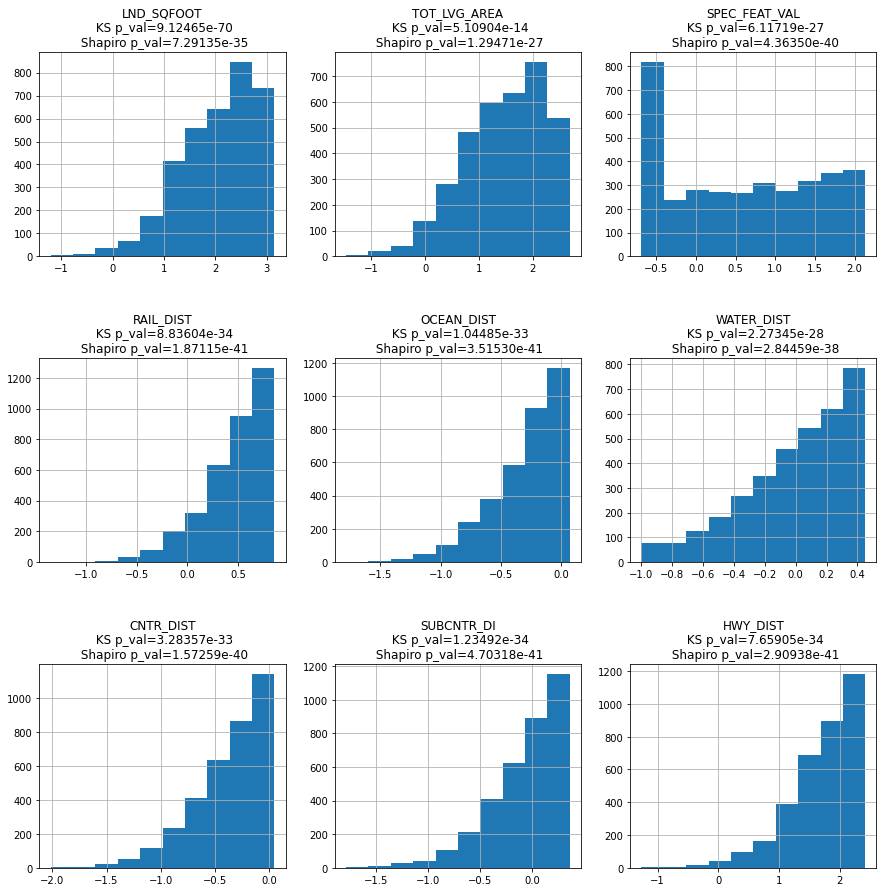

In [68]:
matched_miami_test_df_X, _ = transform_dataset(miami_test_X[miami_numeric_columns], match_to_normal_distribution, mapping=matched_miami_train_df_X_normal_mapping)
plot_numerical_histograms(matched_miami_test_df_X, miami_numeric_columns)

In [69]:
yeo_miami_test_df_X, _ = transform_dataset(miami_test_X[miami_numeric_columns], stats.yeojohnson, mapping=yeo_miami_train_df_X_normal_mapping)

In [70]:
matched_miami_train_df_X = pd.concat([matched_miami_train_df_X, miami_train_X[miami_categorical_columns]], axis=1)
matched_miami_test_df_X = pd.concat([matched_miami_test_df_X, miami_test_X[miami_categorical_columns]], axis=1)

yeo_miami_train_df_X = pd.concat([yeo_miami_train_df_X, miami_train_X[miami_categorical_columns]], axis=1)
yeo_miami_test_df_X = pd.concat([yeo_miami_test_df_X, miami_test_X[miami_categorical_columns]], axis=1)

## QQ plots of features

### QQ plots for regular features

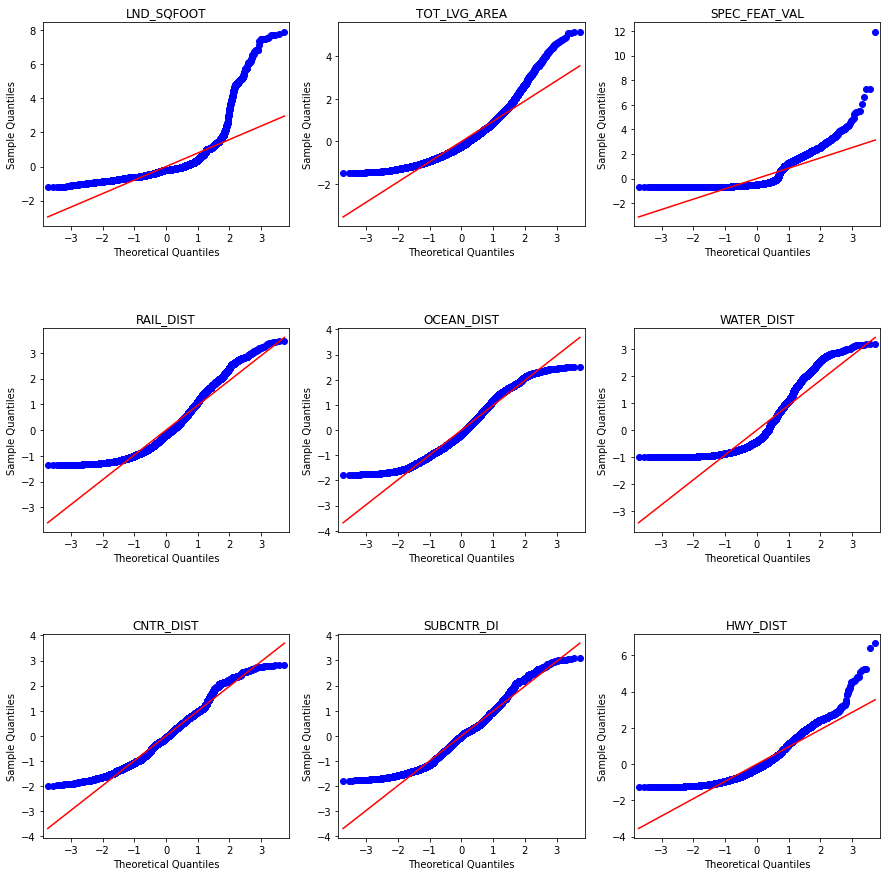

In [71]:
qq_plot_data(miami_train_X, miami_numeric_columns)

### QQ plots for Matched features

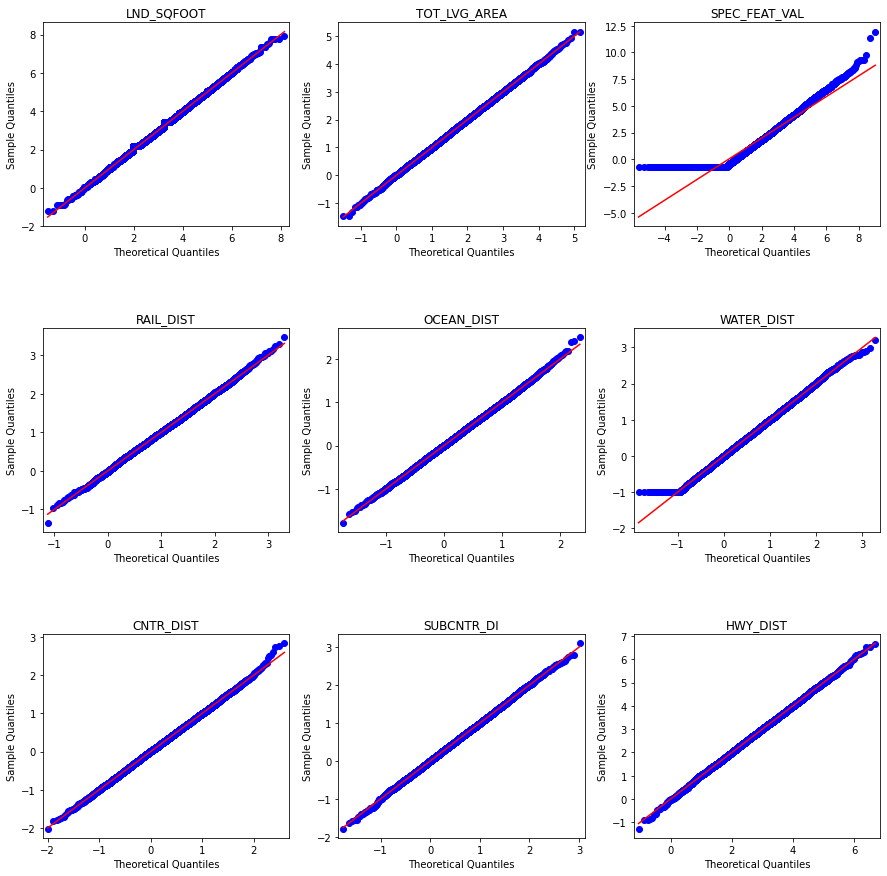

In [72]:
qq_plot_data(matched_miami_train_df_X, miami_numeric_columns)

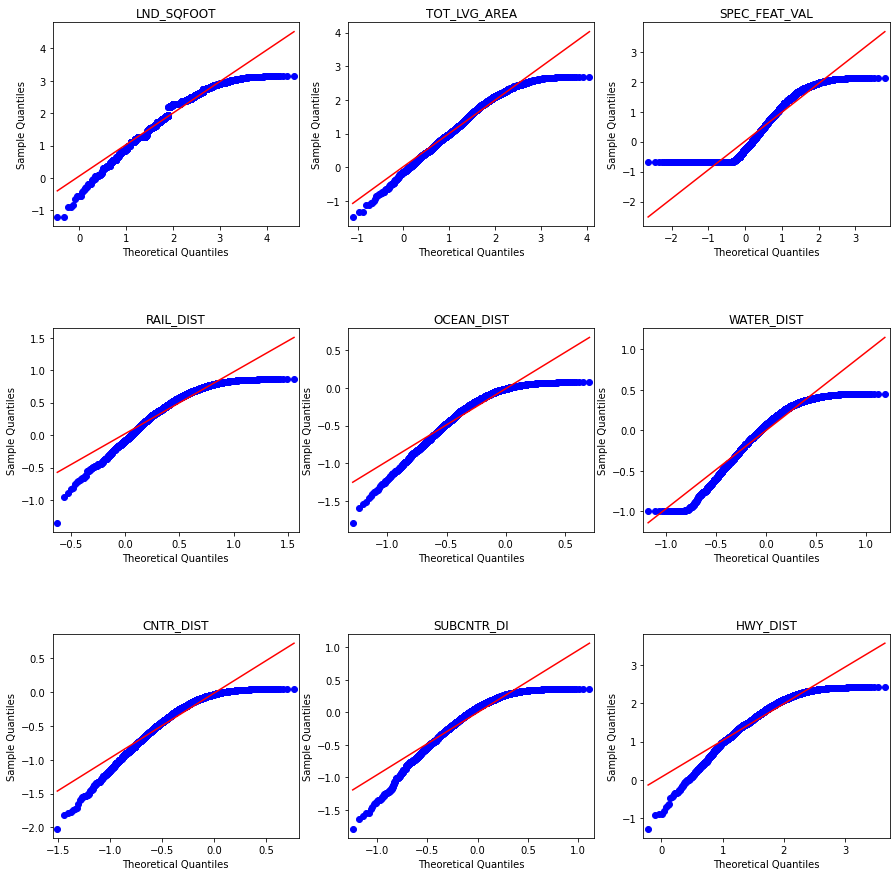

In [73]:
qq_plot_data(matched_miami_test_df_X, miami_numeric_columns)

### QQ plots for Yeo-Johnson features

In [74]:
yeo_miami_train_df_X.isna().sum()

LND_SQFOOT           0
TOT_LVG_AREA         0
SPEC_FEAT_VAL        0
RAIL_DIST            0
OCEAN_DIST           0
WATER_DIST           0
CNTR_DIST            0
SUBCNTR_DI           0
HWY_DIST             0
age                  0
avno60plus           0
structure_quality    0
dtype: int64

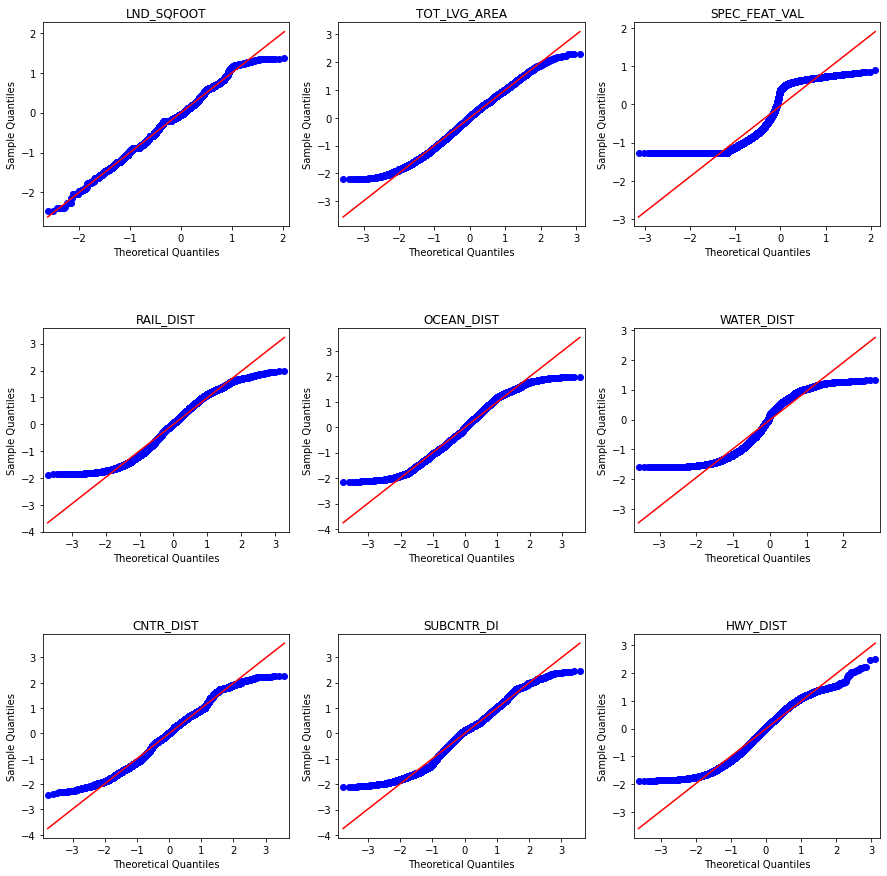

In [75]:
qq_plot_data(yeo_miami_train_df_X, miami_numeric_columns)

## Compare model preformance

### Test on regular data

In [76]:
model = LinearRegression()
prediction = model.fit(miami_train_X, miami_train_y).predict(miami_test_X)
print(f'r2={r2_score(miami_test_y,prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(miami_test_y, prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(miami_test_y, prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(miami_test_y, prediction))))

r2=0.6880798178147491
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.326
Mean Absolute Error (Σ|y - pred|/n): 112,523
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 177,767


### Test on matched data

In [77]:
model = LinearRegression()
prediction = model.fit(matched_miami_train_df_X, miami_train_y).predict(matched_miami_test_df_X)
print(f'r2={r2_score(miami_test_y, prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(miami_test_y, prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(miami_test_y, prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(miami_test_y, prediction))))

r2=0.4907004043814789
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.466
Mean Absolute Error (Σ|y - pred|/n): 159,212
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 227,152


### Test on Yeo-Johnson data

In [78]:
model = LinearRegression()
prediction = model.fit(yeo_miami_train_df_X, miami_train_y).predict(yeo_miami_test_df_X)
print(f'r2={r2_score(miami_test_y, prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(miami_test_y, prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(miami_test_y, prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(miami_test_y, prediction))))

r2=0.63884657701254
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.361
Mean Absolute Error (Σ|y - pred|/n): 121,766
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 191,283


## Try to normalize only 1 column at a time and Compare to regular model

In [79]:
compare_one_norm_column(miami_train_X, miami_test_X, miami_train_y, miami_test_y,\
                        matched_miami_train_df_X, matched_miami_test_df_X, yeo_miami_train_df_X,\
                        yeo_miami_test_df_X, 'SALE_PRC', miami_numeric_columns)

=== Measure for regular model: ===
column=SALE_PRC, r2=0.6880798178147491
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.326
Mean Absolute Error (Σ|y - pred|/n): 112,523
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 177,767

=== Compare for column LND_SQFOOT ===
column=LND_SQFOOT, matched r2=0.6900218358940458
column=LND_SQFOOT, yeo r2=0.6903937277029221

=== Compare for column TOT_LVG_AREA ===
column=TOT_LVG_AREA, matched r2=0.5928938081266621
column=TOT_LVG_AREA, yeo r2=0.6462856160067583

=== Compare for column SPEC_FEAT_VAL ===
column=SPEC_FEAT_VAL, matched r2=0.6777802040994376
column=SPEC_FEAT_VAL, yeo r2=0.6831435418323838

=== Compare for column RAIL_DIST ===
column=RAIL_DIST, matched r2=0.6768167643277038
column=RAIL_DIST, yeo r2=0.6851823038672924

=== Compare for column OCEAN_DIST ===
column=OCEAN_DIST, matched r2=0.5839893227340359
column=OCEAN_DIST, yeo r2=0.6922714043691585

=== Compare for column WATER_DIST ===
column=WATER_DIST, matched r2=0.6733923196433494
column=

## Get insights about the data

In [80]:
miami_insights = get_insights(miami_train_X[miami_numeric_columns])
miami_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
LND_SQFOOT,-1.207698,7.919156,-5.162766e-17,-0.187425,1.000048,1.000096,3.763490,18.404727,6.924707
TOT_LVG_AREA,-1.472212,5.165306,-7.987996e-17,-0.221187,1.000048,1.000096,1.333396,2.383925,7.648229
SPEC_FEAT_VAL,-0.686272,11.945919,1.450547e-16,-0.486995,1.000048,1.000096,1.902555,4.773352,7.544967
RAIL_DIST,-1.351094,3.461117,1.127755e-16,-0.194496,1.000048,1.000096,0.828101,0.006614,9.199032
OCEAN_DIST,-1.784041,2.500290,3.622117e-17,-0.173473,1.000048,1.000096,0.388971,-0.707080,9.227161
WATER_DIST,-1.000202,3.205668,-6.800103e-19,-0.420223,1.000048,1.000096,1.139710,0.320506,9.176894
CNTR_DIST,-2.015657,2.836456,-6.099041e-17,-0.078945,1.000048,1.000096,0.423156,-0.319933,9.234741
SUBCNTR_DI,-1.784183,3.106344,6.103092e-17,0.002838,1.000048,1.000096,0.462806,-0.194145,9.231424
HWY_DIST,-1.266783,6.671252,1.659650e-17,-0.256340,1.000048,1.000096,1.103779,1.101806,9.195880


In [81]:
matched_miami_insights = get_insights(matched_miami_train_df_X[miami_numeric_columns])
matched_miami_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
LND_SQFOOT,-1.207698,7.919156,3.315305,3.446469,1.296376,1.680590,0.007328,-0.003278,6.924707
TOT_LVG_AREA,-1.472212,5.165306,1.830362,1.834887,0.892009,0.795679,-0.004194,-0.032439,7.648229
SPEC_FEAT_VAL,-0.686272,11.945919,1.708928,1.502399,1.963347,3.854730,0.648503,-0.091051,7.544967
RAIL_DIST,-1.351094,3.461117,1.089264,1.087819,0.594163,0.353029,0.026446,0.079393,9.199032
OCEAN_DIST,-1.784041,2.500290,0.300962,0.301347,0.546689,0.298869,0.017358,0.034010,9.227161
WATER_DIST,-1.000202,3.205668,0.714290,0.709677,0.687240,0.472298,0.039621,-0.122257,9.176894
CNTR_DIST,-2.015657,2.836456,0.297909,0.297668,0.615592,0.378954,0.000861,0.047283,9.234741
SUBCNTR_DI,-1.784183,3.106344,0.629725,0.635151,0.639888,0.409456,0.000228,0.017803,9.231424
HWY_DIST,-1.266783,6.671252,2.817829,2.821616,1.036488,1.074308,-0.019497,0.034413,9.195880


In [82]:
matched_not_miami_insights = get_insights(matched_miami_train_df_X_not[miami_numeric_columns])
matched_not_miami_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
LND_SQFOOT,-4.501467,4.094551,0.024177,0.118972,1.001908,1.003820,0.003421,0.059659,6.924707
TOT_LVG_AREA,-3.546289,3.989555,0.004505,0.002427,0.997731,0.995466,-0.002916,0.024807,7.648229
SPEC_FEAT_VAL,-0.979445,3.664200,0.081488,-0.006541,0.869938,0.756792,0.614635,-0.239509,7.544967
RAIL_DIST,-3.720618,3.714921,-0.010394,0.004903,1.008069,1.016203,0.007814,-0.030654,9.199032
OCEAN_DIST,-3.837580,4.583775,0.014147,0.002811,1.005068,1.010163,-0.003097,-0.004668,9.227161
WATER_DIST,-2.467885,3.831618,0.018049,0.020359,1.003151,1.006313,0.037537,-0.138153,9.176894
CNTR_DIST,-3.709149,4.015852,0.000401,0.003697,0.998716,0.997433,-0.040312,-0.063510,9.234741
SUBCNTR_DI,-3.925694,4.080637,-0.009743,0.005563,0.998880,0.997761,-0.029501,0.070882,9.231424
HWY_DIST,-3.790557,3.477598,0.003550,-0.003691,0.998990,0.997981,0.013702,-0.011155,9.195880


In [83]:
yeo_miami_insights = get_insights(yeo_miami_train_df_X[miami_numeric_columns])
yeo_miami_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
LND_SQFOOT,-2.466753,1.358615,-0.292238,-0.214116,0.623987,0.389360,0.005988,-0.042787,6.924707
TOT_LVG_AREA,-2.211619,2.306952,-0.234477,-0.239173,0.896039,0.802886,0.078001,-0.589334,7.648229
SPEC_FEAT_VAL,-1.282210,0.893577,-0.523857,-0.770170,0.703297,0.494626,0.622629,-1.126498,7.544967
RAIL_DIST,-1.874451,1.970265,-0.218089,-0.206464,0.937829,0.879523,0.113660,-0.997835,9.199032
OCEAN_DIST,-2.164905,1.981285,-0.112546,-0.178064,0.984805,0.969841,0.032648,-0.858988,9.227161
WATER_DIST,-1.584482,1.312285,-0.354391,-0.521443,0.862398,0.743731,0.277773,-1.274678,9.176894
CNTR_DIST,-2.415972,2.280839,-0.095841,-0.079779,0.985887,0.971973,0.043755,-0.633449,9.234741
SUBCNTR_DI,-2.117367,2.449401,-0.098228,0.002837,0.984081,0.968415,0.057695,-0.620431,9.231424
HWY_DIST,-1.870921,2.507021,-0.259595,-0.282309,0.904620,0.818338,0.132840,-0.969658,9.195880


In [84]:
miami_insights - matched_miami_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
LND_SQFOOT,0.0,0.000000e+00,-3.315305,-3.633894,-0.296328,-0.680494,3.756162,18.408005,0.0
TOT_LVG_AREA,0.0,0.000000e+00,-1.830362,-2.056074,0.108039,0.204416,1.337590,2.416364,0.0
SPEC_FEAT_VAL,0.0,0.000000e+00,-1.708928,-1.989394,-0.963299,-2.854634,1.254052,4.864403,0.0
RAIL_DIST,0.0,0.000000e+00,-1.089264,-1.282315,0.405885,0.647066,0.801655,-0.072780,0.0
OCEAN_DIST,0.0,4.440892e-16,-0.300962,-0.474820,0.453359,0.701227,0.371613,-0.741090,0.0
WATER_DIST,0.0,0.000000e+00,-0.714290,-1.129900,0.312808,0.527797,1.100089,0.442762,0.0
CNTR_DIST,0.0,0.000000e+00,-0.297909,-0.376613,0.384455,0.621142,0.422296,-0.367216,0.0
SUBCNTR_DI,0.0,4.440892e-16,-0.629725,-0.632313,0.360160,0.590639,0.462578,-0.211948,0.0
HWY_DIST,0.0,-8.881784e-16,-2.817829,-3.077955,-0.036441,-0.074213,1.123276,1.067393,0.0


In [85]:
miami_insights - matched_not_miami_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
LND_SQFOOT,3.293768,3.824605,-0.024177,-0.306397,-0.001860,-0.003724,3.760069,18.345068,0.0
TOT_LVG_AREA,2.074077,1.175751,-0.004505,-0.223614,0.002317,0.004629,1.336312,2.359118,0.0
SPEC_FEAT_VAL,0.293173,8.281719,-0.081488,-0.480454,0.130110,0.243304,1.287920,5.012861,0.0
RAIL_DIST,2.369524,-0.253804,0.010394,-0.199399,-0.008021,-0.016107,0.820287,0.037267,0.0
OCEAN_DIST,2.053539,-2.083484,-0.014147,-0.176284,-0.005021,-0.010067,0.392068,-0.702412,0.0
WATER_DIST,1.467684,-0.625950,-0.018049,-0.440583,-0.003104,-0.006217,1.102173,0.458659,0.0
CNTR_DIST,1.693492,-1.179396,-0.000401,-0.082643,0.001332,0.002663,0.463468,-0.256423,0.0
SUBCNTR_DI,2.141511,-0.974293,0.009743,-0.002724,0.001168,0.002335,0.492307,-0.265027,0.0
HWY_DIST,2.523774,3.193654,-0.003550,-0.252648,0.001058,0.002115,1.090077,1.112961,0.0


In [86]:
miami_insights - yeo_miami_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
LND_SQFOOT,1.259054,6.560541,0.292238,0.026691,0.376061,0.610736,3.757502,18.447514,0.0
TOT_LVG_AREA,0.739407,2.858354,0.234477,0.017985,0.104009,0.197209,1.255394,2.973259,0.0
SPEC_FEAT_VAL,0.595938,11.052342,0.523857,0.283175,0.296751,0.505469,1.279926,5.899850,0.0
RAIL_DIST,0.523357,1.490852,0.218089,0.011968,0.062219,0.120572,0.714441,1.004448,0.0
OCEAN_DIST,0.380865,0.519005,0.112546,0.004591,0.015243,0.030254,0.356323,0.151909,0.0
WATER_DIST,0.584280,1.893383,0.354391,0.101220,0.137649,0.256365,0.861937,1.595184,0.0
CNTR_DIST,0.400316,0.555617,0.095841,0.000834,0.014161,0.028123,0.379402,0.313516,0.0
SUBCNTR_DI,0.333184,0.656943,0.098228,0.000001,0.015967,0.031680,0.405111,0.426286,0.0
HWY_DIST,0.604138,4.164231,0.259595,0.025970,0.095428,0.181758,0.970939,2.071464,0.0


## Plot distributions

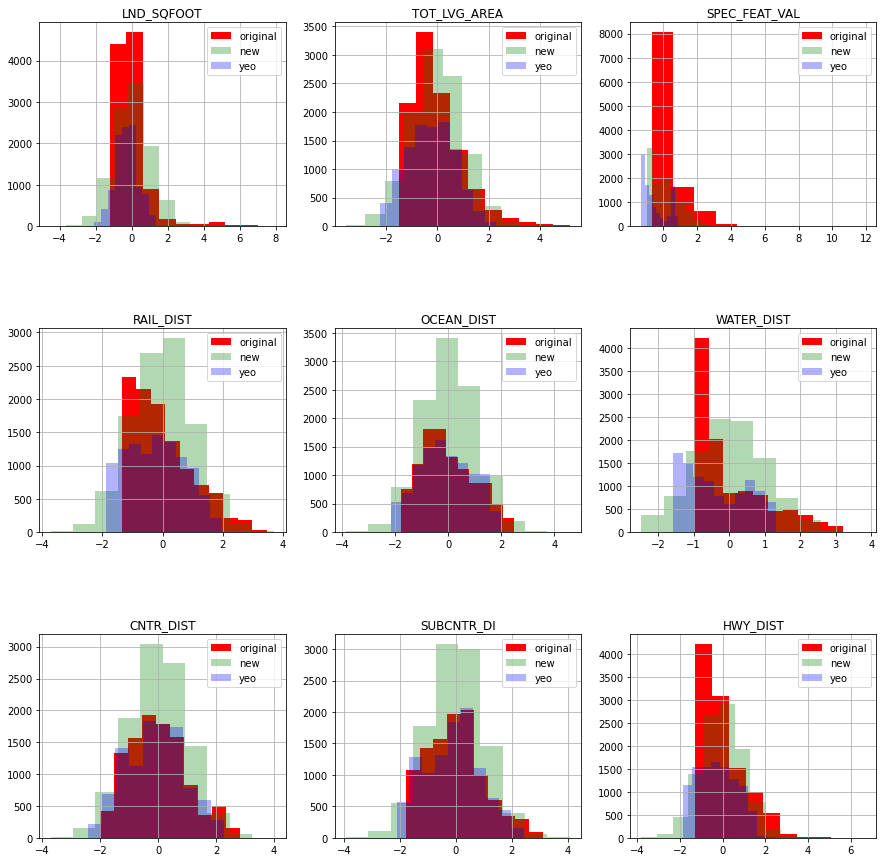

In [87]:
plot_histograms(miami_train_X[miami_numeric_columns], 
                matched_miami_train_df_X_not[miami_numeric_columns], 
                yeo_miami_train_df_X[miami_numeric_columns])

## Plot a Heatmap of all columns to targets

In [88]:
matched_miami_df_corr = pd.concat([matched_miami_train_df_X, miami_train_y], axis=1)
yeo_miami_df_corr = pd.concat([yeo_miami_train_df_X, miami_train_y], axis=1)

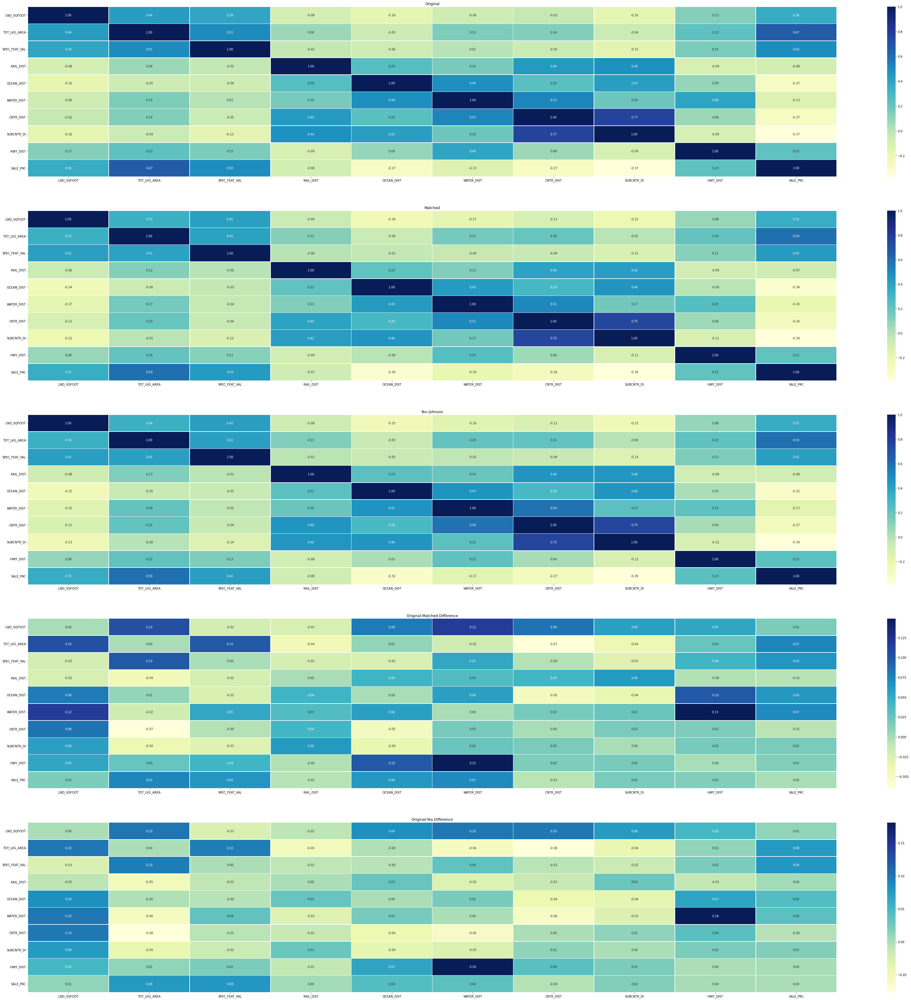

In [89]:
plot_correlation_heatmaps(miami_df, matched_miami_df_corr, yeo_miami_df_corr, miami_numeric_columns + ['SALE_PRC'])

In [90]:
for column in miami_train_y.to_frame().columns:
    print(f'{"=" * 15} Compare sum of corr for target column: {column} {"=" * 15}')
    print('matched corr sum:', matched_miami_df_corr.corr(method='pearson').loc[column].abs().sum())
    print('yeo corr sum:', yeo_miami_df_corr.corr(method='pearson').loc[column].abs().sum())

=============== Compare sum of corr for target column: SALE_PRC ===============
matched corr sum: 4.381432964747789
yeo corr sum: 4.339686324504032


In [91]:
miami_diff_corr_df = pd.concat([
           matched_miami_df_corr.corr(method='pearson').abs().sum(axis=1).rename('matched').to_frame(),
           yeo_miami_df_corr.corr(method='pearson').abs().sum(axis=1).rename('yeo').to_frame()
], axis=1)

def highlight_max(s, props=''):
    return np.where(s == np.nanmax(s.values), props, '')

miami_diff_corr_df.style.apply(highlight_max, props='color:white;background-color:darkblue', axis=1)

,matched,yeo
LND_SQFOOT,3.233689,3.291683
TOT_LVG_AREA,3.686183,3.746591
SPEC_FEAT_VAL,2.861139,2.872171
RAIL_DIST,2.923225,3.157712
OCEAN_DIST,3.423636,3.504766
WATER_DIST,3.611719,3.820803
CNTR_DIST,4.577524,4.748012
SUBCNTR_DI,4.329491,4.460236
HWY_DIST,2.409943,2.434494
age,3.592303,3.638802


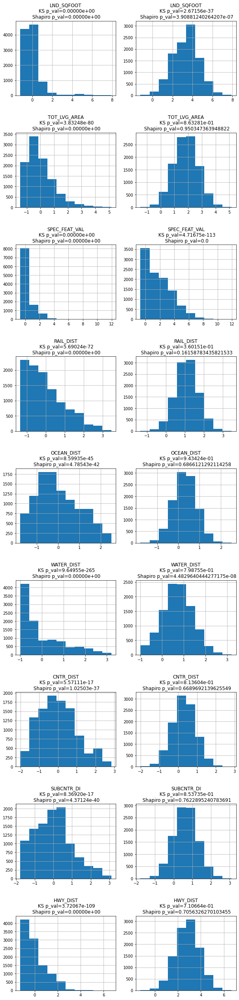

In [92]:
plot_histograms_side_by_side(miami_train_X[miami_numeric_columns], matched_miami_train_df_X[miami_numeric_columns])

# Try on third Dataset (Regression)

https://www.kaggle.com/sidhus/crab-age-prediction

In [96]:
!if [ ! -f datasets/CrabAgePrediction.csv ]; then kaggle datasets download --unzip -d sidhus/crab-age-prediction -p datasets/; fi;

In [97]:
crab_df = pd.read_csv('./datasets/CrabAgePrediction.csv')

In [98]:
crab_df.describe()

,Length,Diameter,Height,Weight,Shucked Weight,Viscera Weight,Shell Weight,Age
count,3893.000000,3893.000000,3893.000000,3893.000000,3893.000000,3893.000000,3893.000000,3893.000000
mean,1.311306,1.020893,0.349374,23.567275,10.207342,5.136546,6.795844,9.954791
std,0.300431,0.248233,0.104976,13.891201,6.275275,3.104133,3.943392,3.220967
min,0.187500,0.137500,0.000000,0.056699,0.028349,0.014175,0.042524,1.000000
25%,1.125000,0.875000,0.287500,12.672227,5.343881,2.664853,3.713785,8.000000
50%,1.362500,1.062500,0.362500,22.792998,9.539607,4.861939,6.662132,10.000000
75%,1.537500,1.200000,0.412500,32.786197,14.273973,7.200773,9.355335,11.000000
max,2.037500,1.625000,2.825000,80.101512,42.184056,21.545620,28.491247,29.000000


In [99]:
print(crab_df.shape)
crab_df.head()

(3893, 9)


,Sex,Length,Diameter,Height,Weight,Shucked Weight,Viscera Weight,Shell Weight,Age
0,F,1.4375,1.1750,0.4125,24.635715,12.332033,5.584852,6.747181,9
1,M,0.8875,0.6500,0.2125,5.400580,2.296310,1.374951,1.559222,6
2,I,1.0375,0.7750,0.2500,7.952035,3.231843,1.601747,2.764076,6
3,F,1.1750,0.8875,0.2500,13.480187,4.748541,2.282135,5.244657,10
4,I,0.8875,0.6625,0.2125,6.903103,3.458639,1.488349,1.700970,6


In [100]:
crab_df['Sex'] = crab_df['Sex'].astype('category')
crab_df['Sex'] = crab_df['Sex'].cat.codes

In [101]:
crab_df.Sex.head(5)

0    0
1    2
2    1
3    0
4    1
Name: Sex, dtype: int8

In [102]:
crab_df_train, crab_df_test = train_test_split(crab_df, test_size=0.25)

print(crab_df_train.shape)
print(crab_df_test.shape)

(2919, 9)
(974, 9)


In [103]:
crab_numeric_columns, crab_categorical_columns = get_numeric_categorical_columns(crab_df_train, ['Age'], 1)

column: Sex, %: 0.10277492291880781
column: Length, %: 4.522096608427543
column: Diameter, %: 3.768413840356286
column: Height, %: 1.7129153819801302
column: Weight, %: 67.69441589585475
column: Shucked Weight, %: 45.90613223706749
column: Viscera Weight, %: 28.091812264474136
column: Shell Weight, %: 27.852004110996916
numeric_columns = ['Length', 'Diameter', 'Height', 'Weight', 'Shucked Weight', 'Viscera Weight', 'Shell Weight']
categorical_columns = ['Sex']


In [104]:
crab_train_X = crab_df_train.drop('Age', axis=1)
crab_train_y = crab_df_train['Age']

crab_test_X = crab_df_test.drop('Age', axis=1)
crab_test_y = crab_df_test['Age']

### Visualize histograms of features

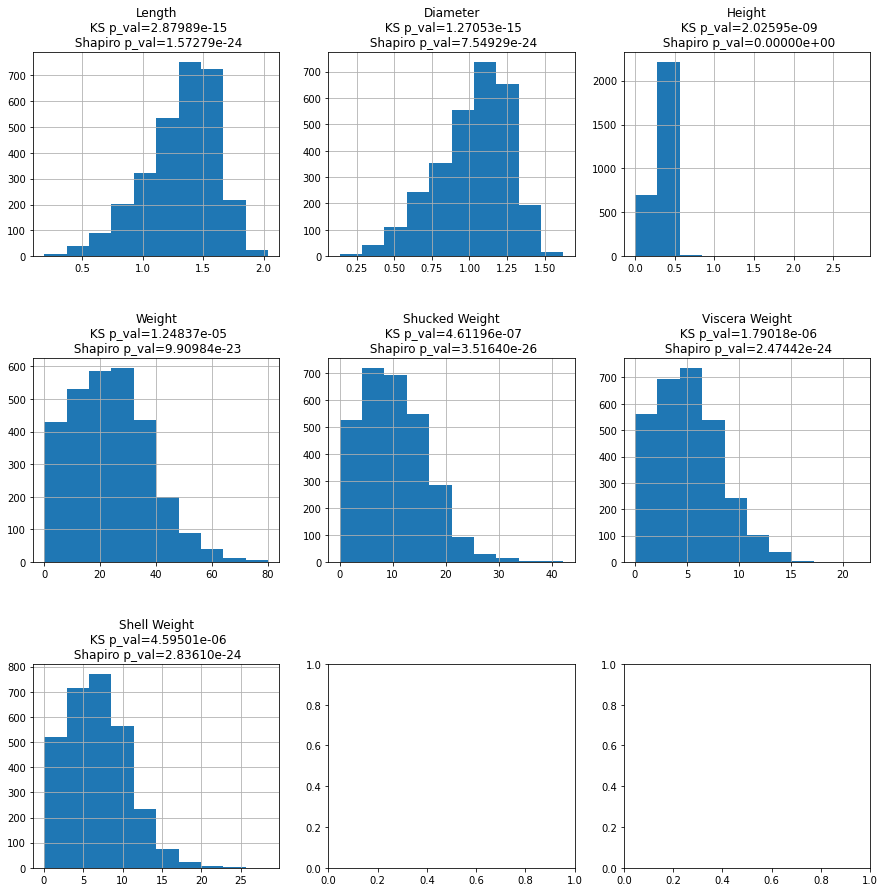

In [105]:
plot_numerical_histograms(crab_train_X, crab_numeric_columns)

### Compare Histogram-Matching to Yeo-Johnson

Correction: Length
Correction: Diameter
Correction: Height
Correction: Weight
Correction: Shucked Weight
Correction: Viscera Weight
Correction: Shell Weight


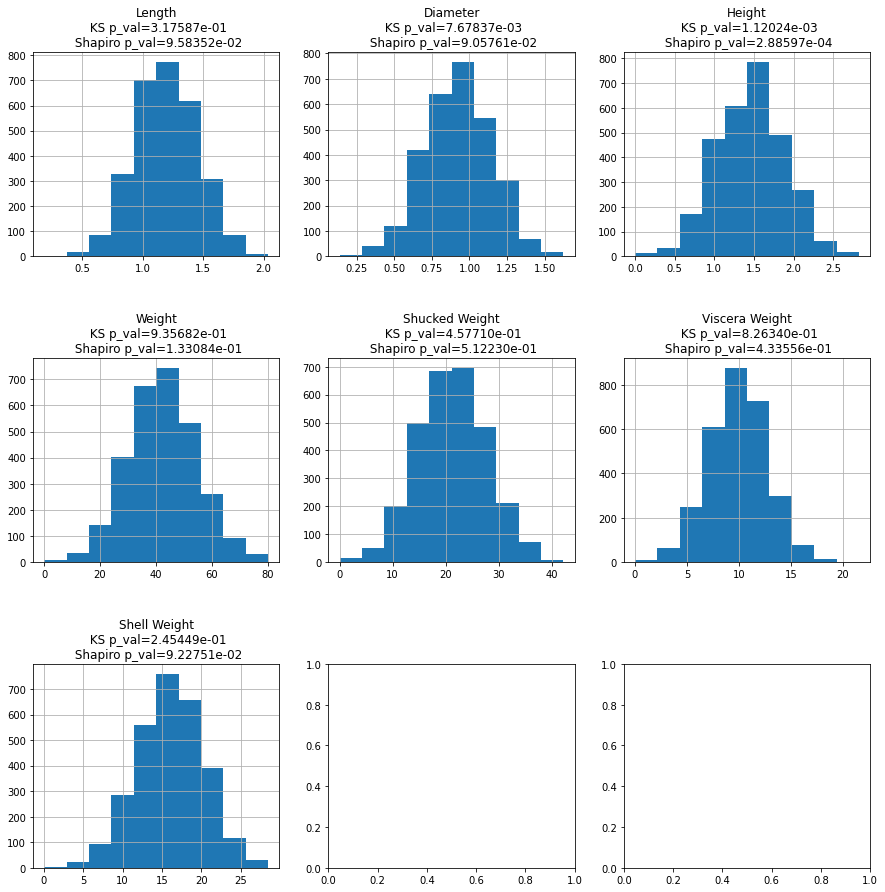

In [106]:
matched_crab_train_df_X, matched_crab_train_df_X_normal_mapping = transform_dataset(crab_train_X[crab_numeric_columns],\
                                                                                    match_to_normal_distribution,\
                                                                                    correction=correction_func)

matched_crab_train_df_X_not, matched_crab_train_df_X_normal_mapping_not = transform_dataset(crab_train_X[crab_numeric_columns],\
                                                                                    match_to_normal_distribution)
plot_numerical_histograms(matched_crab_train_df_X, crab_numeric_columns)

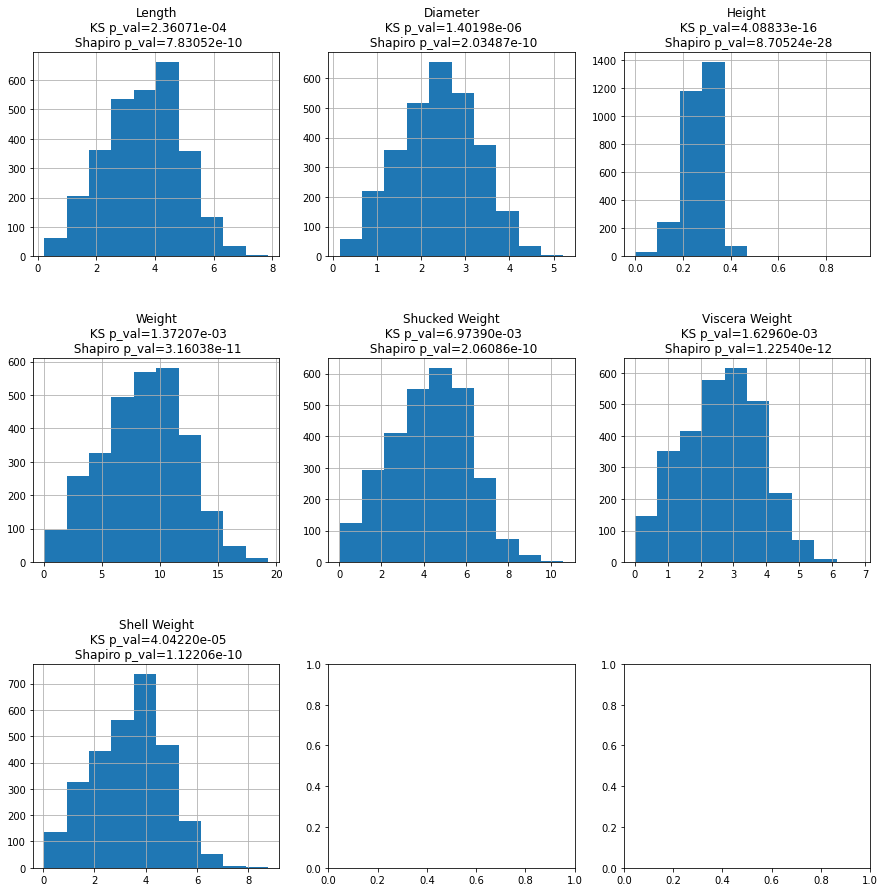

In [107]:
yeo_crab_train_df_X, yeo_crab_train_df_X_normal_mapping = transform_dataset(crab_train_X[crab_numeric_columns], stats.yeojohnson)
plot_numerical_histograms(yeo_crab_train_df_X, crab_numeric_columns)

#### Match test set X

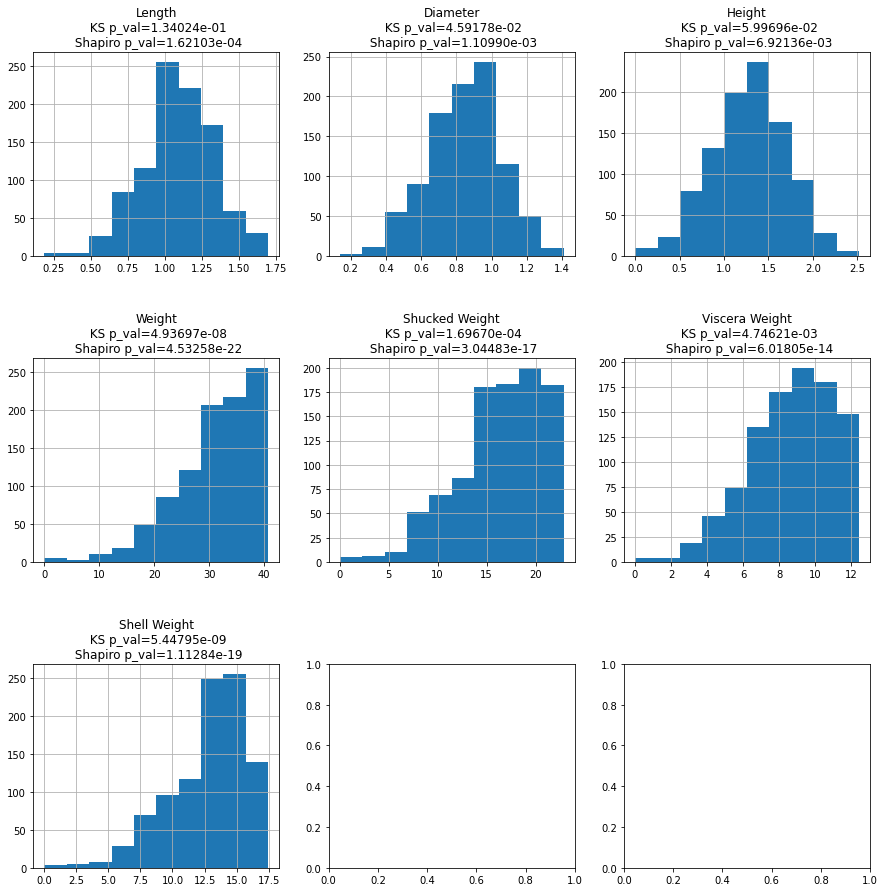

In [108]:
matched_crab_test_df_X, _ = transform_dataset(crab_test_X[crab_numeric_columns], match_to_normal_distribution, mapping=matched_crab_train_df_X_normal_mapping)
plot_numerical_histograms(matched_crab_test_df_X, crab_numeric_columns)

In [109]:
yeo_crab_test_df_X, _ = transform_dataset(crab_test_X[crab_numeric_columns], stats.yeojohnson, mapping=yeo_crab_train_df_X_normal_mapping)

#### Add the categorical columns to the train and the test

In [110]:
matched_crab_train_df_X = pd.concat([matched_crab_train_df_X, crab_train_X[crab_categorical_columns]], axis=1)
matched_crab_test_df_X = pd.concat([matched_crab_test_df_X, crab_test_X[crab_categorical_columns]], axis=1)

yeo_crab_train_df_X = pd.concat([yeo_crab_train_df_X, crab_train_X[crab_categorical_columns]], axis=1)
yeo_crab_test_df_X = pd.concat([yeo_crab_test_df_X, crab_test_X[crab_categorical_columns]], axis=1)

## QQ plots of features

### QQ plots for regular features

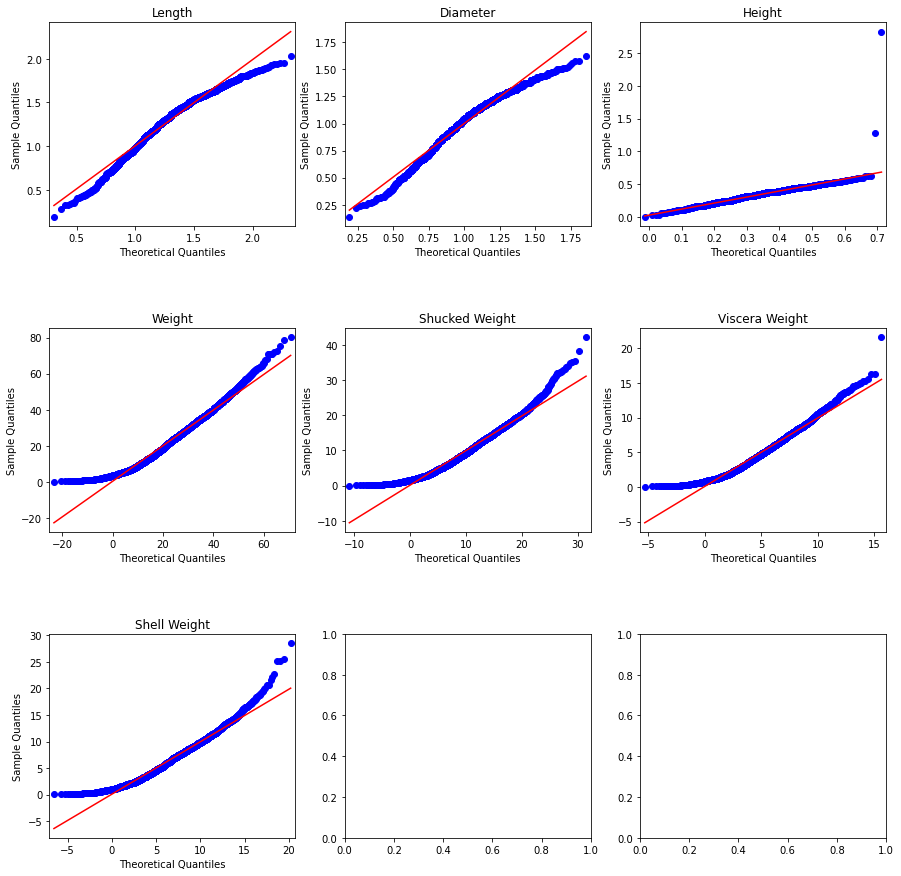

In [111]:
qq_plot_data(crab_train_X, crab_numeric_columns)

### QQ plots for Matched features

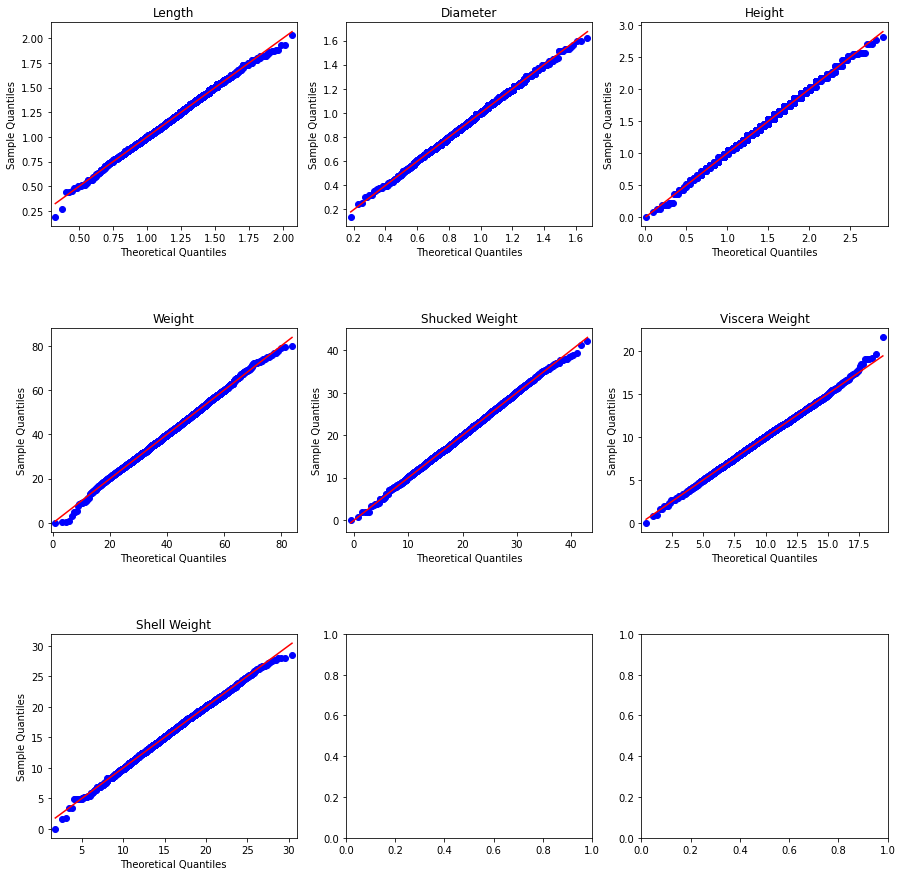

In [112]:
qq_plot_data(matched_crab_train_df_X, crab_numeric_columns)

### QQ plots for Yeo-Johnson features

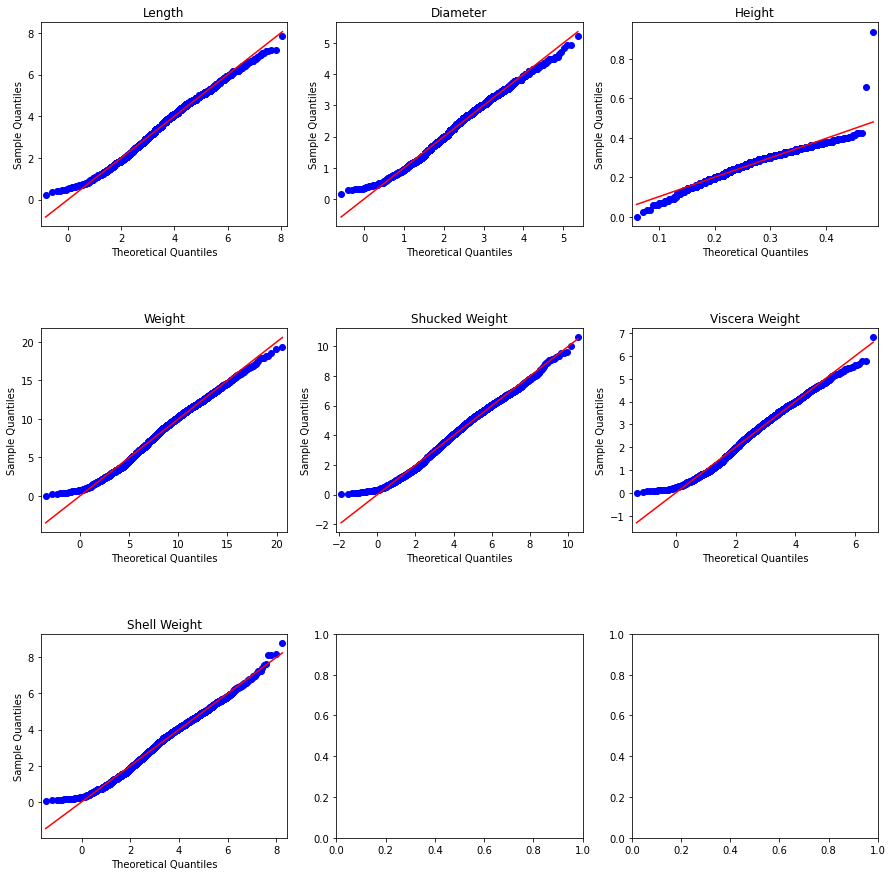

In [113]:
qq_plot_data(yeo_crab_train_df_X, crab_numeric_columns)

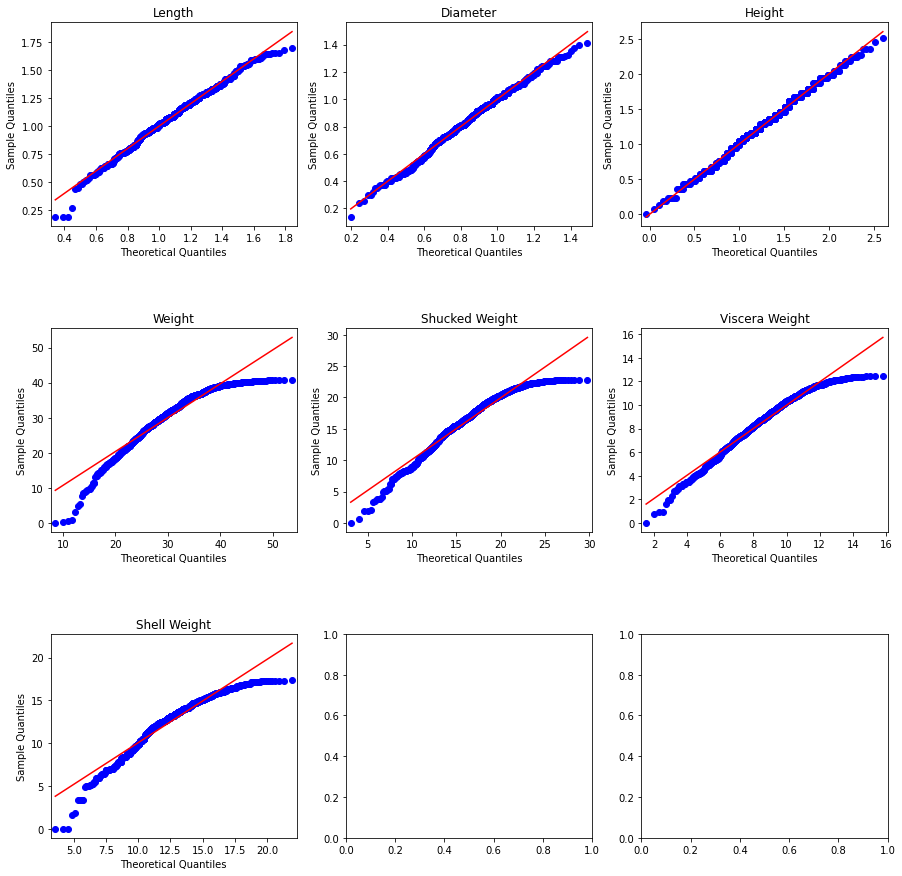

In [114]:
qq_plot_data(matched_crab_test_df_X, crab_numeric_columns)

## Compare model preformance

### Test on regular data

In [115]:
model = LinearRegression()
prediction = model.fit(crab_train_X,crab_train_y).predict(crab_test_X)
print(f'r2={r2_score(crab_test_y,prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(crab_test_y,prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(crab_test_y, prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(crab_test_y, prediction))))

r2=0.5564548312364972
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.162
Mean Absolute Error (Σ|y - pred|/n): 2
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 2


### Test on matched data

In [116]:
model = LinearRegression()
prediction = model.fit(matched_crab_train_df_X,crab_train_y).predict(matched_crab_test_df_X)
print(f'r2={r2_score(crab_test_y,prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(crab_test_y,prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(crab_test_y, prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(crab_test_y, prediction))))

r2=0.06382118899277778
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.198
Mean Absolute Error (Σ|y - pred|/n): 2
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 3


### Test on Yeo-Johnson data

In [117]:
model = LinearRegression()
prediction = model.fit(yeo_crab_train_df_X,crab_train_y).predict(yeo_crab_test_df_X)
print(f'r2={r2_score(crab_test_y,prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(crab_test_y,prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(crab_test_y, prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(crab_test_y, prediction))))

r2=0.5764845835238424
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.162
Mean Absolute Error (Σ|y - pred|/n): 2
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 2


## Try to normalize only 1 column at a time and Compare to regular model

In [118]:
compare_one_norm_column(crab_train_X, crab_test_X, crab_train_y, crab_test_y,\
                        matched_crab_train_df_X, matched_crab_test_df_X,\
                        yeo_crab_train_df_X, yeo_crab_test_df_X, 'Age', crab_numeric_columns)

=== Measure for regular model: ===
column=Age, r2=0.5564548312364972
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.162
Mean Absolute Error (Σ|y - pred|/n): 2
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 2

=== Compare for column Length ===
column=Length, matched r2=0.5400625331326607
column=Length, yeo r2=0.5613243833495102

=== Compare for column Diameter ===
column=Diameter, matched r2=0.5517904275716026
column=Diameter, yeo r2=0.5517316975733157

=== Compare for column Height ===
column=Height, matched r2=0.5445149765304933
column=Height, yeo r2=0.5602939878643768

=== Compare for column Weight ===
column=Weight, matched r2=-0.596070716088053
column=Weight, yeo r2=0.5635832452665317

=== Compare for column Shucked Weight ===
column=Shucked Weight, matched r2=-0.010905599218937523
column=Shucked Weight, yeo r2=0.5297580391927251

=== Compare for column Viscera Weight ===
column=Viscera Weight, matched r2=0.5503701197099973
column=Viscera Weight, yeo r2=0.5515455118614234

=== C

## Get insights about the data

In [119]:
crab_insights = get_insights(crab_train_X[crab_numeric_columns])
crab_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
Length,0.187500,2.037500,1.315763,1.362500,0.297317,0.088397,-0.660814,0.161035,4.501129
Diameter,0.137500,1.625000,1.024199,1.062500,0.245463,0.060252,-0.619299,0.029203,4.309176
Height,0.000000,2.825000,0.350060,0.362500,0.106809,0.011408,4.275186,99.885404,3.425345
Weight,0.056699,80.101512,23.702678,22.920571,13.821863,191.043886,0.527245,0.022491,7.475123
Shucked Weight,0.028349,42.184056,10.288756,9.624655,6.243196,38.977496,0.701490,0.609912,7.034759
Viscera Weight,0.014175,21.545620,5.161367,4.861939,3.083086,9.505417,0.582825,0.118728,6.523081
Shell Weight,0.042524,28.491247,6.828359,6.662132,3.938978,15.515549,0.649957,0.694964,6.029382


In [120]:
matched_crab_insights = get_insights(matched_crab_train_df_X[crab_numeric_columns])
matched_crab_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
Length,0.187500,2.037500,1.195775,1.192308,0.256375,0.065728,-0.033797,-0.093179,4.501129
Diameter,0.137500,1.625000,0.926548,0.924530,0.219590,0.048220,-0.022744,-0.128034,4.309176
Height,0.000000,2.825000,1.454206,1.461841,0.425970,0.181450,-0.009119,-0.053442,3.425345
Weight,0.056699,80.101512,42.292529,42.114093,12.197850,148.787548,0.030130,0.055817,7.475123
Shucked Weight,0.028349,42.184056,21.198637,21.151160,6.410615,41.095982,0.013062,-0.117712,7.034759
Viscera Weight,0.014175,21.545620,9.909602,9.950718,2.789346,7.780450,0.004733,0.146518,6.523081
Shell Weight,0.042524,28.491247,16.092199,16.118604,4.209566,17.720446,-0.086620,-0.069253,6.029382


In [121]:
matched_not_crab_insights = get_insights(matched_crab_train_df_X_not[crab_numeric_columns])
matched_not_crab_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
Length,0.234374,2.265633,1.317974,1.314076,0.298960,0.089377,0.022912,-0.021195,4.501129
Diameter,0.218857,1.914862,1.025250,1.023735,0.244484,0.059772,0.016068,0.035357,4.309176
Height,-0.025091,0.756221,0.357623,0.361973,0.109313,0.011949,0.054055,0.090430,3.425345
Weight,-21.183791,72.212172,23.800730,23.562214,13.776092,189.780705,0.084701,-0.009166,7.475123
Shucked Weight,-9.638599,30.981065,10.295330,10.240599,6.283616,39.483826,0.062372,-0.143819,7.034759
Viscera Weight,-5.725473,15.727674,5.139864,5.160404,3.059557,9.360887,-0.035682,-0.114861,6.523081
Shell Weight,-7.646024,20.623530,6.815009,6.791141,3.960983,15.689383,-0.020115,-0.054836,6.029382


In [122]:
yeo_crab_insights = get_insights(yeo_crab_train_df_X[crab_numeric_columns])
yeo_crab_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
Length,0.221340,7.850147,3.611294,3.674183,1.310060,1.716256,-0.079359,-0.492832,4.501129
Diameter,0.155918,5.223660,2.394270,2.438232,0.875942,0.767275,-0.077002,-0.512460,4.309176
Height,-0.000000,0.937377,0.272107,0.283558,0.062684,0.003929,-0.088386,4.954938,3.425345
Weight,0.056014,19.302865,8.552873,8.828066,3.544571,12.563986,-0.088695,-0.495387,7.475123
Shucked Weight,0.028143,10.597923,4.304651,4.390044,1.826648,3.336642,-0.058437,-0.420949,7.034759
Viscera Weight,0.014120,6.807602,2.647869,2.702836,1.166379,1.360440,-0.056415,-0.579199,6.523081
Shell Weight,0.042078,8.774663,3.386619,3.516971,1.431452,2.049055,-0.047567,-0.354067,6.029382


In [123]:
crab_insights - matched_not_crab_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
Length,-0.046874,-0.228133,-0.002211,0.048424,-0.001643,-0.000980,-0.683727,0.182230,0.0
Diameter,-0.081357,-0.289862,-0.001050,0.038765,0.000979,0.000480,-0.635368,-0.006154,0.0
Height,0.025091,2.068779,-0.007563,0.000527,-0.002504,-0.000541,4.221131,99.794974,0.0
Weight,21.240490,7.889341,-0.098052,-0.641644,0.045771,1.263181,0.442544,0.031657,0.0
Shucked Weight,9.666949,11.202991,-0.006574,-0.615944,-0.040420,-0.506330,0.639119,0.753731,0.0
Viscera Weight,5.739647,5.817946,0.021503,-0.298465,0.023529,0.144530,0.618506,0.233590,0.0
Shell Weight,7.688548,7.867717,0.013351,-0.129009,-0.022004,-0.173834,0.670072,0.749800,0.0


In [124]:
crab_insights - matched_crab_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
Length,0.0,0.0,0.119988,0.170192,0.040942,0.022669,-0.627017,0.254215,0.0
Diameter,0.0,0.0,0.097651,0.137970,0.025872,0.012032,-0.596555,0.157237,0.0
Height,0.0,0.0,-1.104146,-1.099341,-0.319161,-0.170042,4.284305,99.938847,0.0
Weight,0.0,0.0,-18.589851,-19.193522,1.624012,42.256339,0.497115,-0.033326,0.0
Shucked Weight,0.0,0.0,-10.909881,-11.526505,-0.167419,-2.118485,0.688428,0.727624,0.0
Viscera Weight,0.0,0.0,-4.748235,-5.088779,0.293740,1.724967,0.578092,-0.027790,0.0
Shell Weight,0.0,0.0,-9.263840,-9.456471,-0.270588,-2.204897,0.736577,0.764217,0.0


In [125]:
crab_insights - yeo_crab_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
Length,-0.033840,-5.812647,-2.295531,-2.311683,-1.012743,-1.627859,-0.581455,0.653867,0.0
Diameter,-0.018418,-3.598660,-1.370071,-1.375732,-0.630479,-0.707023,-0.542297,0.541663,0.0
Height,0.000000,1.887623,0.077953,0.078942,0.044125,0.007479,4.363572,94.930466,0.0
Weight,0.000685,60.798647,15.149805,14.092505,10.277291,178.479900,0.615939,0.517878,0.0
Shucked Weight,0.000206,31.586133,5.984105,5.234611,4.416548,35.640854,0.759927,1.030862,0.0
Viscera Weight,0.000055,14.738018,2.513498,2.159104,1.916707,8.144977,0.639240,0.697927,0.0
Shell Weight,0.000447,19.716585,3.441740,3.145161,2.507526,13.466494,0.697524,1.049031,0.0


## Plot distributions

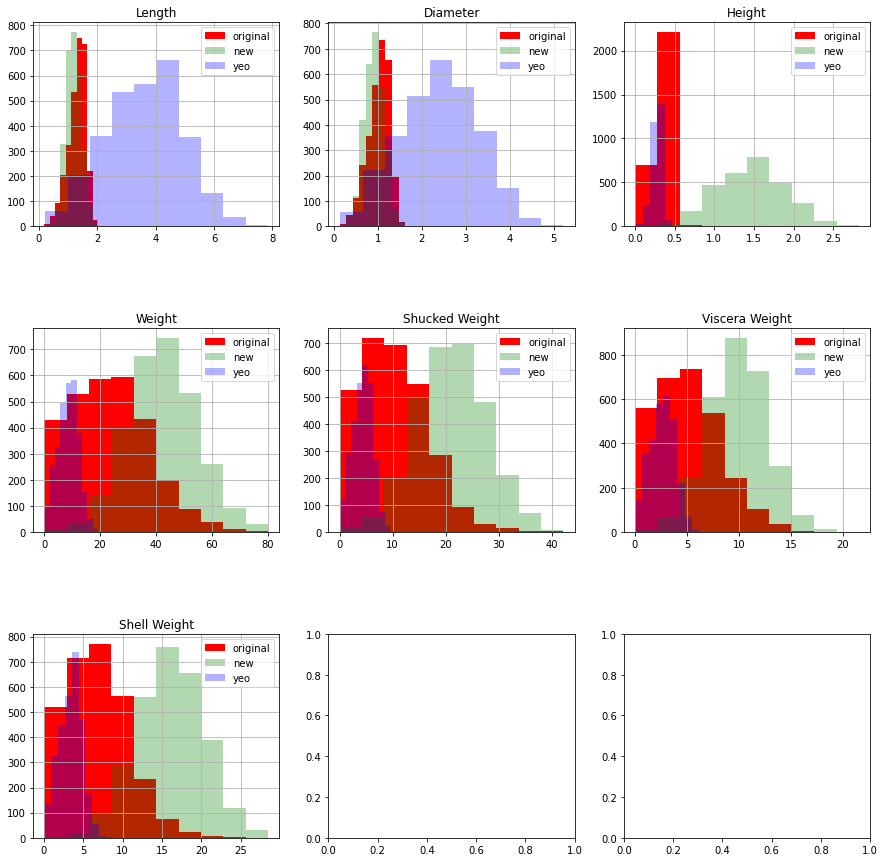

In [126]:
plot_histograms(crab_train_X[crab_numeric_columns], 
                matched_crab_train_df_X[crab_numeric_columns], 
                yeo_crab_train_df_X[crab_numeric_columns])

## Plot a Heatmap of all columns to targets

In [127]:
matched_crab_df_corr = pd.concat([matched_crab_train_df_X, crab_train_y], axis=1)
yeo_crab_df_corr = pd.concat([yeo_crab_train_df_X, crab_train_y], axis=1)

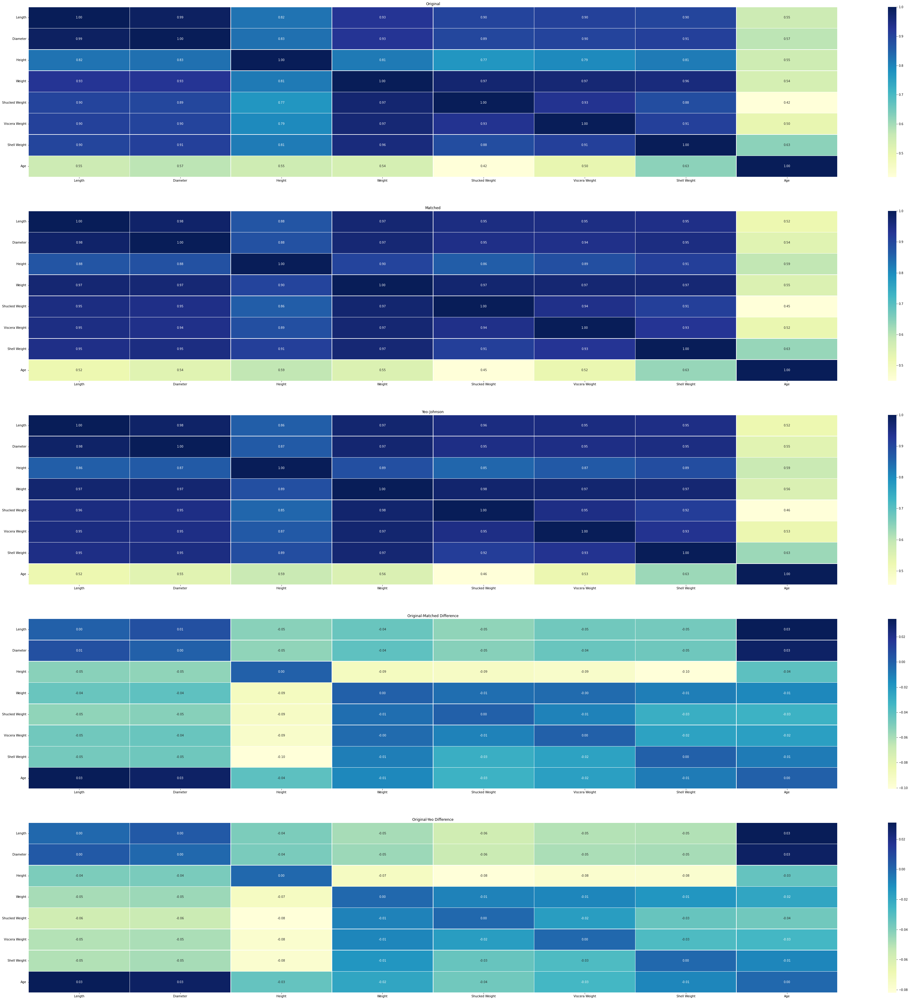

In [128]:
plot_correlation_heatmaps(crab_df, matched_crab_df_corr, yeo_crab_df_corr, crab_numeric_columns + ['Age'])

In [129]:
for column in crab_train_y.to_frame().columns:
    print(f'{"=" * 15} Compare sum of corr for target column: {column} {"=" * 15}')
    print('matched corr sum:', matched_crab_df_corr.corr(method='pearson').loc[column].abs().sum())
    print('yeo corr sum:', yeo_crab_df_corr.corr(method='pearson').loc[column].abs().sum())

=============== Compare sum of corr for target column: Age ===============
matched corr sum: 4.845018187554729
yeo corr sum: 4.856487565454911


In [130]:
crab_diff_corr_df = pd.concat([
           matched_crab_df_corr.corr(method='pearson').abs().sum(axis=1).rename('matched').to_frame(),
           yeo_crab_df_corr.corr(method='pearson').abs().sum(axis=1).rename('yeo').to_frame()
], axis=1)

def highlight_max(s, props=''):
    return np.where(s == np.nanmax(s.values), props, '')

crab_diff_corr_df.style.apply(highlight_max, props='color:white;background-color:darkblue', axis=1)

,matched,yeo
Length,7.235284,7.239146
Diameter,7.260169,7.262416
Height,6.959208,6.857168
Weight,7.335554,7.341475
Shucked Weight,7.059189,7.071665
Viscera Weight,7.185307,7.194506
Shell Weight,7.293305,7.286569
Sex,1.282220,1.283606
Age,4.845018,4.856488


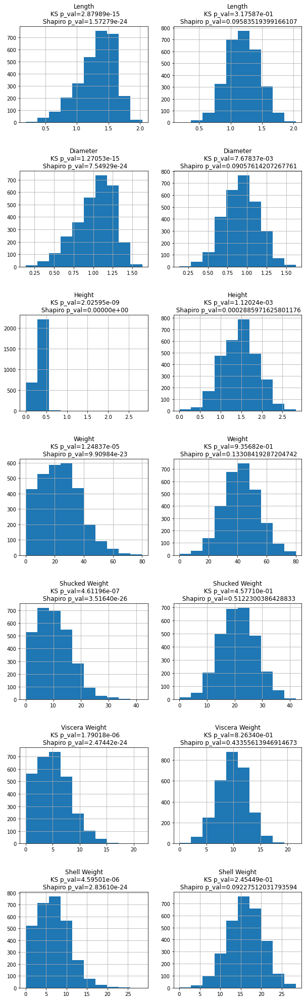

In [131]:
plot_histograms_side_by_side(crab_train_X[crab_numeric_columns], matched_crab_train_df_X[crab_numeric_columns])

## Plot waterfall of each model

Plot for regular model

In [132]:
# print(f'Plot for column: Age')
# model = LinearRegression()
# prediction = model.fit(crab_train_X,crab_train_y).predict(crab_test_X)
# plot_waterfall_coeficients(crab_train_X, crab_test_X, crab_test_y, prediction, model)

Plot for normalized model

In [133]:
# print(f'Plot for column: Age')
# matched_model = LinearRegression()
# matched_prediction = matched_model.fit(matched_crab_train_df_X,crab_train_y).predict(matched_crab_test_df_X)
# plot_waterfall_coeficients(matched_crab_train_df_X, matched_crab_test_df_X, crab_test_y, matched_prediction, matched_model)

Plot for Yeo-Johnson model

In [134]:
#     print(f'Plot for column: {column}')
#     plot_waterfall_coeficients(yeo_measures_train_df_X, yeo_measures_test_df_X, measures_test_df_y[column], yeo_prediction, yeo_model)

# Try on fourth Dataset (Classification)

https://www.kaggle.com/jsphyg/weather-dataset-rattle-package

## Preprocess Dataset

In [135]:
!if [ ! -f datasets/weatherAUS.csv ]; then kaggle datasets download --unzip -d jsphyg/weather-dataset-rattle-package -p datasets/; fi;

In [136]:
aus_df = pd.read_csv('./datasets/weatherAUS.csv')

In [137]:
aus_df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


In [138]:
aus_df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [139]:
print('Shape before droping N/A labels:', aus_df.shape)

Shape before droping N/A labels: (145460, 23)


In [140]:
aus_df = aus_df[aus_df['RainToday'].notna()]
aus_df = aus_df[aus_df['RainTomorrow'].notna()]

print('Shape after droping N/A labels:', aus_df.shape)
aus_df.head()

Shape after droping N/A labels: (140787, 23)


,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [141]:
aus_df['RainToday'] = aus_df['RainToday'].astype('category')
aus_df['RainToday'] = aus_df['RainToday'].cat.codes
aus_df['RainTomorrow'] = aus_df['RainTomorrow'].astype('category')
aus_df['RainTomorrow'] = aus_df['RainTomorrow'].cat.codes

#### Handle dates data in dataset: split into Year, Month, Day

In [142]:
aus_df[['DateYear', 'DateMonth', 'DateDay']] = aus_df['Date'].str.split('-', expand=True)

aus_df.drop('Date', axis=1, inplace=True)

aus_df.DateYear = aus_df.DateYear.astype('category')
aus_df.DateMonth = aus_df.DateMonth.astype('category')
aus_df.DateDay = aus_df.DateDay.astype('category')

aus_df.DateYear = aus_df.DateYear.cat.codes
aus_df.DateMonth = aus_df.DateMonth.cat.codes
aus_df.DateDay = aus_df.DateDay.cat.codes

In [143]:
aus_train_df, aus_test_df = train_test_split(aus_df, test_size=0.25)

print(aus_train_df.shape)
print(aus_test_df.shape)

(105590, 25)
(35197, 25)


In [144]:
aus_numeric_columns, aus_categorical_columns = get_numeric_categorical_columns(aus_train_df, ['RainToday', 'RainTomorrow'], threshold_prec=0.1)

column: Location, %: 0.046405909650535086
column: MinTemp, %: 0.682829813429302
column: MaxTemp, %: 0.6979827635192727
column: Rainfall, %: 0.5947532910313477
column: Evaporation, %: 42.737001610000945
column: Sunshine, %: 47.58878681693342
column: WindGustDir, %: 0.016100009470593805
column: WindGustSpeed, %: 6.51387441992613
column: WindDir9am, %: 0.016100009470593805
column: WindDir3pm, %: 0.016100009470593805
column: WindSpeed9am, %: 0.7728004545885028
column: WindSpeed3pm, %: 1.8676010985888816
column: Humidity9am, %: 1.1506771474571456
column: Humidity3pm, %: 2.603466237333081
column: Pressure9am, %: 10.351359030211196
column: Pressure3pm, %: 10.386400227294251
column: Cloud9am, %: 37.51681030400606
column: Cloud3pm, %: 40.00094705938062
column: Temp9am, %: 0.8807652239795435
column: Temp3pm, %: 2.370489629699782
column: DateYear, %: 0.010417653186854815
column: DateMonth, %: 0.01136471256747798
column: DateDay, %: 0.02935884079931812
numeric_columns = ['MinTemp', 'MaxTemp', 'Rai

In [145]:
print(aus_numeric_columns)
print(aus_categorical_columns)

['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']
['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'DateYear', 'DateMonth', 'DateDay']


#### Fill numerical and Categorical N/A values

In [146]:
aus_df.isna().sum() / len(aus_df) * 100

Location          0.000000
MinTemp           0.332417
MaxTemp           0.218060
Rainfall          0.000000
Evaporation      42.400222
Sunshine         47.451114
WindGustDir       6.508413
WindGustSpeed     6.467216
WindDir9am        6.861429
WindDir3pm        2.606775
WindSpeed9am      0.749359
WindSpeed3pm      1.797751
Humidity9am       1.077514
Humidity3pm       2.486735
Pressure9am       9.761555
Pressure3pm       9.780022
Cloud9am         37.379161
Cloud3pm         39.843167
Temp9am           0.465952
Temp3pm           1.863808
RainToday         0.000000
RainTomorrow      0.000000
DateYear          0.000000
DateMonth         0.000000
DateDay           0.000000
dtype: float64

In [147]:
for column in aus_numeric_columns:
    aus_train_df[column] = aus_train_df[column].fillna(aus_train_df[column].mean())

for column in aus_numeric_columns:
    aus_test_df[column] = aus_test_df[column].fillna(aus_test_df[column].mean())

In [148]:
for column in aus_categorical_columns:
    aus_train_df[column] = aus_train_df[column].fillna('UNKNOWN')
    aus_train_df[column] = aus_train_df[column].astype('category')
    aus_train_df[column] = aus_train_df[column].cat.codes

for column in aus_categorical_columns:
    aus_test_df[column] = aus_test_df[column].fillna('UNKNOWN')
    aus_test_df[column] = aus_test_df[column].astype('category')
    aus_test_df[column] = aus_test_df[column].cat.codes

Test for N/A values again

In [149]:
aus_train_df.isna().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
DateYear         0
DateMonth        0
DateDay          0
dtype: int64

In [150]:
aus_test_df.isna().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
DateYear         0
DateMonth        0
DateDay          0
dtype: int64

In [151]:
aus_test_df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,DateYear,DateMonth,DateDay
69479,18,14.4,24.1,0.0,7.000000,13.100000,10,50.000000,4,11,...,1007.300000,4.450667,4.534949,18.3,22.1,0,1,7,11,24
10999,11,7.2,21.4,0.0,5.505798,7.622562,13,39.947788,13,13,...,1015.260405,4.450667,4.534949,15.2,19.3,0,0,7,6,23
140659,13,24.7,34.3,0.2,5.800000,10.000000,6,35.000000,4,6,...,1007.000000,7.000000,3.000000,30.7,33.9,0,0,5,9,25
18416,26,18.2,22.4,0.0,5.505798,7.622562,2,30.000000,9,10,...,1023.400000,4.450667,4.534949,21.8,21.6,0,0,2,9,28
21611,27,19.2,21.9,21.0,4.400000,8.300000,14,72.000000,15,15,...,1003.500000,1.000000,4.000000,21.0,20.8,1,1,3,4,7


#### Extract Target Features

In [152]:
print(aus_train_df.columns)

Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'DateYear', 'DateMonth',
       'DateDay'],
      dtype='object')


In [153]:
aus_train_df_X = aus_train_df.drop(['RainToday', 'RainTomorrow'], axis=1)
aus_test_df_X = aus_test_df.drop(['RainToday', 'RainTomorrow'], axis=1)

aus_train_df_y = aus_train_df[['RainToday', 'RainTomorrow']]
aus_test_df_y = aus_test_df[['RainToday', 'RainTomorrow']]

In [154]:
print('aus_train_df_X.shape ==',aus_train_df_X.shape)
print('aus_test_df_X.shape ==',aus_test_df_X.shape)
print('aus_train_df_y.shape ==',aus_train_df_y.shape)
print('aus_test_df_y.shape ==',aus_test_df_y.shape)

aus_train_df_X.shape == (105590, 23)
aus_test_df_X.shape == (35197, 23)
aus_train_df_y.shape == (105590, 2)
aus_test_df_y.shape == (35197, 2)


In [155]:
aus_train_df_X.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,DateYear,DateMonth,DateDay
102112,22,13.5,19.3,0.6,1.200000,4.200000,12,37.000000,12,11,...,74.0,1024.100000,1023.400000,7.000000,7.000000,14.8,17.2,9,3,10
12810,21,19.1,32.5,0.0,15.200000,12.000000,13,39.978092,4,4,...,32.0,1011.200000,1007.600000,3.000000,4.000000,24.9,31.5,4,0,13
26206,30,11.9,30.6,0.0,5.461401,7.633199,1,26.000000,3,1,...,30.0,1017.657467,1015.257145,4.424605,4.487232,17.8,29.2,7,10,7
65824,19,9.2,16.4,8.4,4.400000,2.000000,14,59.000000,14,14,...,52.0,1006.600000,1005.500000,7.000000,7.000000,11.1,14.5,6,8,18
72793,20,13.2,25.6,0.0,10.600000,11.400000,10,46.000000,11,8,...,35.0,1020.500000,1019.300000,7.000000,1.000000,15.5,23.9,8,9,25


In [156]:
aus_train_numerical_df_X = aus_train_df_X.drop(aus_categorical_columns, axis=1)
aus_train_categorical_df_X = aus_train_df_X.drop(aus_numeric_columns, axis=1)

aus_test_numerical_df_X = aus_test_df_X.drop(aus_categorical_columns, axis=1)
aus_test_categorical_df_X = aus_test_df_X.drop(aus_numeric_columns, axis=1)

## Visualize histograms of features

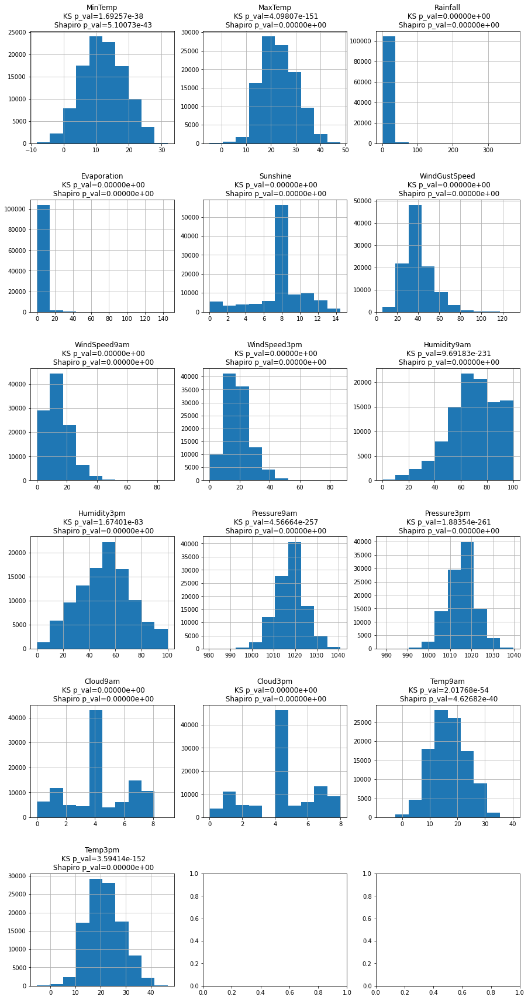

In [157]:
plot_numerical_histograms(aus_train_df_X, aus_numeric_columns)

### Compare Histogram-Matching to Yeo-Johnson

Correction: MinTemp
Correction: MaxTemp
Correction: Rainfall
Correction: Evaporation
Correction: Sunshine
Correction: WindGustSpeed
Correction: WindSpeed9am
Correction: WindSpeed3pm
Correction: Humidity9am
Correction: Humidity3pm
Correction: Pressure9am
Correction: Pressure3pm
Correction: Cloud9am
Correction: Cloud3pm
Correction: Temp9am
Correction: Temp3pm


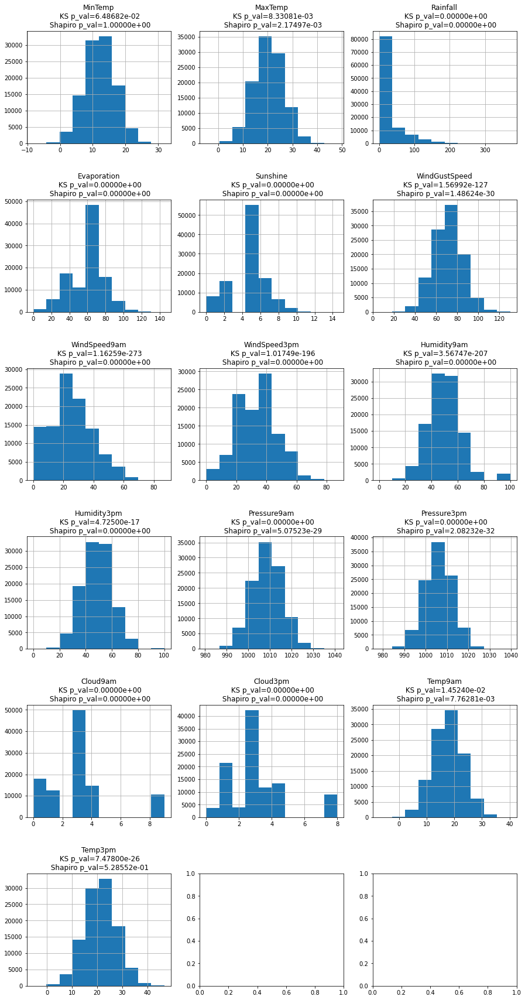

In [158]:
matched_aus_train_df_X, train_df_X_normal_mapping = transform_dataset(aus_train_numerical_df_X,\
                                                                      match_to_normal_distribution,\
                                                                      correction=correction_func)

matched_aus_train_df_X_not, train_df_X_normal_mapping_not = transform_dataset(aus_train_numerical_df_X,\
                                                                      match_to_normal_distribution)

plot_numerical_histograms(matched_aus_train_df_X, aus_numeric_columns)

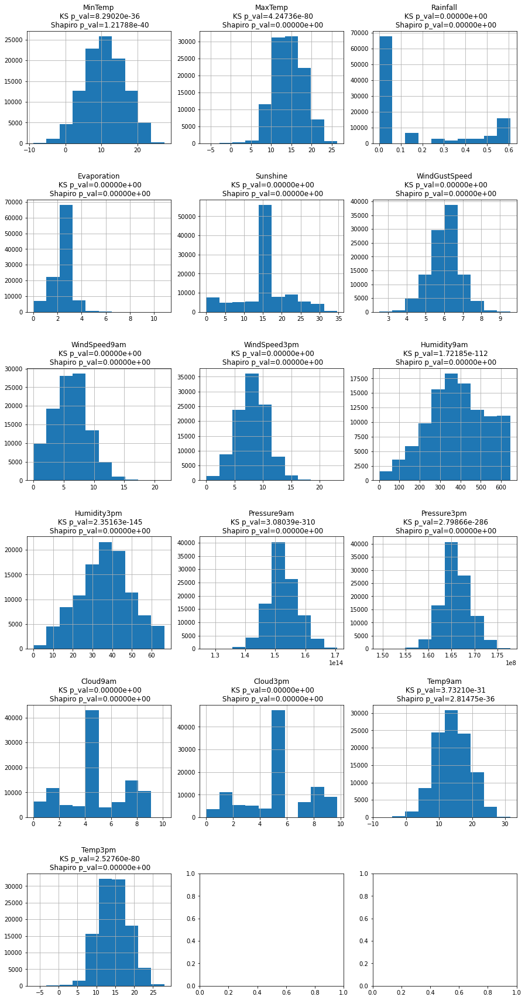

In [159]:
yeo_aus_train_df_X, train_df_X_yeo_mapping = transform_dataset(aus_train_numerical_df_X, stats.yeojohnson)
plot_numerical_histograms(yeo_aus_train_df_X, aus_numeric_columns)

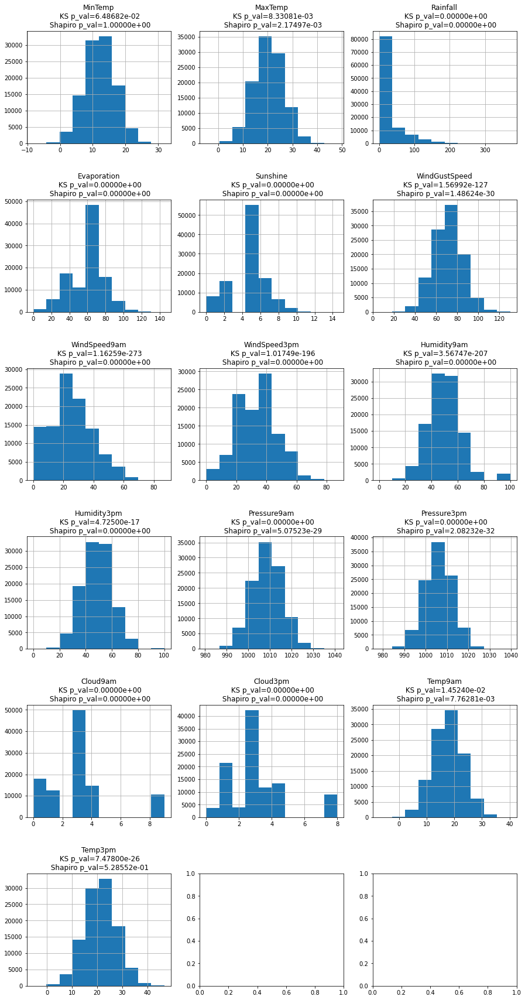

In [160]:
matched_aus_test_df_X, _ = transform_dataset(aus_test_numerical_df_X, match_to_normal_distribution, train_df_X_normal_mapping)
plot_numerical_histograms(matched_aus_train_df_X, aus_numeric_columns)

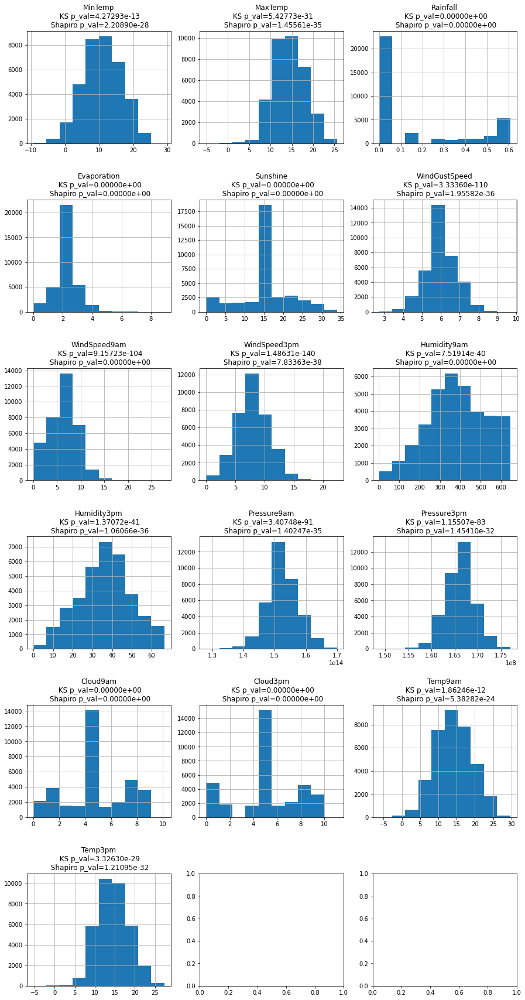

In [161]:
yeo_aus_test_df_X, _ = transform_dataset(aus_test_numerical_df_X, stats.yeojohnson, train_df_X_yeo_mapping)
plot_numerical_histograms(yeo_aus_test_df_X, aus_numeric_columns)

## QQ plots of features

### QQ plots for regular features

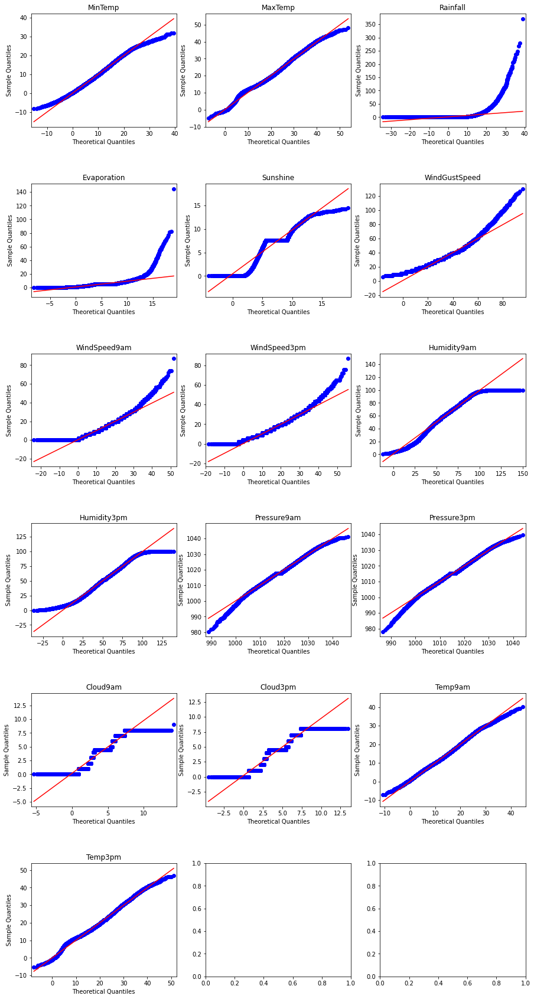

In [162]:
qq_plot_data(aus_train_df_X, aus_numeric_columns)

### QQ plots for Matched features

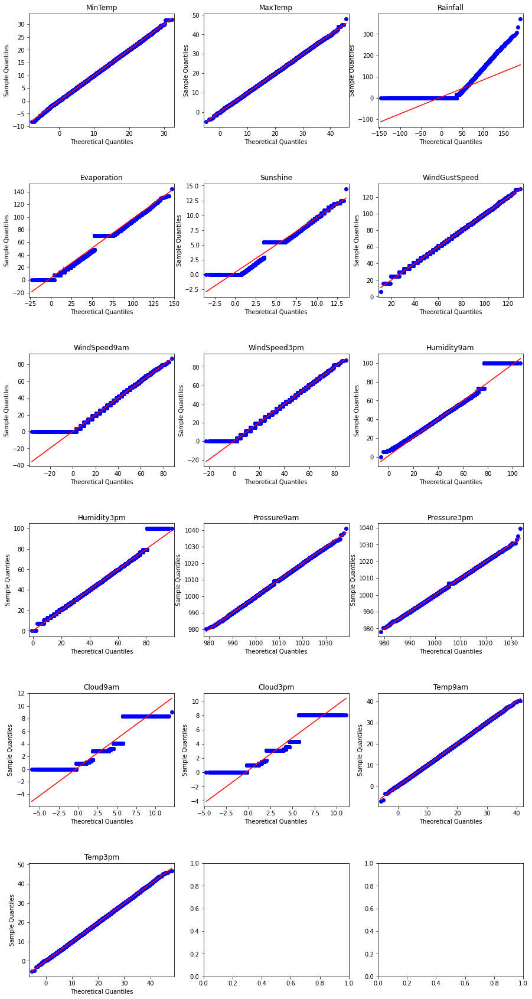

In [163]:
qq_plot_data(matched_aus_train_df_X, aus_numeric_columns)

### QQ plots for Yeo-Johnson features

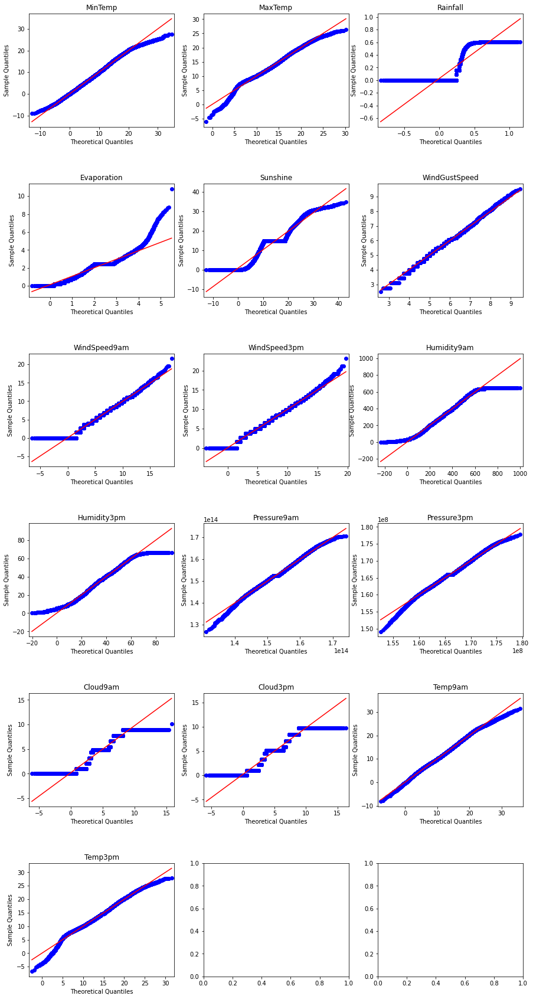

In [164]:
qq_plot_data(yeo_aus_train_df_X, aus_numeric_columns)

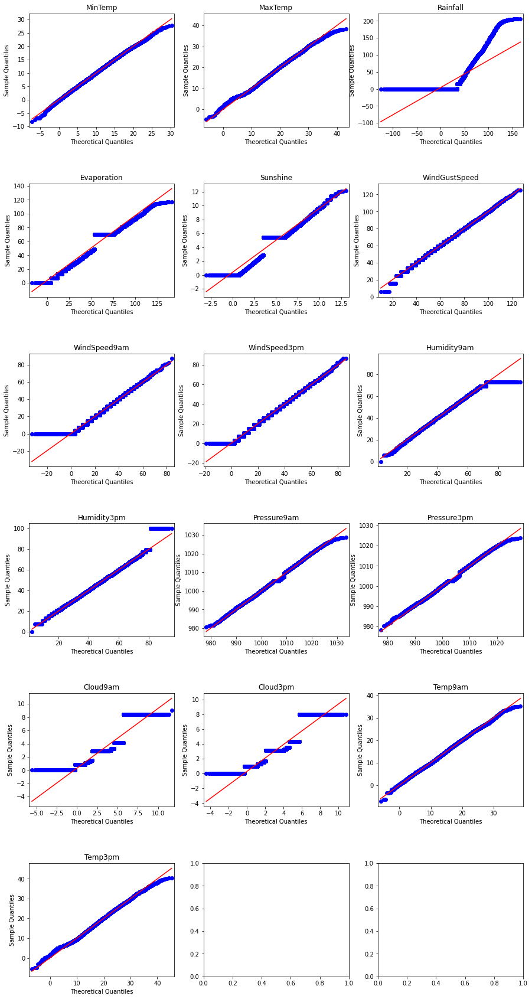

In [165]:
qq_plot_data(matched_aus_test_df_X, aus_numeric_columns)

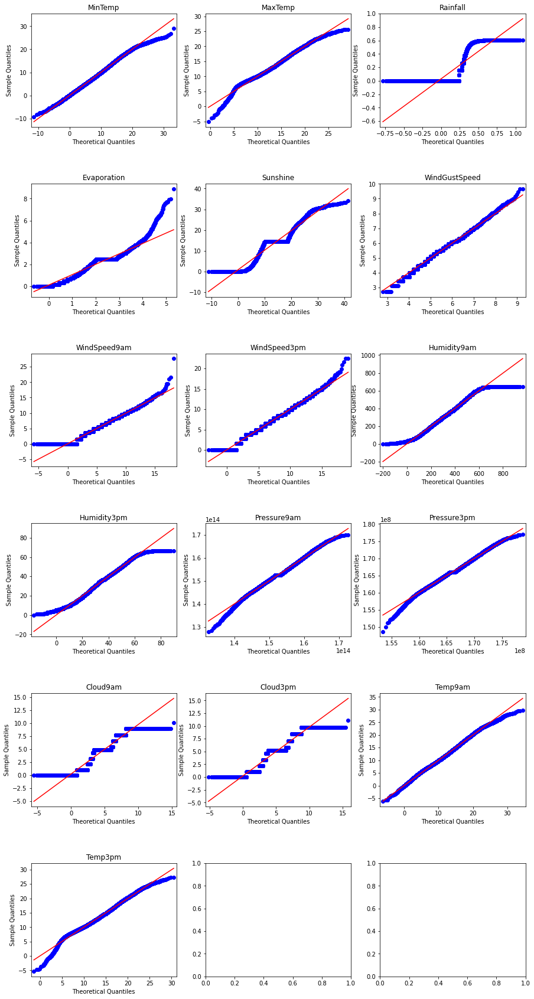

In [166]:
qq_plot_data(yeo_aus_test_df_X, aus_numeric_columns)

## Compare model preformance

#### Reassemble datasets

In [167]:
aus_train_df_X = pd.concat([aus_train_numerical_df_X, aus_train_categorical_df_X], axis=1)

aus_test_df_X = pd.concat([aus_test_numerical_df_X, aus_test_categorical_df_X], axis=1)

In [168]:
matched_aus_train_df_X = pd.concat([matched_aus_train_df_X, aus_train_categorical_df_X], axis=1)

matched_aus_test_df_X = pd.concat([matched_aus_test_df_X, aus_test_categorical_df_X], axis=1)

In [169]:
aus_train_df_X = pd.concat([yeo_aus_train_df_X, aus_train_categorical_df_X], axis=1)

aus_test_df_X = pd.concat([yeo_aus_test_df_X, aus_test_categorical_df_X], axis=1)

### Test on regular data

In [170]:
for column in aus_test_df_y:
    model = LogisticRegression()
    prediction = model.fit(aus_train_df_X,aus_train_df_y[column]).predict(aus_test_df_X)
    print(f'column={column}, acc={accuracy_score(aus_test_df_y[column],prediction)}')
    print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(aus_test_df_y[column],prediction)))
    print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(aus_test_df_y[column], prediction)))
    print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(aus_test_df_y[column], prediction))))
    print('=' * 50)

column=RainToday, acc=0.7769980396056482
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.223
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0
column=RainTomorrow, acc=0.7789584339574396
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.221
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0


### Test on matched data

In [171]:
for column in aus_test_df_y:
    matched_model = LogisticRegression()
    matched_prediction = matched_model.fit(matched_aus_train_df_X,aus_train_df_y[column]).predict(matched_aus_test_df_X)
    print(f'column={column}, acc={accuracy_score(aus_test_df_y[column], matched_prediction)}')
    print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(aus_test_df_y[column],matched_prediction)))
    print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(aus_test_df_y[column], matched_prediction)))
    print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(aus_test_df_y[column], matched_prediction))))
    print('=' * 50)

column=RainToday, acc=0.9999431769753104
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.000
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0
column=RainTomorrow, acc=0.8411228229678666
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 159,430,779,205,717.594
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0


### Test on Yeo-Johnson data

In [172]:
for column in aus_test_df_y:
    yeo_model = LogisticRegression()
    yeo_prediction = yeo_model.fit(yeo_aus_train_df_X,aus_train_df_y[column]).predict(yeo_aus_test_df_X)
    print(f'column={column}, acc={accuracy_score(aus_test_df_y[column], yeo_prediction)}')
    print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(aus_test_df_y[column],yeo_prediction)))
    print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(aus_test_df_y[column], yeo_prediction)))
    print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(aus_test_df_y[column], yeo_prediction))))
    print('=' * 50)

column=RainToday, acc=0.7769980396056482
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.223
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0
column=RainTomorrow, acc=0.7789584339574396
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.221
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0


## Try to normalize only 1 column at a time and Compare to regular model

In [173]:
for column in aus_test_df_y:
    compare_one_norm_column(aus_train_df_X, aus_test_df_X, aus_train_df_y[column],\
                            aus_test_df_y[column], matched_aus_train_df_X, matched_aus_test_df_X,\
                            yeo_aus_train_df_X, yeo_aus_test_df_X, column, aus_numeric_columns, acc=True)

=== Measure for regular model: ===
column=RainToday, acc=0.7769980396056482
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.223
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0

=== Compare for column MinTemp ===
column=MinTemp, matched acc=0.7769980396056482
column=MinTemp, yeo acc=0.7769980396056482

=== Compare for column MaxTemp ===
column=MaxTemp, matched acc=0.7769980396056482
column=MaxTemp, yeo acc=0.7769980396056482

=== Compare for column Rainfall ===
column=Rainfall, matched acc=0.7769980396056482
column=Rainfall, yeo acc=0.7769980396056482

=== Compare for column Evaporation ===
column=Evaporation, matched acc=0.7769980396056482
column=Evaporation, yeo acc=0.7769980396056482

=== Compare for column Sunshine ===
column=Sunshine, matched acc=0.7769980396056482
column=Sunshine, yeo acc=0.7769980396056482

=== Compare for column WindGustSpeed ===
column=WindGustSpeed, matched acc=0.7769980396056482
column=WindGustSpeed, yeo acc=0.7769980

## Get insights about the data

In [174]:
aus_insights = get_insights(aus_train_df_X[aus_numeric_columns])
aus_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
MinTemp,-8.941891e+00,2.747427e+01,1.089637e+01,1.083552e+01,5.564160e+00,3.095988e+01,-0.068135,-0.390547,5.568663
MaxTemp,-6.089698e+00,2.635236e+01,1.440034e+01,1.424243e+01,3.692550e+00,1.363492e+01,0.028862,-0.042500,5.662227
Rainfall,-0.000000e+00,6.061676e-01,1.580208e-01,0.000000e+00,2.334007e-01,5.447590e-02,1.005053,-0.758734,2.148516
Evaporation,0.000000e+00,1.084069e+01,2.332700e+00,2.450139e+00,7.382003e-01,5.449397e-01,0.114476,3.394442,3.115703
Sunshine,0.000000e+00,3.468101e+01,1.512447e+01,1.460390e+01,6.515661e+00,4.245384e+01,-0.046501,0.584178,3.229345
WindGustSpeed,2.507805e+00,9.548335e+00,6.032683e+00,6.066788e+00,8.026284e-01,6.442123e-01,0.013063,0.483214,3.375145
WindSpeed9am,0.000000e+00,2.159657e+01,6.190888e+00,6.271122e+00,2.971134e+00,8.827637e+00,-0.058944,-0.048183,2.914527
WindSpeed3pm,0.000000e+00,2.311402e+01,8.092548e+00,8.342487e+00,2.725446e+00,7.428058e+00,0.020904,0.248438,2.974535
Humidity9am,0.000000e+00,6.446366e+02,3.824908e+02,3.812854e+02,1.446274e+02,2.091710e+04,-0.110732,-0.569694,4.285057
Humidity3pm,0.000000e+00,6.642584e+01,3.633457e+01,3.665238e+01,1.324418e+01,1.754082e+02,-0.081156,-0.423394,4.430049


In [175]:
matched_aus_insights = get_insights(matched_aus_train_df_X[aus_numeric_columns])
matched_aus_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
MinTemp,-8.2,31.9,12.185937,12.174673,4.676564,21.870252,-0.003055,-0.008876,5.568663
MaxTemp,-4.8,48.1,20.385360,20.372202,5.913275,34.966820,0.016915,-0.002033,5.662227
Rainfall,0.0,371.0,21.710768,0.000000,39.368769,1549.899959,2.229745,5.255744,2.148516
Evaporation,0.0,145.0,61.857420,70.340075,19.890930,395.649090,-0.543640,-0.303013,3.115703
Sunshine,0.0,14.5,5.017848,5.459916,1.998884,3.995539,-0.703695,0.318316,3.229345
WindGustSpeed,6.0,130.0,70.683486,70.447832,13.988999,195.692095,0.008840,0.000217,3.375145
WindSpeed9am,0.0,87.0,25.618152,25.323632,14.437433,208.439473,0.197389,-0.354975,2.914527
WindSpeed3pm,0.0,87.0,33.563935,32.301490,13.001943,169.050521,0.049383,-0.076177,2.974535
Humidity9am,0.0,100.0,49.891576,49.647936,13.177726,173.652452,0.843279,2.654150,4.285057
Humidity3pm,0.0,100.0,48.636363,48.413871,11.542934,133.239317,0.182155,0.653729,4.430049


In [176]:
matched_not_aus_insights = get_insights(matched_aus_train_df_X_not[aus_numeric_columns])
matched_not_aus_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
MinTemp,-14.347509,40.940508,12.197633,12.174725,6.392442,40.863320,0.003781,0.009750,5.568663
MaxTemp,-7.391547,54.457608,23.296320,23.305048,7.088891,50.252383,-0.004404,0.022373,5.662227
Rainfall,5.449204,40.110690,7.625007,5.449204,3.949802,15.600935,2.220309,5.173907,2.148516
Evaporation,-3.845279,18.687182,6.302935,7.701695,3.281547,10.768548,-0.553414,-0.298333,3.115703
Sunshine,1.774650,19.854850,8.480824,9.080347,2.674663,7.153824,-0.713725,0.313016,3.229345
WindGustSpeed,-16.447770,95.546236,40.851800,40.619391,12.875689,165.783380,-0.003127,-0.017588,3.375145
WindSpeed9am,0.375487,53.923999,15.077250,14.934282,8.299133,68.875606,0.203279,-0.326294,2.914527
WindSpeed3pm,-2.572132,60.548534,19.600668,18.794756,8.507584,72.378981,0.038855,-0.077626,2.974535
Humidity9am,-11.213484,151.191763,70.198380,69.718488,21.372268,456.773851,0.834694,2.605091,4.285057
Humidity3pm,-34.500243,132.776900,51.984052,51.626019,20.628607,425.539423,0.116747,0.307928,4.430049


In [177]:
yeo_aus_insights = get_insights(yeo_aus_train_df_X[aus_numeric_columns])
yeo_aus_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
MinTemp,-8.941891e+00,2.747427e+01,1.089637e+01,1.083552e+01,5.564160e+00,3.095988e+01,-0.068135,-0.390547,5.568663
MaxTemp,-6.089698e+00,2.635236e+01,1.440034e+01,1.424243e+01,3.692550e+00,1.363492e+01,0.028862,-0.042500,5.662227
Rainfall,-0.000000e+00,6.061676e-01,1.580208e-01,0.000000e+00,2.334007e-01,5.447590e-02,1.005053,-0.758734,2.148516
Evaporation,0.000000e+00,1.084069e+01,2.332700e+00,2.450139e+00,7.382003e-01,5.449397e-01,0.114476,3.394442,3.115703
Sunshine,0.000000e+00,3.468101e+01,1.512447e+01,1.460390e+01,6.515661e+00,4.245384e+01,-0.046501,0.584178,3.229345
WindGustSpeed,2.507805e+00,9.548335e+00,6.032683e+00,6.066788e+00,8.026284e-01,6.442123e-01,0.013063,0.483214,3.375145
WindSpeed9am,0.000000e+00,2.159657e+01,6.190888e+00,6.271122e+00,2.971134e+00,8.827637e+00,-0.058944,-0.048183,2.914527
WindSpeed3pm,0.000000e+00,2.311402e+01,8.092548e+00,8.342487e+00,2.725446e+00,7.428058e+00,0.020904,0.248438,2.974535
Humidity9am,0.000000e+00,6.446366e+02,3.824908e+02,3.812854e+02,1.446274e+02,2.091710e+04,-0.110732,-0.569694,4.285057
Humidity3pm,0.000000e+00,6.642584e+01,3.633457e+01,3.665238e+01,1.324418e+01,1.754082e+02,-0.081156,-0.423394,4.430049


In [178]:
aus_insights - matched_not_aus_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
MinTemp,5.405617e+00,-1.346623e+01,-1.301259e+00,-1.339201e+00,-8.282824e-01,-9.903444e+00,-0.071916,-0.400297,0.0
MaxTemp,1.301849e+00,-2.810525e+01,-8.895979e+00,-9.062616e+00,-3.396342e+00,-3.661746e+01,0.033267,-0.064873,0.0
Rainfall,-5.449204e+00,-3.950452e+01,-7.466986e+00,-5.449204e+00,-3.716401e+00,-1.554646e+01,-1.215256,-5.932641,0.0
Evaporation,3.845279e+00,-7.846489e+00,-3.970235e+00,-5.251556e+00,-2.543346e+00,-1.022361e+01,0.667890,3.692775,0.0
Sunshine,-1.774650e+00,1.482616e+01,6.643642e+00,5.523556e+00,3.840998e+00,3.530001e+01,0.667224,0.271162,0.0
WindGustSpeed,1.895557e+01,-8.599790e+01,-3.481912e+01,-3.455260e+01,-1.207306e+01,-1.651392e+02,0.016190,0.500803,0.0
WindSpeed9am,-3.754867e-01,-3.232743e+01,-8.886362e+00,-8.663161e+00,-5.327999e+00,-6.004797e+01,-0.262222,0.278110,0.0
WindSpeed3pm,2.572132e+00,-3.743451e+01,-1.150812e+01,-1.045227e+01,-5.782137e+00,-6.495092e+01,-0.017951,0.326064,0.0
Humidity9am,1.121348e+01,4.934448e+02,3.122925e+02,3.115669e+02,1.232552e+02,2.046032e+04,-0.945425,-3.174785,0.0
Humidity3pm,3.450024e+01,-6.635106e+01,-1.564948e+01,-1.497364e+01,-7.384430e+00,-2.501312e+02,-0.197903,-0.731321,0.0


In [179]:
aus_insights - matched_aus_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
MinTemp,-7.418915e-01,-4.425726e+00,-1.289563e+00,-1.339149e+00,8.875959e-01,9.089625e+00,-0.065080,-0.381670,0.0
MaxTemp,-1.289698e+00,-2.174764e+01,-5.985019e+00,-6.129771e+00,-2.220725e+00,-2.133190e+01,0.011947,-0.040467,0.0
Rainfall,-0.000000e+00,-3.703938e+02,-2.155275e+01,0.000000e+00,-3.913537e+01,-1.549845e+03,-1.224692,-6.014478,0.0
Evaporation,0.000000e+00,-1.341593e+02,-5.952472e+01,-6.788994e+01,-1.915273e+01,-3.951042e+02,0.658116,3.697455,0.0
Sunshine,0.000000e+00,2.018101e+01,1.010662e+01,9.143987e+00,4.516777e+00,3.845830e+01,0.657194,0.265862,0.0
WindGustSpeed,-3.492195e+00,-1.204517e+02,-6.465080e+01,-6.438104e+01,-1.318637e+01,-1.950479e+02,0.004223,0.482997,0.0
WindSpeed9am,0.000000e+00,-6.540343e+01,-1.942726e+01,-1.905251e+01,-1.146630e+01,-1.996118e+02,-0.256332,0.306792,0.0
WindSpeed3pm,0.000000e+00,-6.388598e+01,-2.547139e+01,-2.395900e+01,-1.027650e+01,-1.616225e+02,-0.028479,0.324616,0.0
Humidity9am,0.000000e+00,5.446366e+02,3.325993e+02,3.316375e+02,1.314497e+02,2.074344e+04,-0.954011,-3.223844,0.0
Humidity3pm,0.000000e+00,-3.357416e+01,-1.230180e+01,-1.176150e+01,1.701243e+00,4.216890e+01,-0.263311,-1.077123,0.0


In [180]:
aus_insights - yeo_aus_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
MinTemp,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MaxTemp,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Rainfall,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Evaporation,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Sunshine,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
WindGustSpeed,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
WindSpeed9am,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
WindSpeed3pm,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Humidity9am,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Humidity3pm,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Plot distributions

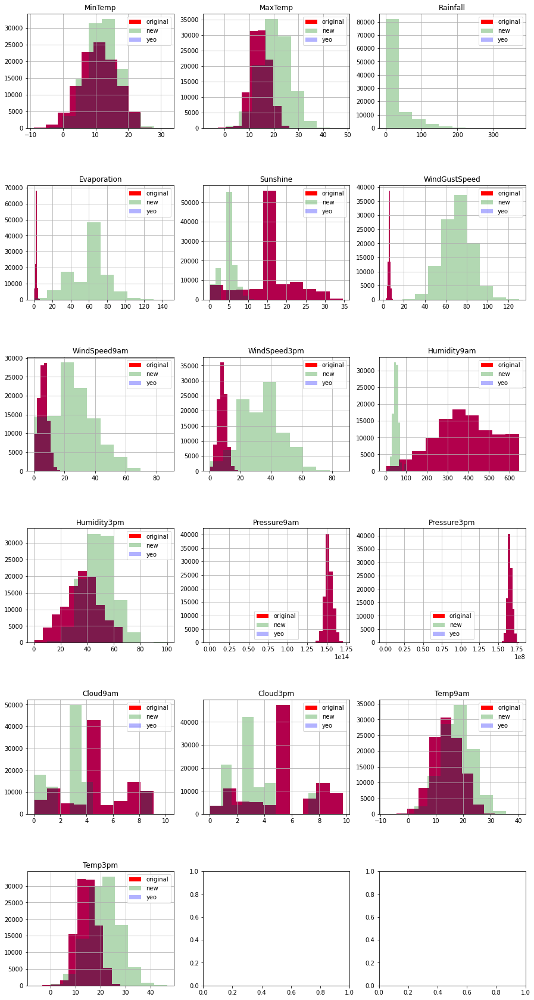

In [181]:
plot_histograms(aus_train_df_X[aus_numeric_columns], 
                matched_aus_train_df_X[aus_numeric_columns], 
                yeo_aus_train_df_X[aus_numeric_columns])

## Plot a Heatmap of all columns to targets

In [182]:
matched_aus_df_corr = pd.concat([matched_aus_train_df_X, aus_train_df_y], axis=1)
yeo_aus_df_corr = pd.concat([yeo_aus_train_df_X, aus_train_df_y], axis=1)

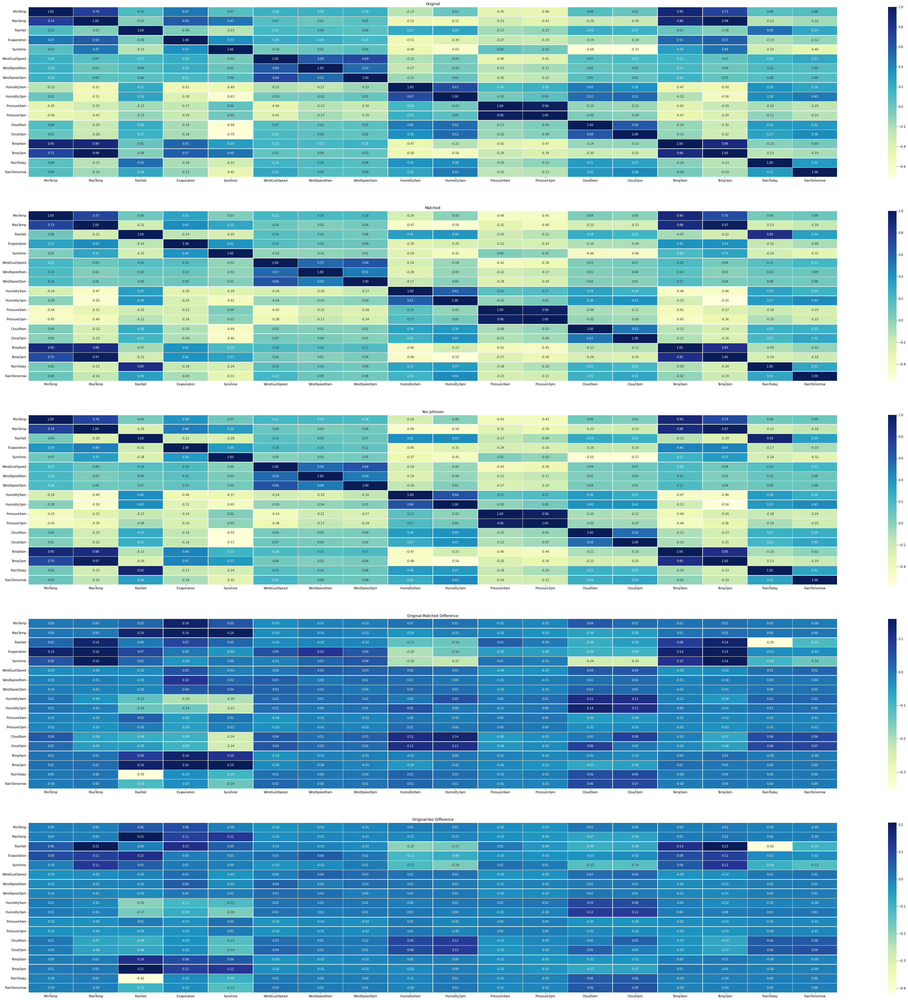

In [183]:
plot_correlation_heatmaps(aus_df, matched_aus_df_corr, yeo_aus_df_corr, aus_numeric_columns + ['RainToday', 'RainTomorrow'])

In [184]:
for column in aus_train_df_y.columns:
    print(f'{"=" * 15} Compare sum of corr for target column: {column} {"=" * 15}')
    print('matched corr sum:', matched_aus_df_corr.corr(method='pearson').loc[column].abs().sum())
    print('yeo corr sum:', yeo_aus_df_corr.corr(method='pearson').loc[column].abs().sum())

=============== Compare sum of corr for target column: RainToday ===============
matched corr sum: 5.374321886375534
yeo corr sum: 5.046924664473947
=============== Compare sum of corr for target column: RainTomorrow ===============
matched corr sum: 4.7404661600924545
yeo corr sum: 4.614641683906314


In [185]:
aus_diff_corr_df = pd.concat([
           matched_aus_df_corr.corr(method='pearson').abs().sum(axis=1).rename('matched').to_frame(),
           yeo_aus_df_corr.corr(method='pearson').abs().sum(axis=1).rename('yeo').to_frame()
], axis=1)

def highlight_max(s, props=''):
    return np.where(s == np.nanmax(s.values), props, '')
    
aus_diff_corr_df.style.apply(highlight_max, props='color:white;background-color:darkblue', axis=1)

,matched,yeo
MinTemp,6.289081,5.750632
MaxTemp,8.109019,7.407768
Rainfall,5.475969,5.440959
Evaporation,5.294131,5.609098
Sunshine,5.012030,5.279300
WindGustSpeed,5.103252,4.645921
WindSpeed9am,3.902700,3.649415
WindSpeed3pm,3.995564,3.737908
Humidity9am,6.732224,6.777453
Humidity3pm,5.964496,5.907304


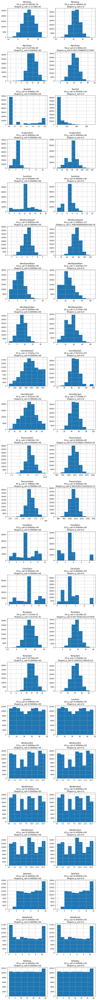

In [186]:
plot_histograms_side_by_side(aus_train_df_X, matched_aus_train_df_X)

# Try on Fifth Dataset (Classification)

https://www.kaggle.com/ruslankl/mice-protein-expression

In [190]:
!if [ ! -f datasets/Data_Cortex_Nuclear.csv ]; then kaggle datasets download --unzip -d ruslankl/mice-protein-expression -p datasets/; fi;

In [191]:
mice_df = pd.read_csv('datasets/Data_Cortex_Nuclear.csv')

In [192]:
mice_df.describe()

,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,...,SHH_N,BAD_N,BCL2_N,pS6_N,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N
count,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,...,1080.000000,867.000000,795.000000,1080.000000,1005.000000,1080.000000,900.000000,870.000000,810.000000,1080.000000
mean,0.425810,0.617102,0.319088,2.297269,3.843934,0.233168,0.181846,3.537109,0.212574,1.428682,...,0.226676,0.157914,0.134762,0.121521,0.131053,0.446073,0.169609,0.183135,0.205440,1.337784
std,0.249362,0.251640,0.049383,0.347293,0.933100,0.041634,0.027042,1.295169,0.032587,0.466904,...,0.028989,0.029537,0.027417,0.014276,0.023863,0.066432,0.059402,0.040406,0.055514,0.317126
min,0.145327,0.245359,0.115181,1.330831,1.737540,0.063236,0.064043,1.343998,0.112812,0.429032,...,0.155869,0.088305,0.080657,0.067254,0.085419,0.258626,0.079691,0.105537,0.101787,0.586479
25%,0.288121,0.473361,0.287444,2.057411,3.155678,0.205755,0.164595,2.479834,0.190823,1.203665,...,0.206395,0.136424,0.115554,0.110839,0.113506,0.398082,0.125848,0.155121,0.165143,1.081423
50%,0.366378,0.565782,0.316564,2.296546,3.760855,0.231177,0.182302,3.326520,0.210594,1.355846,...,0.224000,0.152313,0.129468,0.121626,0.126523,0.448459,0.158240,0.174935,0.193994,1.317441
75%,0.487711,0.698032,0.348197,2.528481,4.440011,0.257261,0.197418,4.481940,0.234595,1.561316,...,0.241655,0.174017,0.148235,0.131955,0.143652,0.490773,0.197876,0.204542,0.235215,1.585824
max,2.516367,2.602662,0.497160,3.757641,8.482553,0.539050,0.317066,7.464070,0.306247,6.113347,...,0.358289,0.282016,0.261506,0.158748,0.256529,0.759588,0.479763,0.360692,0.413903,2.129791


In [193]:
mice_df.head()

,MouseID,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,...,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N,Genotype,Treatment,Behavior,class
0,309_1,0.503644,0.747193,0.430175,2.816329,5.990152,0.218830,0.177565,2.373744,0.232224,...,0.108336,0.427099,0.114783,0.131790,0.128186,1.675652,Control,Memantine,C/S,c-CS-m
1,309_2,0.514617,0.689064,0.411770,2.789514,5.685038,0.211636,0.172817,2.292150,0.226972,...,0.104315,0.441581,0.111974,0.135103,0.131119,1.743610,Control,Memantine,C/S,c-CS-m
2,309_3,0.509183,0.730247,0.418309,2.687201,5.622059,0.209011,0.175722,2.283337,0.230247,...,0.106219,0.435777,0.111883,0.133362,0.127431,1.926427,Control,Memantine,C/S,c-CS-m
3,309_4,0.442107,0.617076,0.358626,2.466947,4.979503,0.222886,0.176463,2.152301,0.207004,...,0.111262,0.391691,0.130405,0.147444,0.146901,1.700563,Control,Memantine,C/S,c-CS-m
4,309_5,0.434940,0.617430,0.358802,2.365785,4.718679,0.213106,0.173627,2.134014,0.192158,...,0.110694,0.434154,0.118481,0.140314,0.148380,1.839730,Control,Memantine,C/S,c-CS-m


In [194]:
mice_df.shape

(1080, 82)

Remove Mouse ID column

In [195]:
mice_df.drop('MouseID', axis=1, inplace=True)

## Preprocess Dataset

In [196]:
mice_df.isna().sum()

DYRK1A_N     3
ITSN1_N      3
BDNF_N       3
NR1_N        3
NR2A_N       3
            ..
CaNA_N       0
Genotype     0
Treatment    0
Behavior     0
class        0
Length: 81, dtype: int64

In [197]:
mice_numeric_columns = mice_df.dtypes[(mice_df.dtypes=="float64") | (mice_df.dtypes=="int64")].index.tolist()
mice_categorical_columns = mice_df.dtypes[~((mice_df.dtypes=="float64") | (mice_df.dtypes=="int64"))].index.tolist()

print(mice_numeric_columns)
print(mice_categorical_columns)

['DYRK1A_N', 'ITSN1_N', 'BDNF_N', 'NR1_N', 'NR2A_N', 'pAKT_N', 'pBRAF_N', 'pCAMKII_N', 'pCREB_N', 'pELK_N', 'pERK_N', 'pJNK_N', 'PKCA_N', 'pMEK_N', 'pNR1_N', 'pNR2A_N', 'pNR2B_N', 'pPKCAB_N', 'pRSK_N', 'AKT_N', 'BRAF_N', 'CAMKII_N', 'CREB_N', 'ELK_N', 'ERK_N', 'GSK3B_N', 'JNK_N', 'MEK_N', 'TRKA_N', 'RSK_N', 'APP_N', 'Bcatenin_N', 'SOD1_N', 'MTOR_N', 'P38_N', 'pMTOR_N', 'DSCR1_N', 'AMPKA_N', 'NR2B_N', 'pNUMB_N', 'RAPTOR_N', 'TIAM1_N', 'pP70S6_N', 'NUMB_N', 'P70S6_N', 'pGSK3B_N', 'pPKCG_N', 'CDK5_N', 'S6_N', 'ADARB1_N', 'AcetylH3K9_N', 'RRP1_N', 'BAX_N', 'ARC_N', 'ERBB4_N', 'nNOS_N', 'Tau_N', 'GFAP_N', 'GluR3_N', 'GluR4_N', 'IL1B_N', 'P3525_N', 'pCASP9_N', 'PSD95_N', 'SNCA_N', 'Ubiquitin_N', 'pGSK3B_Tyr216_N', 'SHH_N', 'BAD_N', 'BCL2_N', 'pS6_N', 'pCFOS_N', 'SYP_N', 'H3AcK18_N', 'EGR1_N', 'H3MeK4_N', 'CaNA_N']
['Genotype', 'Treatment', 'Behavior', 'class']


In [198]:
for column in mice_categorical_columns:
    mice_df[column] = mice_df[column].astype('category')
    mice_df[column] = mice_df[column].cat.codes

# see changes to categroies numbers
mice_categorical_columns.remove('class')
mice_df[mice_categorical_columns].value_counts()

Genotype  Treatment  Behavior
0         0          1           150
                     0           150
1         1          1           135
          0          1           135
                     0           135
0         1          1           135
                     0           135
1         1          0           105
dtype: int64

### Split to Train and Test

In [199]:
mice_train_df, mice_test_df = train_test_split(mice_df, test_size=0.4)

### Deal with N/A in dataset

In [200]:
for column in mice_numeric_columns:
    mice_train_df[column] = mice_train_df[column].fillna(mice_train_df[column].mean())
    mice_test_df[column] = mice_test_df[column].fillna(mice_test_df[column].mean())

In [201]:
mice_train_df_X = mice_train_df.drop('class', axis=1)
mice_train_df_y = mice_train_df['class']

mice_test_df_X = mice_test_df.drop('class', axis=1)
mice_test_df_y = mice_test_df['class']

## Visualize Histogram of features

In [202]:
mice_train_df_X_numerical = mice_train_df_X[mice_numeric_columns]
mice_train_df_X_categorical = mice_train_df_X[mice_categorical_columns]

mice_test_df_X_numerical = mice_test_df_X[mice_numeric_columns]
mice_test_df_X_categorical = mice_test_df_X[mice_categorical_columns]

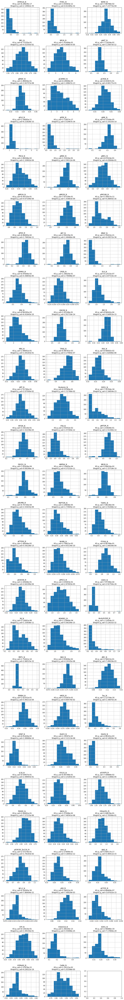

In [203]:
plot_numerical_histograms(mice_train_df, mice_numeric_columns)

Correction: DYRK1A_N
Correction: ITSN1_N
Correction: BDNF_N
Correction: NR1_N
Correction: NR2A_N
Correction: pAKT_N
Correction: pBRAF_N
Correction: pCAMKII_N
Correction: pCREB_N
Correction: pELK_N
Correction: pERK_N
Correction: pJNK_N
Correction: PKCA_N
Correction: pMEK_N
Correction: pNR1_N
Correction: pNR2A_N
Correction: pNR2B_N
Correction: pPKCAB_N
Correction: pRSK_N
Correction: AKT_N
Correction: BRAF_N
Correction: CAMKII_N
Correction: CREB_N
Correction: ELK_N
Correction: ERK_N
Correction: GSK3B_N
Correction: JNK_N
Correction: MEK_N
Correction: TRKA_N
Correction: RSK_N
Correction: APP_N
Correction: Bcatenin_N
Correction: SOD1_N
Correction: MTOR_N
Correction: P38_N
Correction: pMTOR_N
Correction: DSCR1_N
Correction: AMPKA_N
Correction: NR2B_N
Correction: pNUMB_N
Correction: RAPTOR_N
Correction: TIAM1_N
Correction: pP70S6_N
Correction: NUMB_N
Correction: P70S6_N
Correction: pGSK3B_N
Correction: pPKCG_N
Correction: CDK5_N
Correction: S6_N
Correction: ADARB1_N
Correction: AcetylH3K9_N
Co

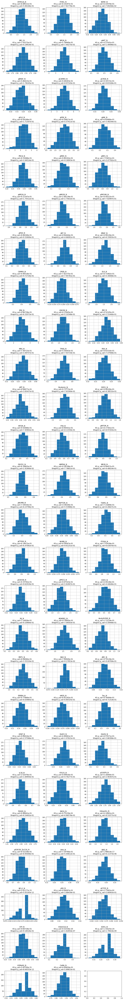

In [204]:
matched_mice_train_df_X_numerical, train_df_X_normal_mapping = transform_dataset(mice_train_df_X_numerical,\
                                                                                 match_to_normal_distribution,\
                                                                                 correction=correction_func)
plot_numerical_histograms(matched_mice_train_df_X_numerical, mice_numeric_columns)

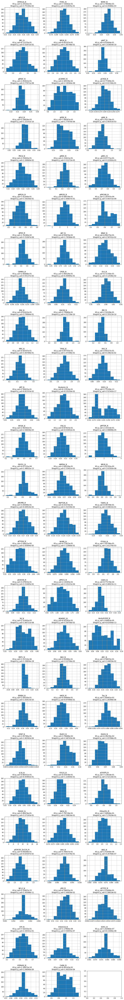

In [205]:
yeo_mice_train_df_X_numerical, train_df_X_yeo_mapping = transform_dataset(mice_train_df_X_numerical, stats.yeojohnson)
plot_numerical_histograms(yeo_mice_train_df_X_numerical, mice_numeric_columns)

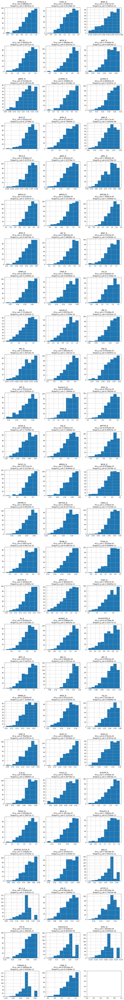

In [206]:
matched_mice_test_df_X_numerical, _ = transform_dataset(mice_test_df_X_numerical, match_to_normal_distribution, train_df_X_normal_mapping)
plot_numerical_histograms(matched_mice_test_df_X_numerical, mice_numeric_columns)

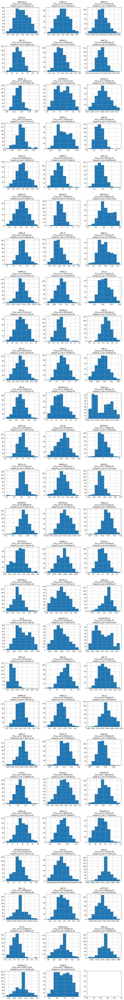

In [207]:
yeo_mice_test_df_X_numerical, _ = transform_dataset(mice_test_df_X_numerical, stats.yeojohnson, train_df_X_yeo_mapping)
plot_numerical_histograms(yeo_mice_test_df_X_numerical, mice_numeric_columns)

## QQ plots of features

### QQ plots for regular features

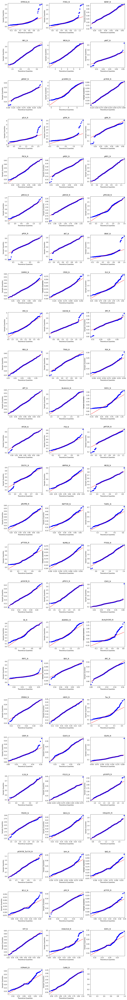

In [208]:
qq_plot_data(mice_train_df_X, mice_numeric_columns)

### QQ plots for Matched features

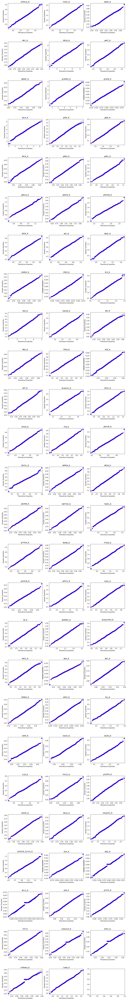

In [209]:
qq_plot_data(matched_mice_train_df_X_numerical, mice_numeric_columns)

### QQ plots for Yeo-Johnson features

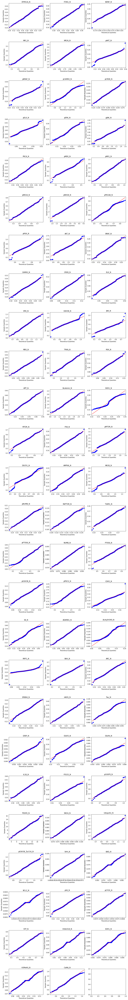

In [210]:
qq_plot_data(yeo_mice_train_df_X_numerical, mice_numeric_columns)

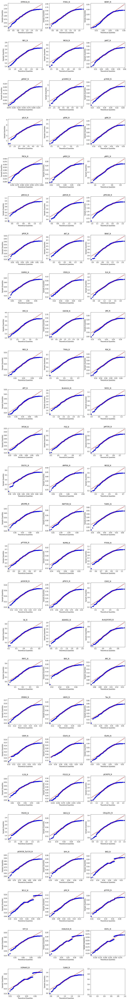

In [211]:
qq_plot_data(matched_mice_test_df_X_numerical, mice_numeric_columns)

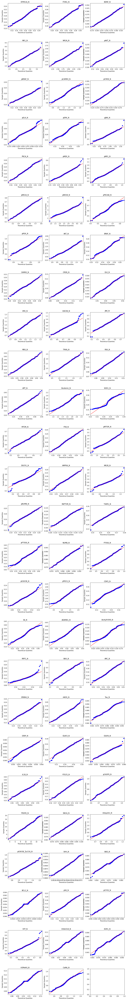

In [212]:
qq_plot_data(yeo_mice_test_df_X_numerical, mice_numeric_columns)

## Compare model preformance

#### Reassemble datasets

In [213]:
matched_mice_train_df_X = pd.concat([matched_mice_train_df_X_numerical, mice_train_df_X_categorical], axis=1)
matched_mice_test_df_X = pd.concat([matched_mice_test_df_X_numerical, mice_test_df_X_categorical], axis=1)

yeo_mice_train_df_X = pd.concat([yeo_mice_train_df_X_numerical, mice_train_df_X_categorical], axis=1)
yeo_mice_test_df_X = pd.concat([yeo_mice_test_df_X_numerical, mice_test_df_X_categorical], axis=1)

### Test on regular data

In [214]:
model = LogisticRegression(multi_class='multinomial', solver='lbfgs')
prediction = model.fit(mice_train_df_X,mice_train_df_y).predict(mice_test_df_X)
print(f'acc={accuracy_score(mice_test_df_y,prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(mice_test_df_y,prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(mice_test_df_y, prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(mice_test_df_y, prediction))))

acc=1.0
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.000
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0


### Test on matched data

In [215]:
matched_model = LogisticRegression(multi_class='multinomial', solver='lbfgs')
matched_prediction = matched_model.fit(matched_mice_train_df_X,mice_train_df_y).predict(matched_mice_test_df_X)
print(f'acc={accuracy_score(mice_test_df_y,matched_prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(mice_test_df_y,matched_prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(mice_test_df_y, matched_prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(mice_test_df_y, matched_prediction))))

acc=1.0
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.000
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0


### Test on Yeo-Johnson data

In [216]:
yeo_model = LogisticRegression(multi_class='multinomial', solver='lbfgs')
yeo_prediction = yeo_model.fit(yeo_mice_train_df_X,mice_train_df_y).predict(yeo_mice_test_df_X)
print(f'acc={accuracy_score(mice_test_df_y,yeo_prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(mice_test_df_y,yeo_prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(mice_test_df_y, yeo_prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(mice_test_df_y, yeo_prediction))))

acc=0.9976851851851852
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.001
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0


## Try to normalize only 1 column at a time and Compare to regular model

In [217]:
 compare_one_norm_column(mice_train_df_X, mice_test_df_X, mice_train_df_y,\
                         mice_test_df_y, matched_mice_train_df_X, matched_mice_test_df_X,\
                         yeo_mice_train_df_X, yeo_mice_test_df_X,\
                         'class', mice_numeric_columns,acc=True)

=== Measure for regular model: ===
column=class, acc=1.0
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.000
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0

=== Compare for column DYRK1A_N ===
column=DYRK1A_N, matched acc=1.0
column=DYRK1A_N, yeo acc=1.0

=== Compare for column ITSN1_N ===
column=ITSN1_N, matched acc=1.0
column=ITSN1_N, yeo acc=1.0

=== Compare for column BDNF_N ===
column=BDNF_N, matched acc=1.0
column=BDNF_N, yeo acc=1.0

=== Compare for column NR1_N ===
column=NR1_N, matched acc=1.0
column=NR1_N, yeo acc=1.0

=== Compare for column NR2A_N ===
column=NR2A_N, matched acc=1.0
column=NR2A_N, yeo acc=1.0

=== Compare for column pAKT_N ===
column=pAKT_N, matched acc=1.0
column=pAKT_N, yeo acc=1.0

=== Compare for column pBRAF_N ===
column=pBRAF_N, matched acc=1.0
column=pBRAF_N, yeo acc=1.0

=== Compare for column pCAMKII_N ===
column=pCAMKII_N, matched acc=1.0
column=pCAMKII_N, yeo acc=1.0

=== Compare for column pCREB_N ===
col

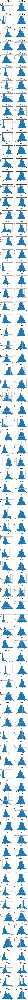

In [218]:
plot_histograms_side_by_side(mice_train_df_X[mice_numeric_columns], matched_mice_train_df_X[mice_numeric_columns])

# Try on Sixth Dataset (Classification)

https://www.kaggle.com/iabhishekofficial/mobile-price-classification

## Preprocess Dataset

In [224]:
!kaggle datasets download -d iabhishekofficial/mobile-price-classification

mobile-price-classification.zip: Skipping, found more recently modified local copy (use --force to force download)


In [225]:
!if [ ! -f datasets/mobile_train.csv ]; then kaggle datasets download --unzip -d iabhishekofficial/mobile-price-classification -p datasets/; fi;

In [226]:
!mv ./datasets/train.csv ./datasets/mobile_train.csv
!mv ./datasets/test.csv ./datasets/mobile_test.csv

mv: cannot stat './datasets/train.csv': No such file or directory
mv: cannot stat './datasets/test.csv': No such file or directory


In [227]:
mobile_df = pd.read_csv('./datasets/mobile_train.csv')
mobile_test_df = pd.read_csv('./datasets/mobile_test.csv')

In [228]:
mobile_df.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


In [229]:
mobile_df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [230]:
mobile_numeric_columns, mobile_categorical_columns = get_numeric_categorical_columns(mobile_df, ['price_range'], threshold_prec=5)

column: battery_power, %: 54.7
column: blue, %: 0.1
column: clock_speed, %: 1.3
column: dual_sim, %: 0.1
column: fc, %: 1.0
column: four_g, %: 0.1
column: int_memory, %: 3.15
column: m_dep, %: 0.5
column: mobile_wt, %: 6.05
column: n_cores, %: 0.4
column: pc, %: 1.05
column: px_height, %: 56.85
column: px_width, %: 55.45
column: ram, %: 78.10000000000001
column: sc_h, %: 0.75
column: sc_w, %: 0.95
column: talk_time, %: 0.95
column: three_g, %: 0.1
column: touch_screen, %: 0.1
column: wifi, %: 0.1
numeric_columns = ['battery_power', 'mobile_wt', 'px_height', 'px_width', 'ram']
categorical_columns = ['blue', 'clock_speed', 'dual_sim', 'fc', 'four_g', 'int_memory', 'm_dep', 'n_cores', 'pc', 'sc_h', 'sc_w', 'talk_time', 'three_g', 'touch_screen', 'wifi']


In [231]:
mobile_train_df, mobile_val_df = train_test_split(mobile_df, test_size=0.15)

print(mobile_train_df.shape)
print(mobile_val_df.shape)

(1700, 21)
(300, 21)


In [232]:
mobile_train_df_X = mobile_train_df.drop(['price_range'], axis=1)
mobile_val_df_X = mobile_val_df.drop(['price_range'], axis=1)

mobile_train_df_y = mobile_train_df.price_range
mobile_val_df_y = mobile_val_df.price_range

## Visualize Histogram of features

In [233]:
mobile_train_df_X_categorical = mobile_train_df_X[mobile_categorical_columns]
mobile_val_df_X_categorical = mobile_val_df_X[mobile_categorical_columns]

In [234]:
mobile_train_df_X_numerical = mobile_train_df_X[mobile_numeric_columns]
mobile_val_df_X_numerical = mobile_val_df_X[mobile_numeric_columns]

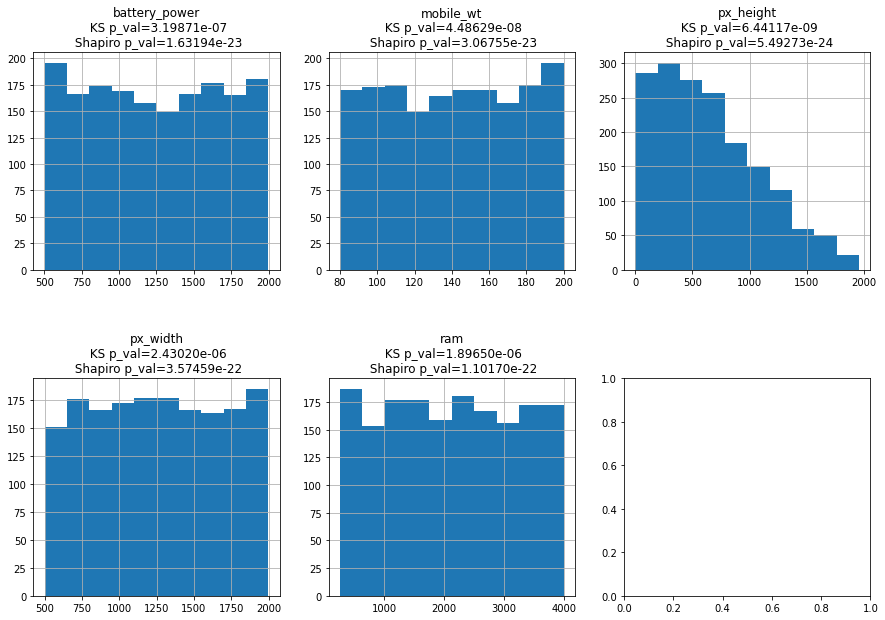

In [235]:
plot_numerical_histograms(mobile_train_df_X, mobile_numeric_columns)

Correction: battery_power
Correction: mobile_wt
Correction: px_height
Correction: px_width
Correction: ram


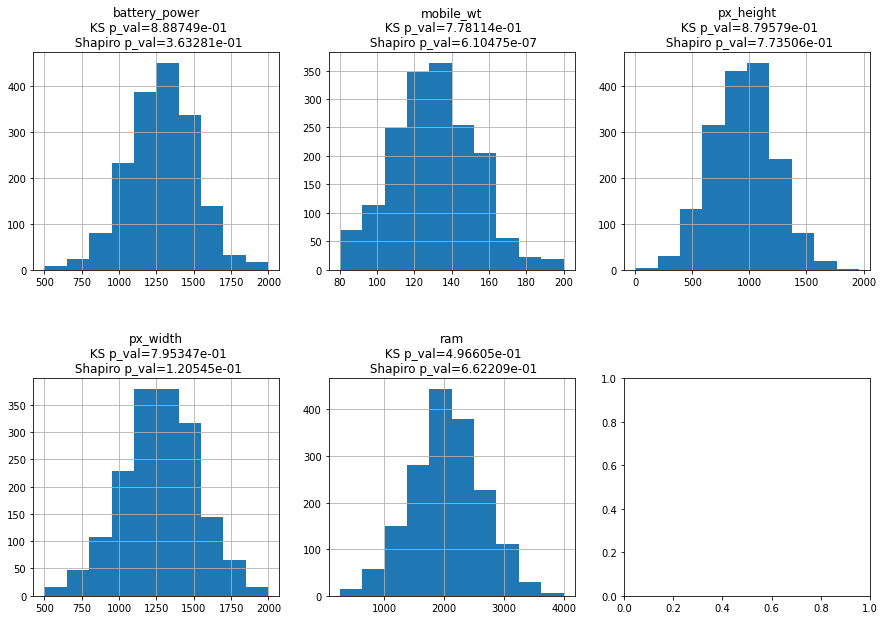

In [236]:
matched_mobile_train_df_X_numerical, train_df_X_normal_mapping = transform_dataset(mobile_train_df_X_numerical,\
                                                                                   match_to_normal_distribution,\
                                                                                   correction=correction_func)

matched_mobile_train_df_X_numerical_not, train_df_X_normal_mapping_not = transform_dataset(mobile_train_df_X_numerical,\
                                                                                   match_to_normal_distribution)

plot_numerical_histograms(matched_mobile_train_df_X_numerical, mobile_numeric_columns)

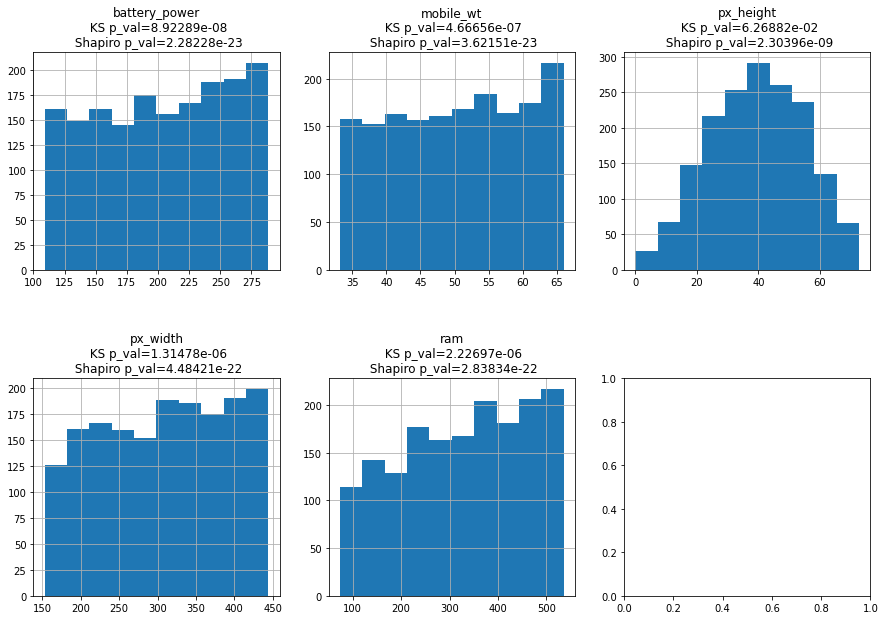

In [237]:
yeo_mobile_train_df_X_numerical, train_df_X_yeo_mapping = transform_dataset(mobile_train_df_X_numerical, stats.yeojohnson)
plot_numerical_histograms(yeo_mobile_train_df_X_numerical, mobile_numeric_columns)

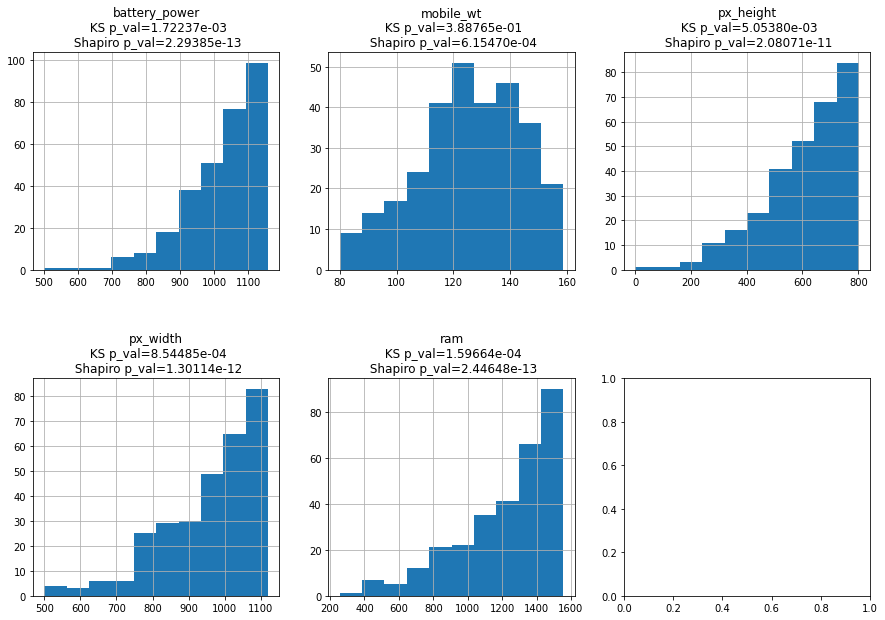

In [238]:
matched_mobile_val_df_X_numerical, _ = transform_dataset(mobile_val_df_X_numerical, match_to_normal_distribution, train_df_X_normal_mapping)
plot_numerical_histograms(matched_mobile_val_df_X_numerical, mobile_numeric_columns)

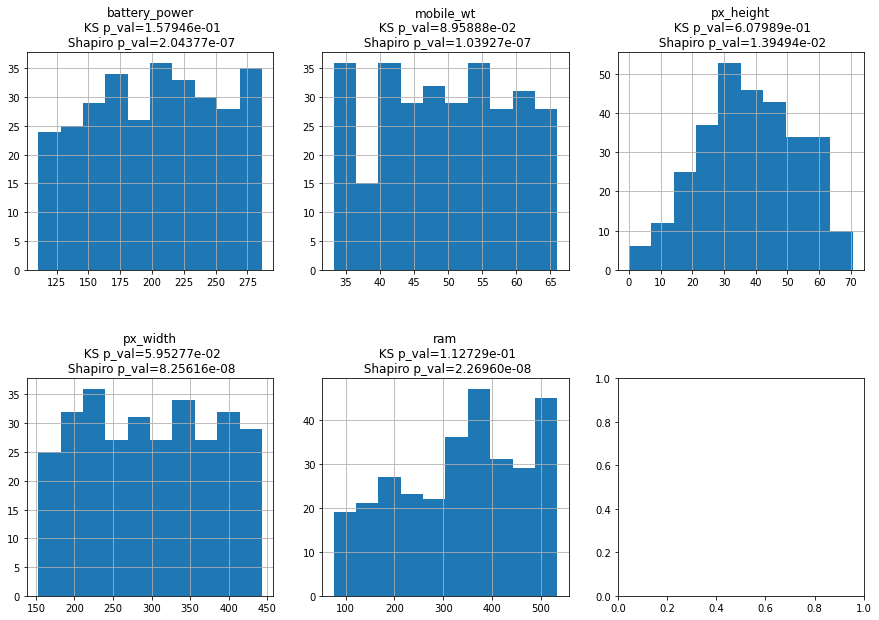

In [239]:
yeo_mobile_val_df_X_numerical, _ = transform_dataset(mobile_val_df_X_numerical, stats.yeojohnson, train_df_X_yeo_mapping)
plot_numerical_histograms(yeo_mobile_val_df_X_numerical, mobile_numeric_columns)

## QQ plots of features

### QQ plots for regular features

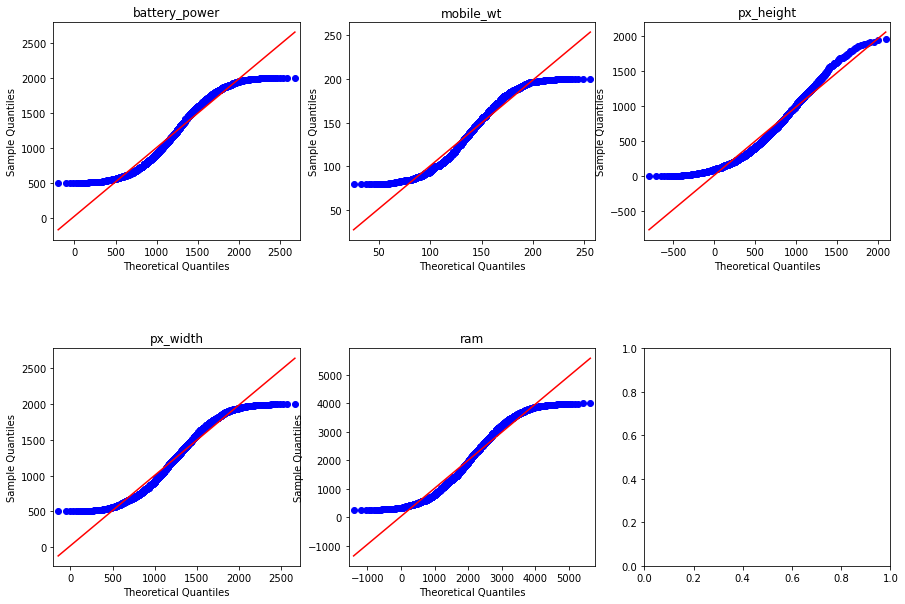

In [240]:
qq_plot_data(mobile_train_df_X, mobile_numeric_columns)

### QQ plots for Matched features

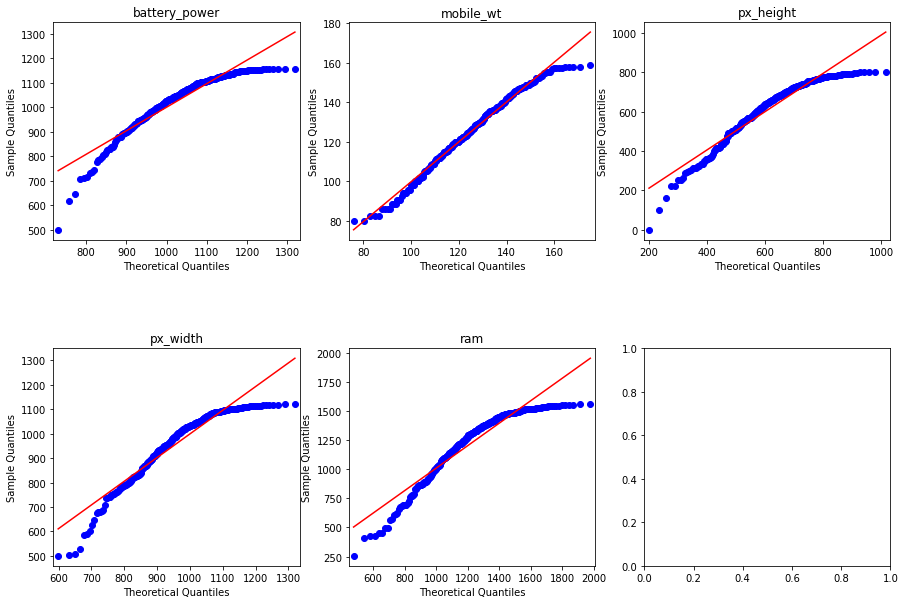

In [241]:
qq_plot_data(matched_mobile_val_df_X_numerical, mobile_numeric_columns)

### QQ plots for Yeo-Johnson features

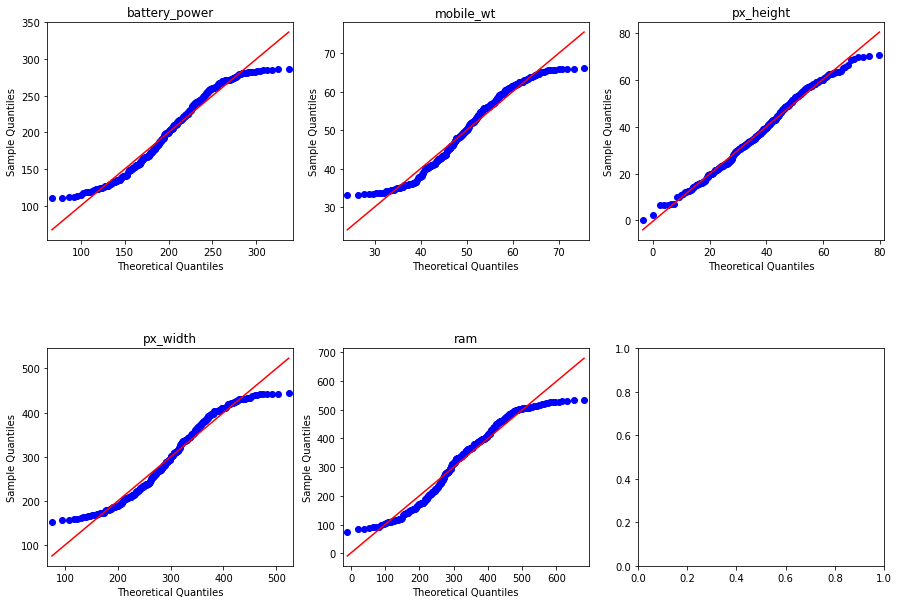

In [242]:
qq_plot_data(yeo_mobile_val_df_X_numerical, mobile_numeric_columns)

## Compare model preformance

### Reassemble Dataset

In [243]:
matched_mobile_train_df_X = pd.concat([matched_mobile_train_df_X_numerical, mobile_train_df_X_categorical], axis=1)

matched_mobile_val_df_X = pd.concat([matched_mobile_val_df_X_numerical, mobile_val_df_X_categorical], axis=1)

yeo_mobile_train_df_X = pd.concat([yeo_mobile_train_df_X_numerical, mobile_train_df_X_categorical], axis=1)

yeo_mobile_val_df_X = pd.concat([yeo_mobile_val_df_X_numerical, mobile_val_df_X_categorical], axis=1)

### Test on regular data

In [244]:
model = LogisticRegression(multi_class='multinomial', solver='lbfgs')
prediction = model.fit(mobile_train_df_X,mobile_train_df_y).predict(mobile_val_df_X)
print(f'acc={accuracy_score(mobile_val_df_y,prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(mobile_val_df_y,prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(mobile_val_df_y, prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(mobile_val_df_y, prediction))))

acc=0.6233333333333333
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 240,191,980,126,426.656
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 1


### Test on matched data

In [245]:
matched_model = LogisticRegression(multi_class='multinomial', solver='lbfgs')
matched_prediction = matched_model.fit(matched_mobile_train_df_X,mobile_train_df_y).predict(matched_mobile_val_df_X)
print(f'acc={accuracy_score(mobile_val_df_y,matched_prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(mobile_val_df_y,matched_prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(mobile_val_df_y, matched_prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(mobile_val_df_y, matched_prediction))))

acc=0.2633333333333333
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.682
Mean Absolute Error (Σ|y - pred|/n): 1
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 2


### Test on Yeo-Johnson data

In [246]:
yeo_model = LogisticRegression(multi_class='multinomial', solver='lbfgs')
yeo_prediction = yeo_model.fit(yeo_mobile_train_df_X,mobile_train_df_y).predict(yeo_mobile_val_df_X)
print(f'acc={accuracy_score(mobile_val_df_y,yeo_prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(mobile_val_df_y,yeo_prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(mobile_val_df_y, yeo_prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(mobile_val_df_y, yeo_prediction))))

acc=0.6266666666666667
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 270,215,977,642,229.969
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 1


## Try to normalize only 1 column at a time and Compare to regular model

In [247]:
compare_one_norm_column(mobile_train_df_X, mobile_val_df_X, mobile_train_df_y, mobile_val_df_y,\
                        matched_mobile_train_df_X, matched_mobile_val_df_X, yeo_mobile_train_df_X,\
                        yeo_mobile_val_df_X, 'price_range', mobile_numeric_columns, acc=True)

=== Measure for regular model: ===
column=price_range, acc=0.6233333333333333
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 240,191,980,126,426.656
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 1

=== Compare for column battery_power ===
column=battery_power, matched acc=0.6333333333333333
column=battery_power, yeo acc=0.6266666666666667

=== Compare for column mobile_wt ===
column=mobile_wt, matched acc=0.7466666666666667
column=mobile_wt, yeo acc=0.72

=== Compare for column px_height ===
column=px_height, matched acc=0.6166666666666667
column=px_height, yeo acc=0.6166666666666667

=== Compare for column px_width ===
column=px_width, matched acc=0.6133333333333333
column=px_width, yeo acc=0.64

=== Compare for column ram ===
column=ram, matched acc=0.30666666666666664
column=ram, yeo acc=0.56



## Get insights about the data

In [248]:
mobile_insights = get_insights(mobile_train_df_X[mobile_numeric_columns])
mobile_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
battery_power,501,1998,1240.918824,1231.0,443.059905,1.963021e+05,0.019476,-1.236238,6.792669
mobile_wt,80,200,140.594118,141.0,35.525384,1.262053e+03,0.001629,-1.220176,4.757379
px_height,0,1960,650.828235,577.5,444.937277,1.979692e+05,0.657955,-0.315937,6.820375
px_width,500,1998,1258.185882,1257.0,432.686945,1.872180e+05,-0.009031,-1.182217,6.815842
ram,256,3998,2115.907059,2118.5,1088.125015,1.184016e+06,0.019770,-1.198675,7.172477


In [249]:
matched_mobile_insights = get_insights(matched_mobile_train_df_X[mobile_numeric_columns])
matched_mobile_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
battery_power,501.0,1998.0,1284.183991,1283.045112,222.758286,49621.254141,-0.009648,0.159596,6.792669
mobile_wt,80.0,200.0,130.702823,130.018308,22.107143,488.725763,0.175206,0.131611,4.757379
px_height,0.0,1960.0,947.809467,953.006880,271.646964,73792.073261,0.011237,-0.117969,6.820375
px_width,500.0,1998.0,1276.455661,1276.030839,255.702797,65383.920456,-0.074900,-0.026431,6.815842
ram,256.0,3998.0,2047.340809,2045.270250,589.378129,347366.579358,-0.022761,-0.068586,7.172477


In [250]:
matched_not_mobile_insights = get_insights(matched_mobile_train_df_X_numerical_not[mobile_numeric_columns])
matched_not_mobile_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
battery_power,-447.928279,2488.820562,1234.425478,1246.647104,438.878037,1.926139e+05,-0.094021,0.066451,6.792669
mobile_wt,62.371404,273.202548,142.799553,141.416663,36.702954,1.347107e+03,0.368098,0.697214,4.757379
px_height,-741.088049,2280.165174,660.940458,662.217010,442.840518,1.961077e+05,-0.063087,0.125481,6.820375
px_width,15.264774,2689.013432,1261.900956,1264.164362,430.158752,1.850366e+05,-0.008364,-0.329713,6.815842
ram,-1315.506201,5896.139858,2126.585414,2126.235418,1058.456738,1.120331e+06,0.016592,-0.090988,7.172477


In [251]:
yeo_mobile_insights = get_insights(yeo_mobile_train_df_X[mobile_numeric_columns])
yeo_mobile_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
battery_power,108.961962,288.510127,203.515164,205.305102,52.684869,2775.695431,-0.113504,-1.207527,6.792669
mobile_wt,33.163461,66.047491,50.395266,50.832270,9.687336,93.844474,-0.078831,-1.206227,4.757379
px_height,0.000000,72.759085,39.482086,40.083549,15.304215,234.219004,-0.114912,-0.657767,6.820375
px_width,152.679905,444.188693,307.644113,310.895519,83.451928,6964.224265,-0.115239,-1.151854,6.815842
ram,73.466052,535.806086,328.295858,339.144069,130.542808,17041.424815,-0.195800,-1.105805,7.172477


In [252]:
mobile_insights - matched_not_mobile_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
battery_power,948.928279,-490.820562,6.493345,-15.647104,4.181868,3688.147820,0.113497,-1.302689,0.0
mobile_wt,17.628596,-73.202548,-2.205435,-0.416663,-1.177570,-85.053899,-0.366469,-1.917390,0.0
px_height,741.088049,-320.165174,-10.112222,-84.717010,2.096759,1861.456417,0.721042,-0.441418,0.0
px_width,484.735226,-691.013432,-3.715074,-7.164362,2.528193,2181.440535,-0.000667,-0.852504,0.0
ram,1571.506201,-1898.139858,-10.678355,-7.735418,29.668277,63685.381997,0.003177,-1.107688,0.0


In [253]:
mobile_insights - matched_mobile_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
battery_power,0.0,0.0,-43.265168,-52.045112,220.301619,146680.825198,0.029123,-1.395833,0.0
mobile_wt,0.0,0.0,9.891295,10.981692,13.418242,773.327175,-0.173577,-1.351787,0.0
px_height,0.0,0.0,-296.981232,-375.506880,173.290313,124177.107342,0.646717,-0.197967,0.0
px_width,0.0,0.0,-18.269778,-19.030839,176.984148,121834.072046,0.065869,-1.155786,0.0
ram,0.0,0.0,68.566250,73.229750,498.746885,836649.468503,0.042531,-1.130090,0.0


In [254]:
mobile_insights - yeo_mobile_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
battery_power,392.038038,1709.489873,1037.403660,1025.694898,390.375036,1.935264e+05,0.132980,-0.028711,0.0
mobile_wt,46.836539,133.952509,90.198851,90.167730,25.838049,1.168208e+03,0.080460,-0.013949,0.0
px_height,0.000000,1887.240915,611.346150,537.416451,429.633062,1.977350e+05,0.772867,0.341831,0.0
px_width,347.320095,1553.811307,950.541770,946.104481,349.235017,1.802538e+05,0.106209,-0.030363,0.0
ram,182.533948,3462.193914,1787.611201,1779.355931,957.582206,1.166975e+06,0.215570,-0.092870,0.0


## Plot distributions

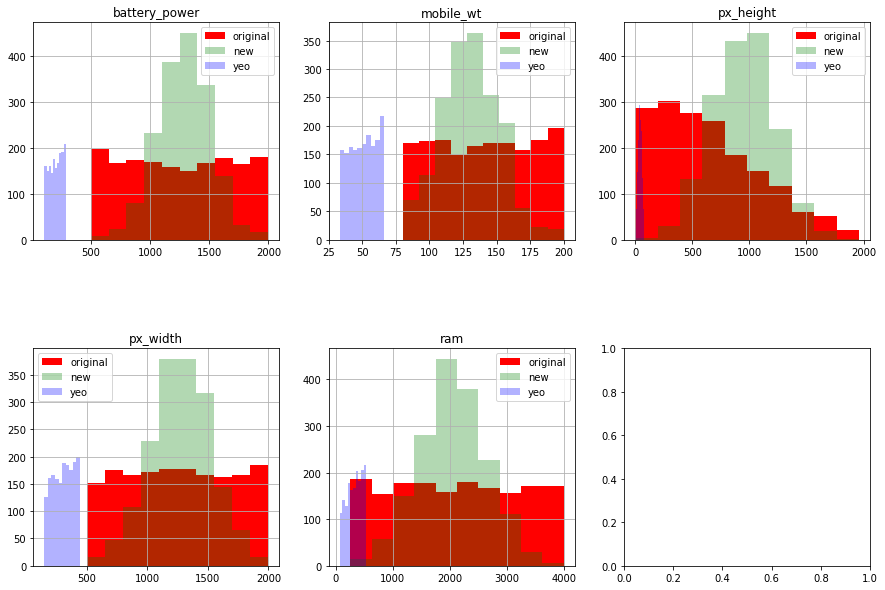

In [255]:
plot_histograms(mobile_train_df_X[mobile_numeric_columns], 
                matched_mobile_train_df_X[mobile_numeric_columns], 
                yeo_mobile_train_df_X[mobile_numeric_columns])

## Plot a Heatmap of all columns to targets

In [256]:
matched_mobile_df_corr = pd.concat([matched_mobile_train_df_X, mobile_train_df_y], axis=1)
yeo_mobile_df_corr = pd.concat([yeo_mobile_train_df_X, mobile_train_df_y], axis=1)

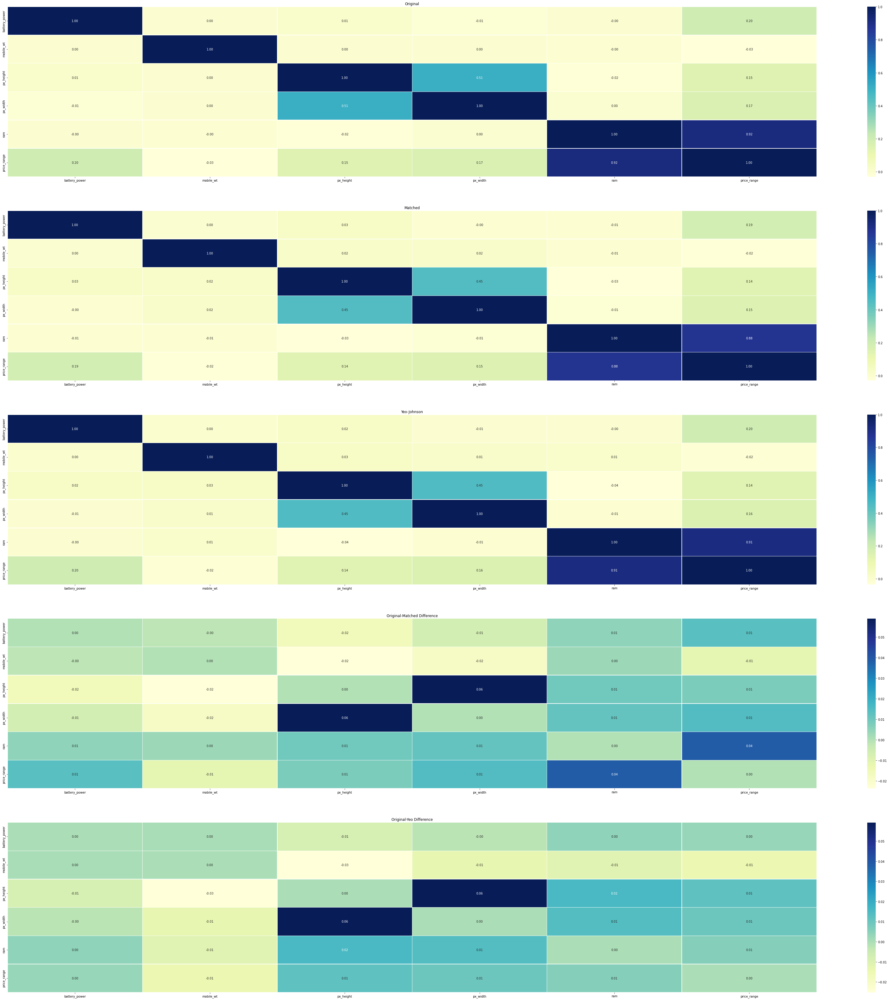

In [257]:
plot_correlation_heatmaps(mobile_df, matched_mobile_df_corr, yeo_mobile_df_corr, mobile_numeric_columns + ['price_range'])

In [258]:
for column in mobile_train_df_y.to_frame().columns:
    print(f'{"=" * 15} Compare sum of corr for target column: {column} {"=" * 15}')
    print('matched corr sum:', matched_mobile_df_corr.corr(method='pearson').loc[column].abs().sum())
    print('yeo corr sum:', yeo_mobile_df_corr.corr(method='pearson').loc[column].abs().sum())

=============== Compare sum of corr for target column: price_range ===============
matched corr sum: 2.6878675892879045
yeo corr sum: 2.7292938612018527


In [259]:
mobile_diff_corr_df = pd.concat([
           matched_mobile_df_corr.corr(method='pearson').abs().sum(axis=1).rename('matched').to_frame(),
           yeo_mobile_df_corr.corr(method='pearson').abs().sum(axis=1).rename('yeo').to_frame()
], axis=1)

def highlight_max(s, props=''):
    return np.where(s == np.nanmax(s.values), props, '')

mobile_diff_corr_df.style.apply(highlight_max, props='color:white;background-color:darkblue', axis=1)

,matched,yeo
battery_power,1.556856,1.548422
mobile_wt,1.387489,1.357230
px_height,2.044222,2.037644
px_width,1.856808,1.878921
ram,2.237468,2.283279
blue,1.348698,1.336645
clock_speed,1.357662,1.352238
dual_sim,1.448808,1.431963
fc,1.934625,1.954860
four_g,1.975392,1.976999


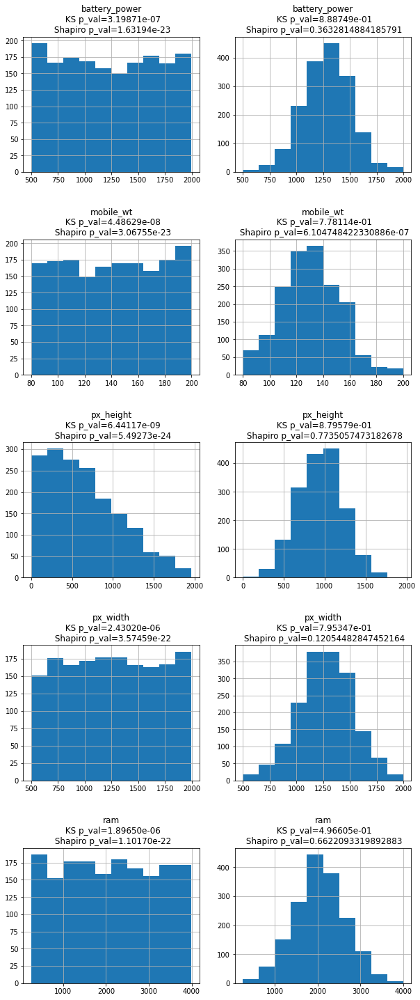

In [260]:
plot_histograms_side_by_side(mobile_train_df_X[mobile_numeric_columns], matched_mobile_train_df_X[mobile_numeric_columns])